In [1]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.dates import (YEARLY, DateFormatter,
                              rrulewrapper, RRuleLocator, drange)
import datetime   # package that helps manipulate dates
import matplotlib.dates as mdates
import calendar

from dateutil.parser import parse     # package for date parsing
from prophet import Prophet
from pmdarima import auto_arima




# Aqicn data

If you are working with data from aqicn.org, then you need to run this code before using rolling_prophet_forcast_CI_with arima.

In [2]:
def change_df (df):
    data = df.copy()
    data.date = pd.to_datetime(data.date)
    data = data.sort_values(by ='date', ascending= False)

    data.columns = ['date','PM25','PM10','O3','NO2','SO2','CO']

    for col in data.columns:
        if col != 'date':
            data[col] = pd.to_numeric(data[col], errors ='coerce')
    data = data.dropna()
    data = data.sort_values('date', ascending =False)
    return data




# Nasa data

If you are working with data from NASA, then you need to run this code before using rolling_prophet_forcast_CI_with_arima.

In [3]:
def cleaning_NASA_data(a, pollutant):
    """
    Cleans NASA CSV data: renames columns, drops metadata rows, converts types, sorts by date,
    and filters for positive values of the pollutant.
    """
    a.columns = ['date', pollutant]
    a.drop(list(range(0, 7)), inplace=True)  # drops first 7 rows, adjust if necessary
    a[pollutant] = pd.to_numeric(a[pollutant], errors='coerce')
    a['date'] = pd.to_datetime(a['date'])
    a = a.sort_values('date')
    a = a[a[pollutant] > 0]
    a = a.reset_index(drop=True)
    return a


In [4]:
def make_agg(df, freq='D', pollutant='NO2'):
    df_agg = df.copy()
    df_agg['date'] = pd.to_datetime(df_agg['date'])
    if freq == 'D':
        df_agg = df_agg[['date', pollutant]]
        return df_agg.rename(columns={pollutant:  pollutant})
    elif freq == 'W':
        df_agg['date'] = df_agg['date'].dt.to_period('W').dt.start_time
        result = df_agg.groupby('date')[pollutant].mean().reset_index()
        return result.rename(columns={pollutant:  pollutant})
    elif freq == 'M':
        df_agg['date'] = df_agg['date'].dt.to_period('M').dt.start_time
        result = df_agg.groupby('date')[pollutant].mean().reset_index()
        return result.rename(columns={pollutant:  pollutant })
    else:
        raise ValueError("freq must be 'D', 'W', or 'M'")

In [5]:
from pmdarima import auto_arima

def rolling_prophet_forecast_CI_with_arima(
    df, pollutant='NO2', train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
):
    # Prophet rolling
    df = df.sort_values('date').reset_index(drop=True)
    df_prophet = df.rename(columns={'date':'ds', pollutant:'y'})[['ds','y']].dropna()
    results = []
    for train_end in range(train_steps, len(df_prophet)-test_steps+1, step):
        train = df_prophet.iloc[:train_end]
        test  = df_prophet.iloc[train_end:train_end+test_steps]
        m = Prophet(yearly_seasonality=True, weekly_seasonality=(freq!='M'), daily_seasonality=(freq=='D'), interval_width=0.95)
        m.fit(train)
        fcst = m.predict(test[['ds']])
        pred = fcst['yhat'].values
        lower = fcst['yhat_lower'].values
        upper = fcst['yhat_upper'].values
        y_true = test['y'].values
        for i in range(len(pred)):
            results.append({
                'ds': test['ds'].values[i],
                'real': y_true[i],
                'prophet_pred': pred[i],
                'lower_CI': lower[i],
                'upper_CI': upper[i]
            })
        del m

    results_df = pd.DataFrame(results)
    results_df = results_df.drop_duplicates(subset=['ds'])
    # Prophet residual
    results_df['residual'] = results_df['real'] - results_df['prophet_pred']
    # ARIMA modification
    arima_mod = auto_arima(results_df['residual'].values, seasonal=False, suppress_warnings=True, stepwise=True, error_action='ignore')
    arima_pred = arima_mod.predict_in_sample()
    results_df['arima_correction'] = arima_pred
    results_df['final_pred'] = results_df['prophet_pred'] + arima_pred
    results_df['arima_residual'] = results_df['real'] - results_df['final_pred']
    sigma = results_df['arima_residual'].std()
    results_df['zscore'] = results_df['arima_residual'] / sigma if sigma > 0 else 0
    results_df['outlier'] = np.abs(results_df['zscore']) > z_thresh

    if plot:
        plt.figure(figsize=(15,5))
        plt.plot(results_df['ds'], results_df['real'], color='gray', alpha=0.4, label='Observed')
        plt.plot(results_df['ds'], results_df['final_pred'], color='blue', label='Prophet(rolling)+ARIMA')
        plt.fill_between(results_df['ds'], results_df['lower_CI'], results_df['upper_CI'], color='skyblue', alpha=0.18, label='Prophet 95% CI')
        plt.scatter(results_df.loc[results_df['outlier'], 'ds'],
                    results_df.loc[results_df['outlier'], 'real'],
                    color='red', s=32, label=f'Anomaly (|z|>{z_thresh})')
        plt.xlabel('Date'); plt.ylabel(pollutant.upper())
        plt.title(f'Prophet(rolling)+ARIMA: Prediction, CI, Residual, Anomaly [{freq}]')
        plt.legend(); plt.tight_layout(); plt.show()

    return results_df



In [6]:
def plot_arima_anomaly_band(results_df, pollutant='NO2', shading_k=3, z_thresh=3, freq='D'):
    """
    results_df: DataFrame with columns ['ds', 'real', 'final_pred', 'arima_residual', 'outlier']
    """
    sigma = results_df['arima_residual'].std()
    # 신뢰구간 계산
    lower = results_df['final_pred'] - shading_k * sigma
    upper = results_df['final_pred'] + shading_k * sigma

    plt.figure(figsize=(15,5))
    plt.plot(results_df['ds'], results_df['real'], color='gray', alpha=0.4, label='Observed')
    plt.plot(results_df['ds'], results_df['final_pred'], color='blue', label='Prophet(rolling)+ARIMA')
    plt.fill_between(results_df['ds'], lower, upper, color='skyblue', alpha=0.18, label=f'Prophet+ARIMA ±{shading_k}σ')
    plt.scatter(results_df.loc[results_df['outlier'], 'ds'],
                results_df.loc[results_df['outlier'], 'real'],
                color='red', s=32, label=f'Anomaly (|z|>{z_thresh})')
    plt.xlabel('Date'); plt.ylabel(pollutant.upper())
    plt.title(f'Prophet(rolling)+ARIMA: Prediction, Anomaly Band, Outlier [{freq}]')
    plt.legend(); plt.tight_layout(); plt.show()

In [7]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
import matplotlib.pyplot as plt

def residual_diagnostics(res_df, lags=[10, 20, 30], title=''):
    resid = res_df['arima_residual'].values
    max_lags = min(max(lags), len(resid)//2 - 1)  # 데이터 길이에 맞춰 최대 lags 제한
    lags_to_use = [lag for lag in lags if lag <= max_lags]
    
    import matplotlib.pyplot as plt
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    from statsmodels.stats.diagnostic import acorr_ljungbox

    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plot_acf(resid, lags=max_lags, zero=False, ax=plt.gca())
    plt.title(f'ACF {title}')
    plt.subplot(1,2,2)
    plot_pacf(resid, lags=max_lags, zero=False, ax=plt.gca())
    plt.title(f'PACF {title}')
    plt.tight_layout()
    plt.show()

    lb = acorr_ljungbox(resid, lags=lags_to_use, return_df=True)
    print(f'Ljung-Box Test {title} (using lags {lags_to_use}):\n{lb}\n')


# Cangzhou Plant

In [8]:
df_czh_NASA = pd.read_csv('Huaneng/Huaneng_cangzhou.csv')
df_czh_NASA = cleaning_NASA_data(df_czh_NASA,'NO2')
df_czh_NASA

,date,NO2
0,2014-01-01,8.034345e+15
1,2014-01-03,1.087724e+16
2,2014-01-04,3.922856e+16
3,2014-01-05,1.767063e+16
4,2014-01-06,1.518002e+16
...,...,...
1509,2025-06-24,5.116112e+15
1510,2025-06-27,4.261947e+15
1511,2025-06-28,5.827209e+15
1512,2025-06-29,5.063577e+15


01:54:30 - cmdstanpy - INFO - Chain [1] start processing
01:54:30 - cmdstanpy - INFO - Chain [1] done processing
01:54:30 - cmdstanpy - INFO - Chain [1] start processing
01:54:30 - cmdstanpy - INFO - Chain [1] done processing
01:54:30 - cmdstanpy - INFO - Chain [1] start processing
01:54:30 - cmdstanpy - INFO - Chain [1] done processing
01:54:30 - cmdstanpy - INFO - Chain [1] start processing
01:54:30 - cmdstanpy - INFO - Chain [1] done processing
01:54:30 - cmdstanpy - INFO - Chain [1] start processing
01:54:30 - cmdstanpy - INFO - Chain [1] done processing
01:54:31 - cmdstanpy - INFO - Chain [1] start processing
01:54:31 - cmdstanpy - INFO - Chain [1] done processing
01:54:31 - cmdstanpy - INFO - Chain [1] start processing
01:54:31 - cmdstanpy - INFO - Chain [1] done processing
01:54:31 - cmdstanpy - INFO - Chain [1] start processing
01:54:31 - cmdstanpy - INFO - Chain [1] done processing
01:54:31 - cmdstanpy - INFO - Chain [1] start processing
01:54:31 - cmdstanpy - INFO - Chain [1]

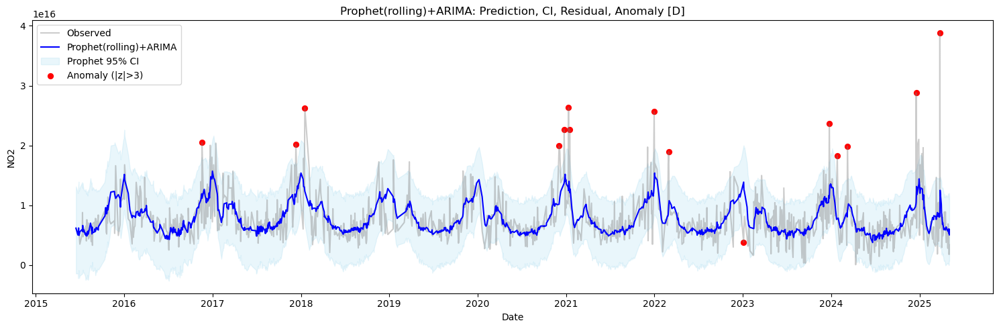

01:54:41 - cmdstanpy - INFO - Chain [1] start processing
01:54:41 - cmdstanpy - INFO - Chain [1] done processing
01:54:41 - cmdstanpy - INFO - Chain [1] start processing
01:54:41 - cmdstanpy - INFO - Chain [1] done processing
01:54:41 - cmdstanpy - INFO - Chain [1] start processing
01:54:41 - cmdstanpy - INFO - Chain [1] done processing
01:54:41 - cmdstanpy - INFO - Chain [1] start processing
01:54:41 - cmdstanpy - INFO - Chain [1] done processing
01:54:42 - cmdstanpy - INFO - Chain [1] start processing
01:54:42 - cmdstanpy - INFO - Chain [1] done processing
01:54:42 - cmdstanpy - INFO - Chain [1] start processing
01:54:42 - cmdstanpy - INFO - Chain [1] done processing
01:54:42 - cmdstanpy - INFO - Chain [1] start processing
01:54:42 - cmdstanpy - INFO - Chain [1] done processing
01:54:42 - cmdstanpy - INFO - Chain [1] start processing
01:54:43 - cmdstanpy - INFO - Chain [1] done processing
01:54:43 - cmdstanpy - INFO - Chain [1] start processing
01:54:43 - cmdstanpy - INFO - Chain [1]

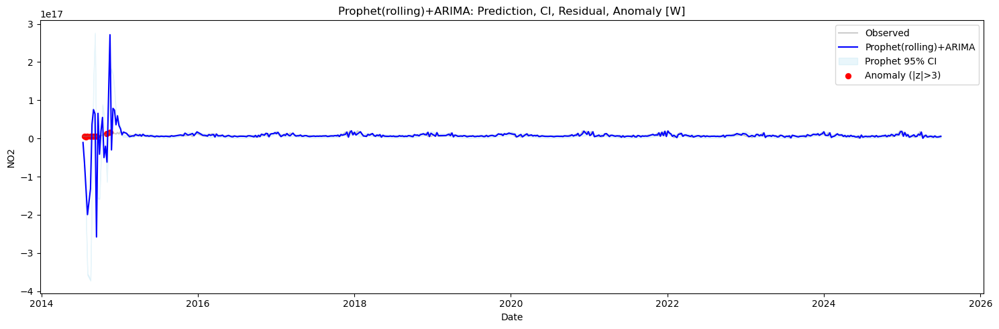

01:55:08 - cmdstanpy - INFO - Chain [1] start processing
01:55:08 - cmdstanpy - INFO - Chain [1] done processing
01:55:08 - cmdstanpy - INFO - Chain [1] start processing
01:55:08 - cmdstanpy - INFO - Chain [1] done processing
01:55:08 - cmdstanpy - INFO - Chain [1] start processing
01:55:08 - cmdstanpy - INFO - Chain [1] done processing
01:55:08 - cmdstanpy - INFO - Chain [1] start processing
01:55:09 - cmdstanpy - INFO - Chain [1] done processing
01:55:09 - cmdstanpy - INFO - Chain [1] start processing
01:55:09 - cmdstanpy - INFO - Chain [1] done processing
01:55:09 - cmdstanpy - INFO - Chain [1] start processing
01:55:15 - cmdstanpy - INFO - Chain [1] done processing
01:55:15 - cmdstanpy - INFO - Chain [1] start processing
01:55:17 - cmdstanpy - INFO - Chain [1] done processing
01:55:17 - cmdstanpy - INFO - Chain [1] start processing
01:55:21 - cmdstanpy - INFO - Chain [1] done processing
01:55:22 - cmdstanpy - INFO - Chain [1] start processing
01:55:28 - cmdstanpy - INFO - Chain [1]

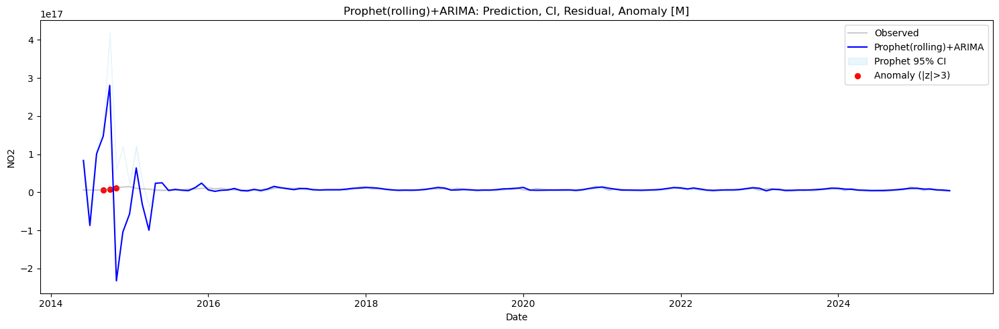

In [9]:
df_czh_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_czh_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=200, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_czh_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_czh_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=25, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_czh_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_czh_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=5, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

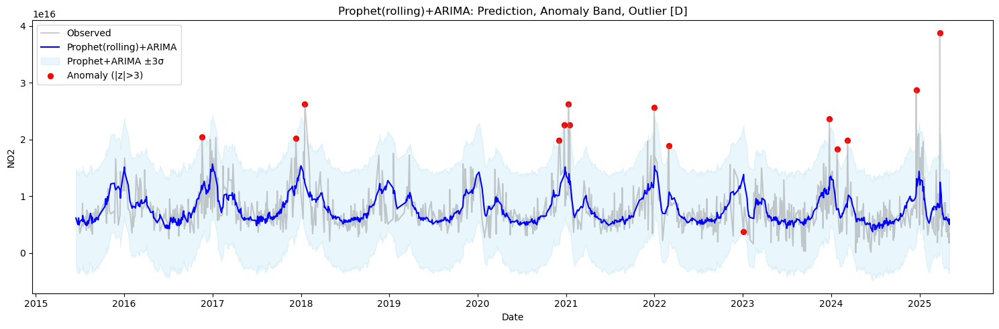

In [10]:
plot_arima_anomaly_band(df_czh_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


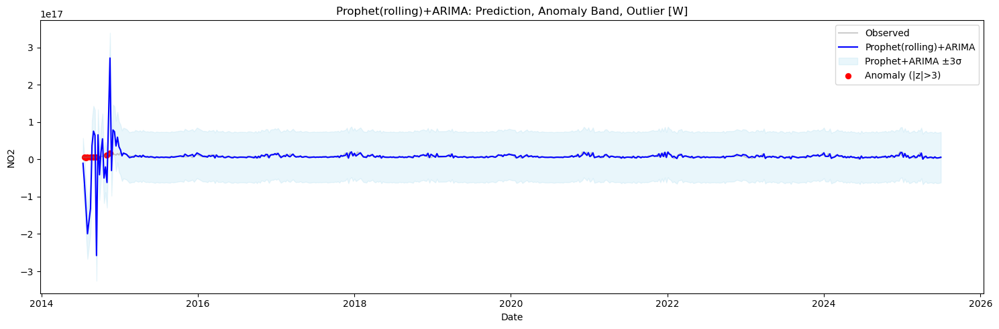

In [11]:
plot_arima_anomaly_band(df_czh_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


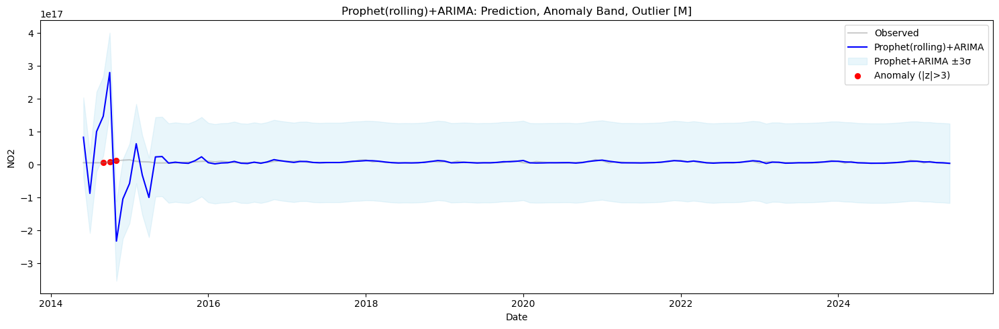

In [12]:
plot_arima_anomaly_band(df_czh_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


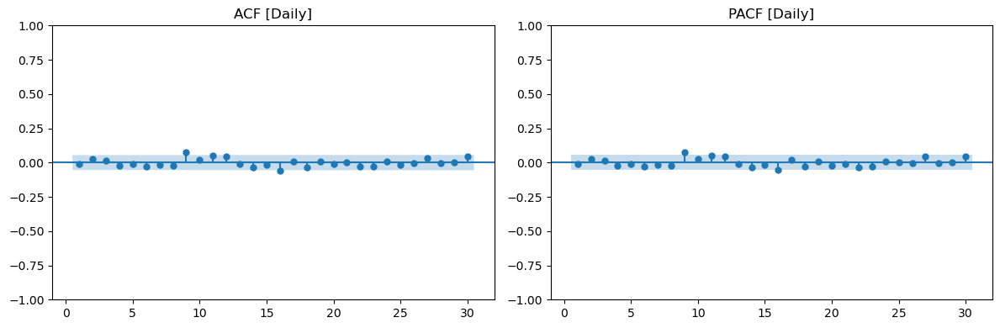

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  12.207167   0.271431
20  26.819689   0.140414
30  33.790966   0.289267



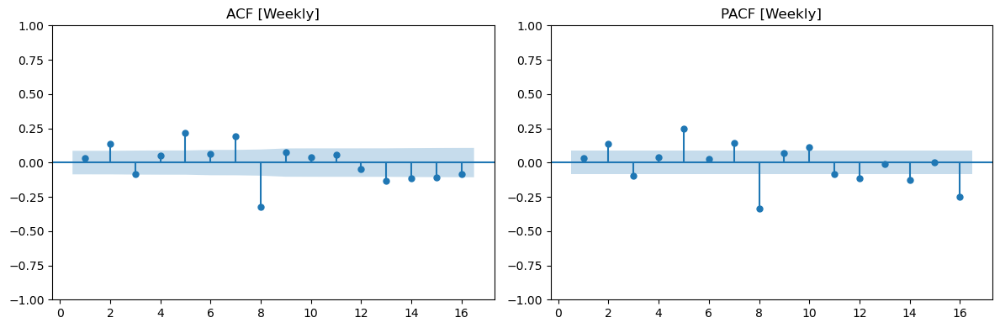

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
       lb_stat     lb_pvalue
8   117.216634  1.244146e-21
12  123.929129  1.015223e-20
16  150.260341  6.942120e-24



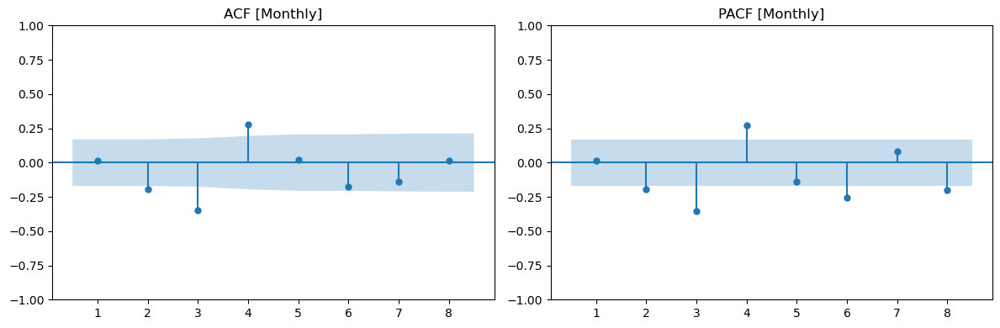

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  32.272664   0.000002
8  39.627795   0.000004



In [13]:
# Daily residual
residual_diagnostics(df_czh_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_czh_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_czh_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Dezhou Plant

In [14]:
df_dzu_NASA = pd.read_csv('Huaneng/Huaneng_Dezhou.csv')
df_dzu_NASA = cleaning_NASA_data(df_dzu_NASA,'NO2')
df_dzu_NASA

,date,NO2
0,2014-01-01,1.696144e+16
1,2014-01-03,1.865310e+16
2,2014-01-04,4.543153e+16
3,2014-01-05,3.218018e+16
4,2014-01-06,5.396346e+16
...,...,...
1971,2025-06-22,1.397066e+16
1972,2025-06-23,8.560357e+15
1973,2025-06-24,1.340290e+16
1974,2025-06-25,1.316713e+16


01:57:04 - cmdstanpy - INFO - Chain [1] start processing
01:57:04 - cmdstanpy - INFO - Chain [1] done processing
01:57:04 - cmdstanpy - INFO - Chain [1] start processing
01:57:04 - cmdstanpy - INFO - Chain [1] done processing
01:57:04 - cmdstanpy - INFO - Chain [1] start processing
01:57:04 - cmdstanpy - INFO - Chain [1] done processing
01:57:04 - cmdstanpy - INFO - Chain [1] start processing
01:57:04 - cmdstanpy - INFO - Chain [1] done processing
01:57:04 - cmdstanpy - INFO - Chain [1] start processing
01:57:04 - cmdstanpy - INFO - Chain [1] done processing
01:57:04 - cmdstanpy - INFO - Chain [1] start processing
01:57:04 - cmdstanpy - INFO - Chain [1] done processing
01:57:05 - cmdstanpy - INFO - Chain [1] start processing
01:57:05 - cmdstanpy - INFO - Chain [1] done processing
01:57:05 - cmdstanpy - INFO - Chain [1] start processing
01:57:05 - cmdstanpy - INFO - Chain [1] done processing
01:57:05 - cmdstanpy - INFO - Chain [1] start processing
01:57:05 - cmdstanpy - INFO - Chain [1]

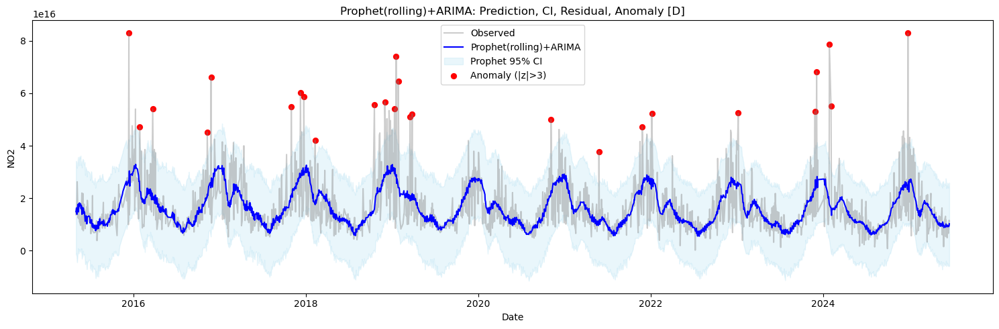

01:57:21 - cmdstanpy - INFO - Chain [1] start processing
01:57:21 - cmdstanpy - INFO - Chain [1] done processing
01:57:21 - cmdstanpy - INFO - Chain [1] start processing
01:57:21 - cmdstanpy - INFO - Chain [1] done processing
01:57:21 - cmdstanpy - INFO - Chain [1] start processing
01:57:21 - cmdstanpy - INFO - Chain [1] done processing
01:57:21 - cmdstanpy - INFO - Chain [1] start processing
01:57:21 - cmdstanpy - INFO - Chain [1] done processing
01:57:21 - cmdstanpy - INFO - Chain [1] start processing
01:57:22 - cmdstanpy - INFO - Chain [1] done processing
01:57:22 - cmdstanpy - INFO - Chain [1] start processing
01:57:22 - cmdstanpy - INFO - Chain [1] done processing
01:57:22 - cmdstanpy - INFO - Chain [1] start processing
01:57:23 - cmdstanpy - INFO - Chain [1] done processing
01:57:23 - cmdstanpy - INFO - Chain [1] start processing
01:57:23 - cmdstanpy - INFO - Chain [1] done processing
01:57:23 - cmdstanpy - INFO - Chain [1] start processing
01:57:23 - cmdstanpy - INFO - Chain [1]

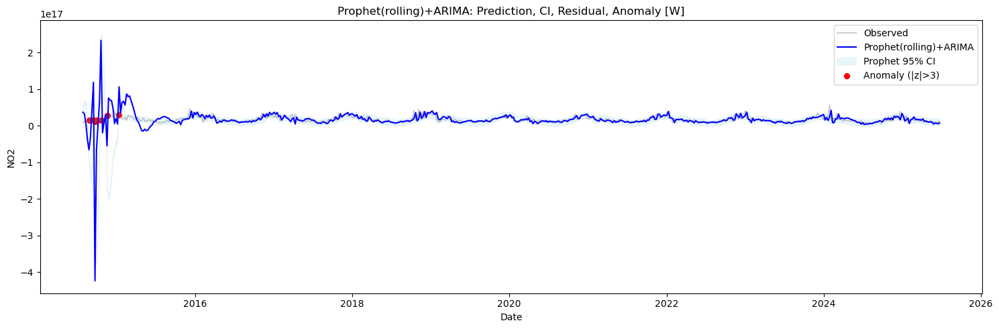

01:57:54 - cmdstanpy - INFO - Chain [1] start processing
01:57:54 - cmdstanpy - INFO - Chain [1] done processing
01:57:54 - cmdstanpy - INFO - Chain [1] start processing
01:57:54 - cmdstanpy - INFO - Chain [1] done processing
01:57:54 - cmdstanpy - INFO - Chain [1] start processing
01:58:00 - cmdstanpy - INFO - Chain [1] done processing
01:58:00 - cmdstanpy - INFO - Chain [1] start processing
01:58:02 - cmdstanpy - INFO - Chain [1] done processing
01:58:02 - cmdstanpy - INFO - Chain [1] start processing
01:58:03 - cmdstanpy - INFO - Chain [1] done processing
01:58:03 - cmdstanpy - INFO - Chain [1] start processing
01:58:03 - cmdstanpy - INFO - Chain [1] done processing
01:58:03 - cmdstanpy - INFO - Chain [1] start processing
01:58:03 - cmdstanpy - INFO - Chain [1] done processing
01:58:04 - cmdstanpy - INFO - Chain [1] start processing
01:58:10 - cmdstanpy - INFO - Chain [1] done processing
01:58:10 - cmdstanpy - INFO - Chain [1] start processing
01:58:17 - cmdstanpy - INFO - Chain [1]

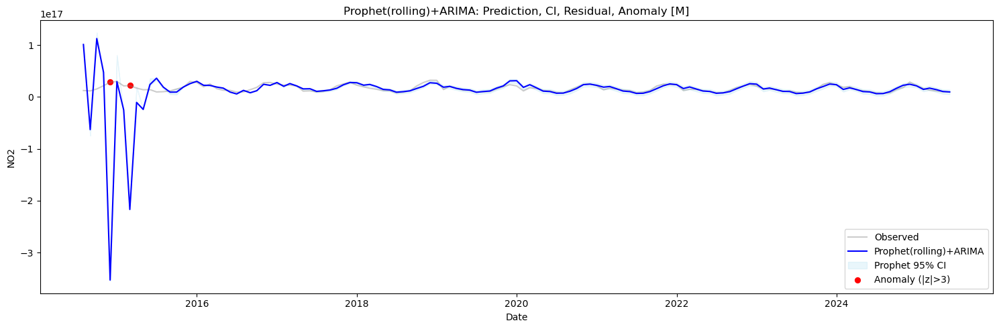

In [15]:
df_dzu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dzu_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=230, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_dzu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dzu_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=30, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_dzu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dzu_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=7, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

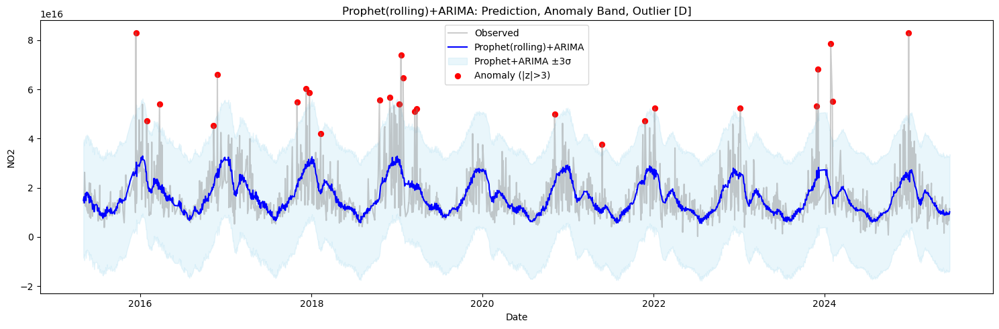

In [16]:
plot_arima_anomaly_band(df_dzu_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


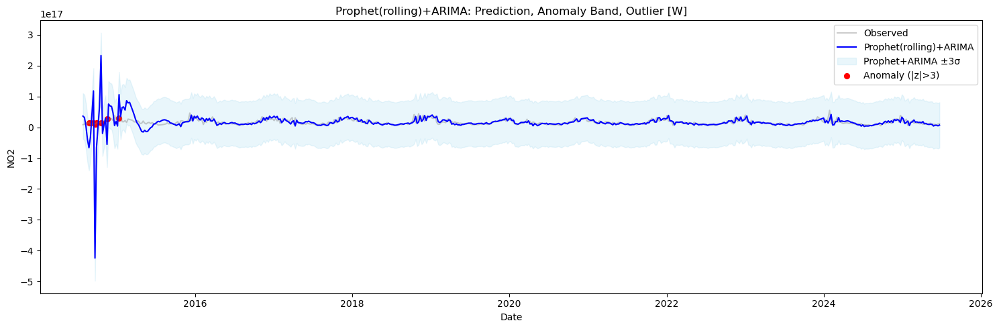

In [17]:
plot_arima_anomaly_band(df_dzu_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


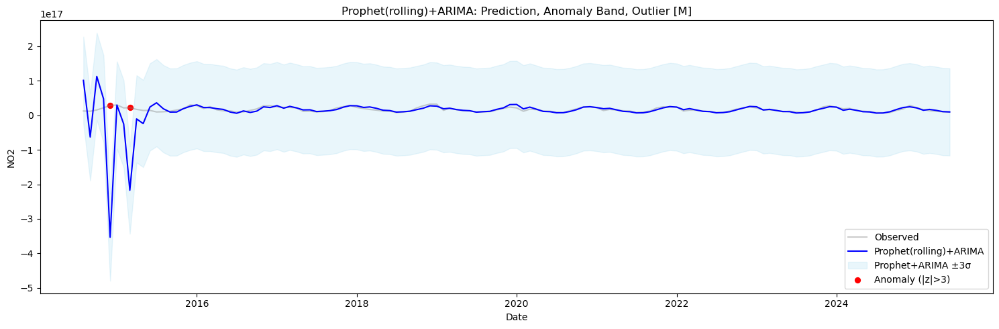

In [18]:
plot_arima_anomaly_band(df_dzu_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


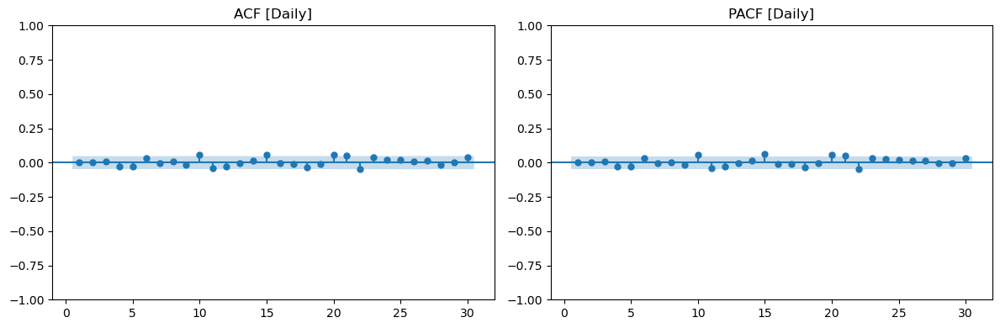

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  10.973118   0.359616
20  29.973531   0.070284
30  44.876939   0.039631



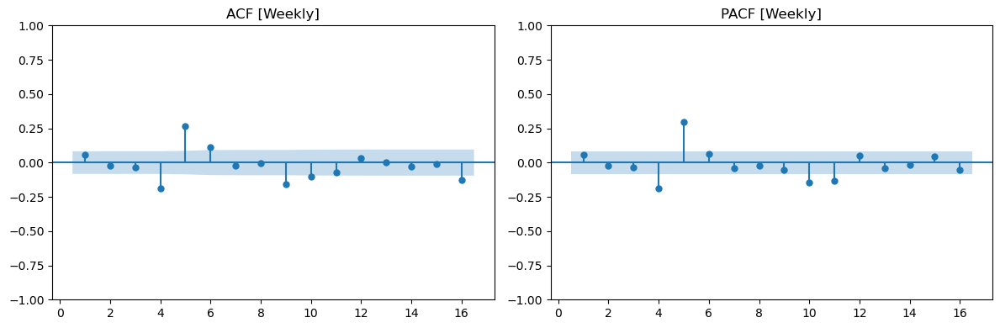

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
       lb_stat     lb_pvalue
8    71.093223  2.976357e-12
12   95.030218  5.206846e-15
16  104.874522  4.194336e-15



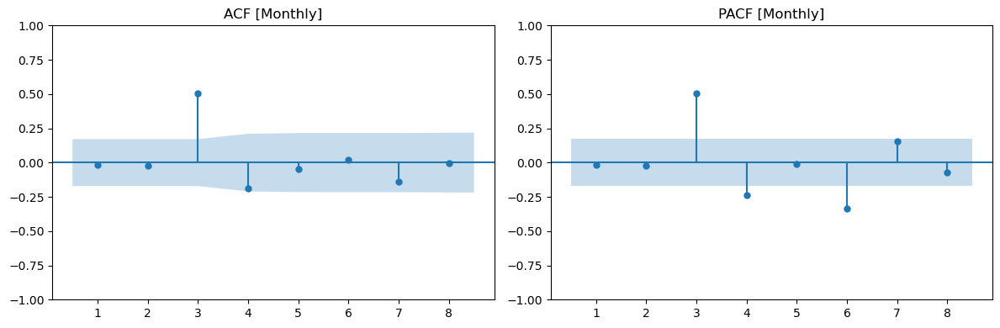

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat     lb_pvalue
4  39.790339  4.782816e-08
8  42.938088  9.023278e-07



In [19]:
# Daily residual
residual_diagnostics(df_dzu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_dzu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_dzu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Fuzhou Plant

In [20]:
df_fzu_NASA = pd.read_csv('Huaneng/Huaneng_Fuzhou.csv')
df_fzu_NASA = cleaning_NASA_data(df_fzu_NASA,'NO2')
df_fzu_NASA

,date,NO2
0,2014-01-01,1.974661e+16
1,2014-01-03,2.532463e+16
2,2014-01-04,6.008944e+16
3,2014-01-10,2.733137e+16
4,2014-01-11,3.937193e+16
...,...,...
1819,2025-06-17,9.347120e+15
1820,2025-06-18,3.045427e+15
1821,2025-06-20,1.155098e+16
1822,2025-06-22,1.039820e+16


02:00:13 - cmdstanpy - INFO - Chain [1] start processing
02:00:13 - cmdstanpy - INFO - Chain [1] done processing
02:00:13 - cmdstanpy - INFO - Chain [1] start processing
02:00:13 - cmdstanpy - INFO - Chain [1] done processing
02:00:13 - cmdstanpy - INFO - Chain [1] start processing
02:00:13 - cmdstanpy - INFO - Chain [1] done processing
02:00:13 - cmdstanpy - INFO - Chain [1] start processing
02:00:13 - cmdstanpy - INFO - Chain [1] done processing
02:00:13 - cmdstanpy - INFO - Chain [1] start processing
02:00:13 - cmdstanpy - INFO - Chain [1] done processing
02:00:14 - cmdstanpy - INFO - Chain [1] start processing
02:00:14 - cmdstanpy - INFO - Chain [1] done processing
02:00:14 - cmdstanpy - INFO - Chain [1] start processing
02:00:14 - cmdstanpy - INFO - Chain [1] done processing
02:00:14 - cmdstanpy - INFO - Chain [1] start processing
02:00:14 - cmdstanpy - INFO - Chain [1] done processing
02:00:14 - cmdstanpy - INFO - Chain [1] start processing
02:00:14 - cmdstanpy - INFO - Chain [1]

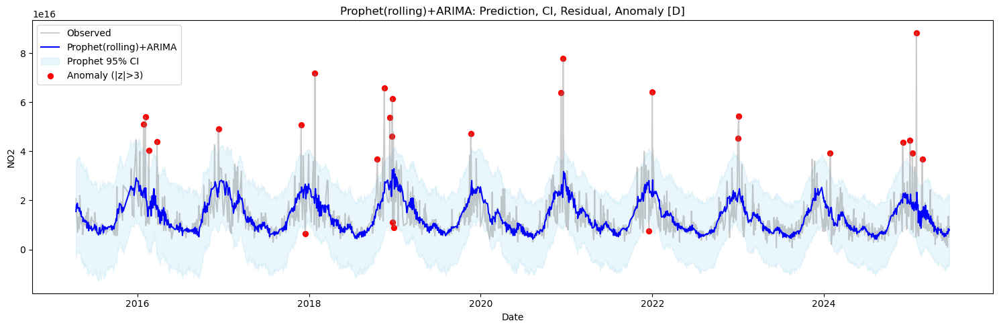

02:00:45 - cmdstanpy - INFO - Chain [1] start processing
02:00:45 - cmdstanpy - INFO - Chain [1] done processing
02:00:45 - cmdstanpy - INFO - Chain [1] start processing
02:00:46 - cmdstanpy - INFO - Chain [1] done processing
02:00:46 - cmdstanpy - INFO - Chain [1] start processing
02:00:46 - cmdstanpy - INFO - Chain [1] done processing
02:00:46 - cmdstanpy - INFO - Chain [1] start processing
02:00:46 - cmdstanpy - INFO - Chain [1] done processing
02:00:46 - cmdstanpy - INFO - Chain [1] start processing
02:00:47 - cmdstanpy - INFO - Chain [1] done processing
02:00:47 - cmdstanpy - INFO - Chain [1] start processing
02:00:47 - cmdstanpy - INFO - Chain [1] done processing
02:00:47 - cmdstanpy - INFO - Chain [1] start processing
02:00:47 - cmdstanpy - INFO - Chain [1] done processing
02:00:47 - cmdstanpy - INFO - Chain [1] start processing
02:00:47 - cmdstanpy - INFO - Chain [1] done processing
02:00:47 - cmdstanpy - INFO - Chain [1] start processing
02:00:48 - cmdstanpy - INFO - Chain [1]

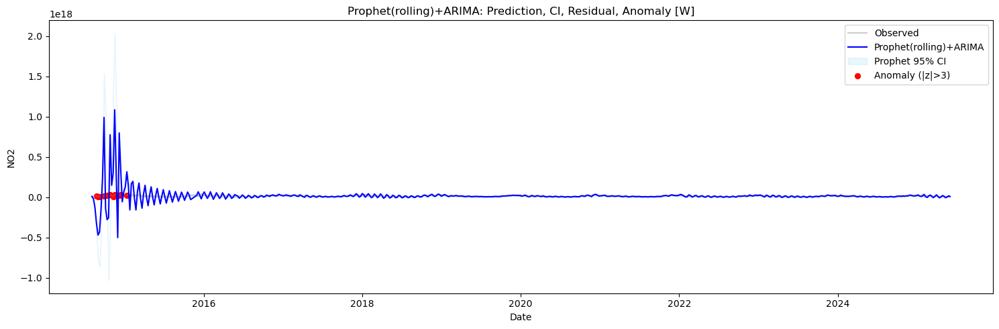

02:01:19 - cmdstanpy - INFO - Chain [1] start processing
02:01:20 - cmdstanpy - INFO - Chain [1] done processing
02:01:20 - cmdstanpy - INFO - Chain [1] start processing
02:01:21 - cmdstanpy - INFO - Chain [1] done processing
02:01:21 - cmdstanpy - INFO - Chain [1] start processing
02:01:21 - cmdstanpy - INFO - Chain [1] done processing
02:01:21 - cmdstanpy - INFO - Chain [1] start processing
02:01:27 - cmdstanpy - INFO - Chain [1] done processing
02:01:27 - cmdstanpy - INFO - Chain [1] start processing
02:01:33 - cmdstanpy - INFO - Chain [1] done processing
02:01:33 - cmdstanpy - INFO - Chain [1] start processing
02:01:34 - cmdstanpy - INFO - Chain [1] done processing
02:01:34 - cmdstanpy - INFO - Chain [1] start processing
02:01:41 - cmdstanpy - INFO - Chain [1] done processing
02:01:41 - cmdstanpy - INFO - Chain [1] start processing
02:01:41 - cmdstanpy - INFO - Chain [1] done processing
02:01:41 - cmdstanpy - INFO - Chain [1] start processing
02:01:42 - cmdstanpy - INFO - Chain [1]

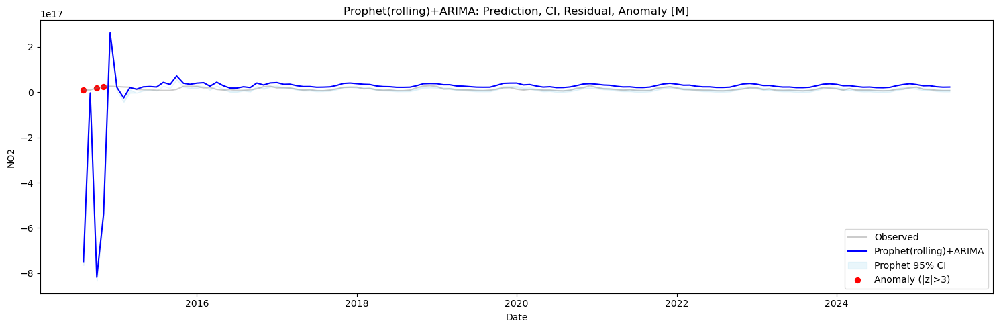

In [21]:
df_fzu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fzu_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=200, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_fzu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fzu_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=30, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_fzu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fzu_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=7, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

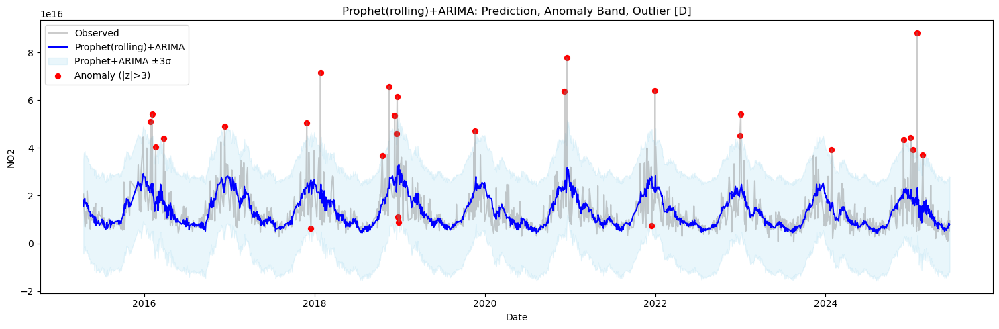

In [22]:
plot_arima_anomaly_band(df_fzu_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


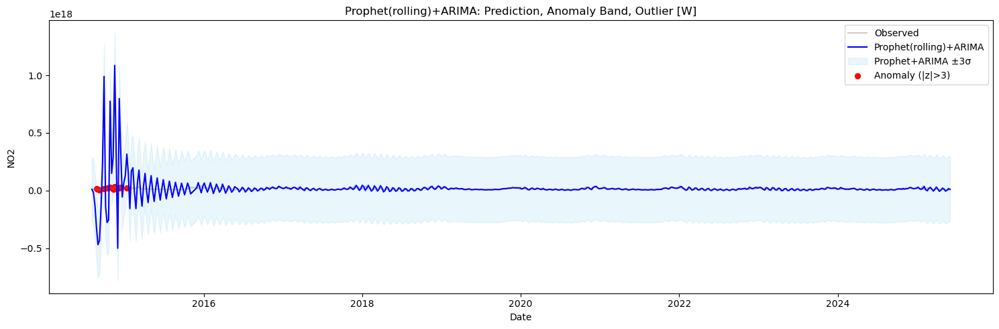

In [23]:
plot_arima_anomaly_band(df_fzu_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


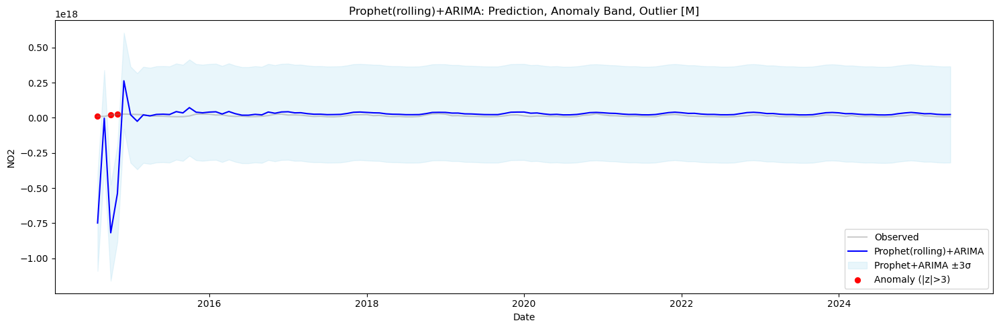

In [24]:
plot_arima_anomaly_band(df_fzu_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


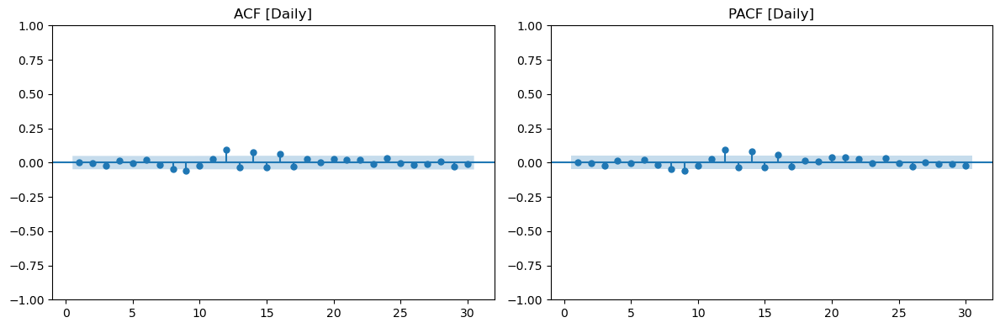

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  12.659850   0.243317
20  52.998866   0.000081
30  58.933894   0.001237



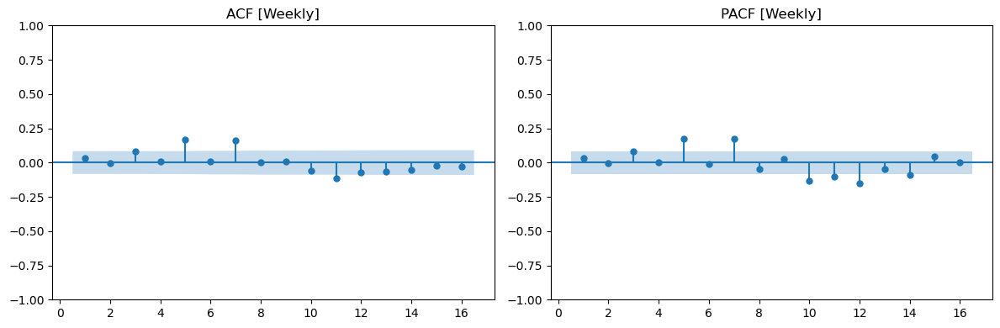

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   35.731012   0.000020
12  47.976334   0.000003
16  52.801162   0.000008



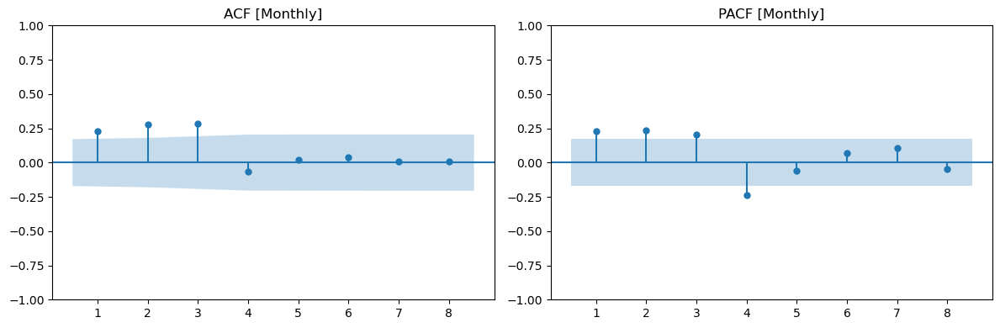

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  29.336834   0.000007
8  29.600560   0.000249



In [25]:
# Daily residual
residual_diagnostics(df_fzu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_fzu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_fzu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Haimen Plant

In [26]:
df_hin_NASA = pd.read_csv('Huaneng/Huaneng_haimen.csv')
df_hin_NASA = cleaning_NASA_data(df_hin_NASA,'NO2')
df_hin_NASA

,date,NO2
0,2014-01-01,6.233038e+15
1,2014-01-03,1.683811e+16
2,2014-01-04,3.133923e+16
3,2014-01-05,1.472919e+16
4,2014-01-06,7.117889e+15
...,...,...
1520,2025-06-25,7.477083e+15
1521,2025-06-27,7.199741e+15
1522,2025-06-28,5.829302e+15
1523,2025-06-29,5.330460e+15


02:03:20 - cmdstanpy - INFO - Chain [1] start processing
02:03:20 - cmdstanpy - INFO - Chain [1] done processing
02:03:20 - cmdstanpy - INFO - Chain [1] start processing
02:03:20 - cmdstanpy - INFO - Chain [1] done processing
02:03:20 - cmdstanpy - INFO - Chain [1] start processing
02:03:20 - cmdstanpy - INFO - Chain [1] done processing
02:03:20 - cmdstanpy - INFO - Chain [1] start processing
02:03:20 - cmdstanpy - INFO - Chain [1] done processing
02:03:20 - cmdstanpy - INFO - Chain [1] start processing
02:03:20 - cmdstanpy - INFO - Chain [1] done processing
02:03:21 - cmdstanpy - INFO - Chain [1] start processing
02:03:21 - cmdstanpy - INFO - Chain [1] done processing
02:03:21 - cmdstanpy - INFO - Chain [1] start processing
02:03:21 - cmdstanpy - INFO - Chain [1] done processing
02:03:21 - cmdstanpy - INFO - Chain [1] start processing
02:03:21 - cmdstanpy - INFO - Chain [1] done processing
02:03:21 - cmdstanpy - INFO - Chain [1] start processing
02:03:21 - cmdstanpy - INFO - Chain [1]

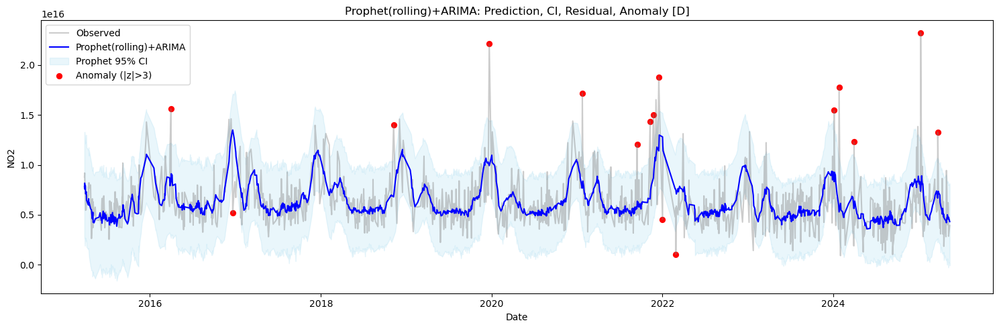

02:03:31 - cmdstanpy - INFO - Chain [1] start processing
02:03:31 - cmdstanpy - INFO - Chain [1] done processing
02:03:31 - cmdstanpy - INFO - Chain [1] start processing
02:03:31 - cmdstanpy - INFO - Chain [1] done processing
02:03:31 - cmdstanpy - INFO - Chain [1] start processing
02:03:31 - cmdstanpy - INFO - Chain [1] done processing
02:03:31 - cmdstanpy - INFO - Chain [1] start processing
02:03:32 - cmdstanpy - INFO - Chain [1] done processing
02:03:32 - cmdstanpy - INFO - Chain [1] start processing
02:03:32 - cmdstanpy - INFO - Chain [1] done processing
02:03:32 - cmdstanpy - INFO - Chain [1] start processing
02:03:32 - cmdstanpy - INFO - Chain [1] done processing
02:03:32 - cmdstanpy - INFO - Chain [1] start processing
02:03:32 - cmdstanpy - INFO - Chain [1] done processing
02:03:32 - cmdstanpy - INFO - Chain [1] start processing
02:03:33 - cmdstanpy - INFO - Chain [1] done processing
02:03:33 - cmdstanpy - INFO - Chain [1] start processing
02:03:33 - cmdstanpy - INFO - Chain [1]

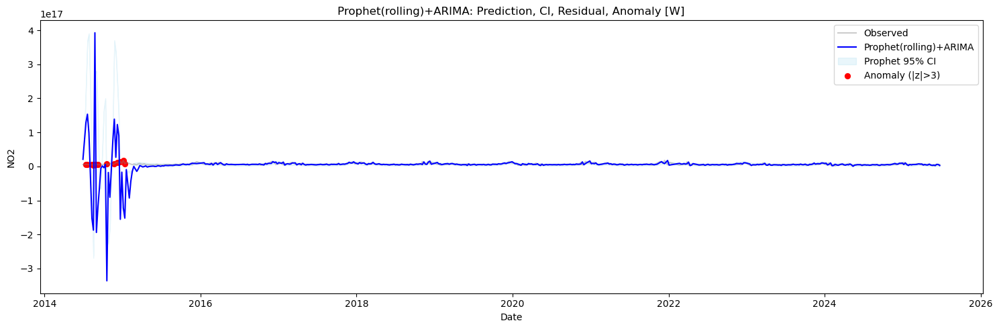

02:04:02 - cmdstanpy - INFO - Chain [1] start processing
02:04:02 - cmdstanpy - INFO - Chain [1] done processing
02:04:02 - cmdstanpy - INFO - Chain [1] start processing
02:04:02 - cmdstanpy - INFO - Chain [1] done processing
02:04:02 - cmdstanpy - INFO - Chain [1] start processing
02:04:07 - cmdstanpy - INFO - Chain [1] done processing
02:04:07 - cmdstanpy - INFO - Chain [1] start processing
02:04:09 - cmdstanpy - INFO - Chain [1] done processing
02:04:09 - cmdstanpy - INFO - Chain [1] start processing
02:04:09 - cmdstanpy - INFO - Chain [1] done processing
02:04:09 - cmdstanpy - INFO - Chain [1] start processing
02:04:10 - cmdstanpy - INFO - Chain [1] done processing
02:04:10 - cmdstanpy - INFO - Chain [1] start processing
02:04:10 - cmdstanpy - INFO - Chain [1] done processing
02:04:10 - cmdstanpy - INFO - Chain [1] start processing
02:04:10 - cmdstanpy - INFO - Chain [1] done processing
02:04:10 - cmdstanpy - INFO - Chain [1] start processing
02:04:11 - cmdstanpy - INFO - Chain [1]

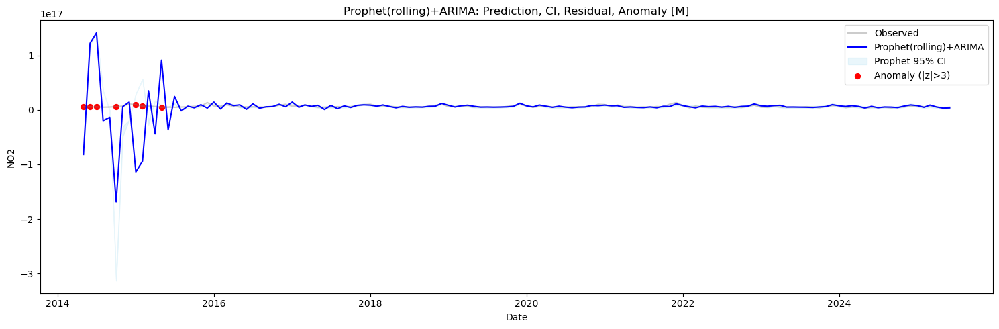

In [27]:
df_hin_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_hin_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=180, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_hin_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_hin_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=24, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_hin_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_hin_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=4, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

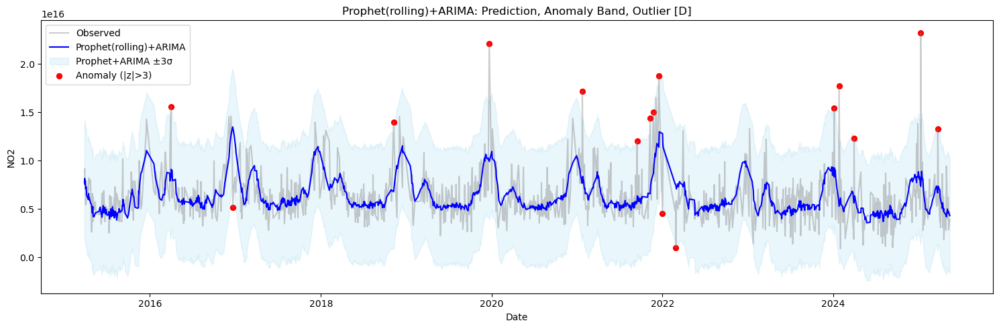

In [28]:
plot_arima_anomaly_band(df_hin_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


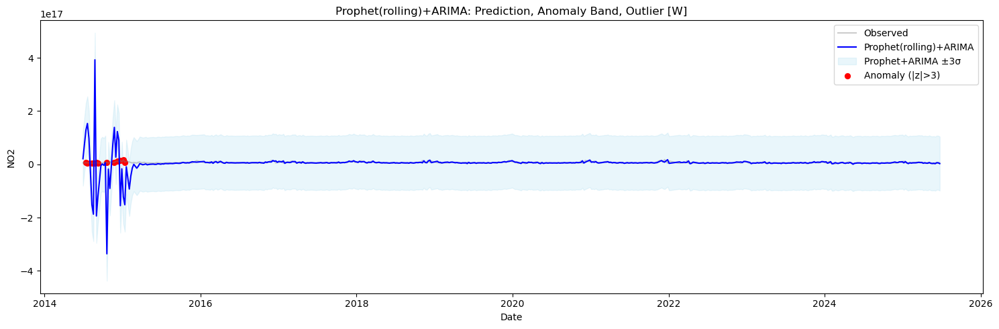

In [29]:
plot_arima_anomaly_band(df_hin_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


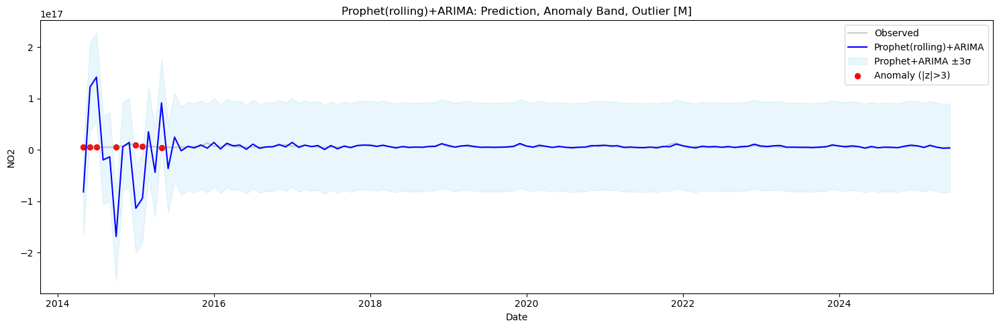

In [30]:
plot_arima_anomaly_band(df_hin_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


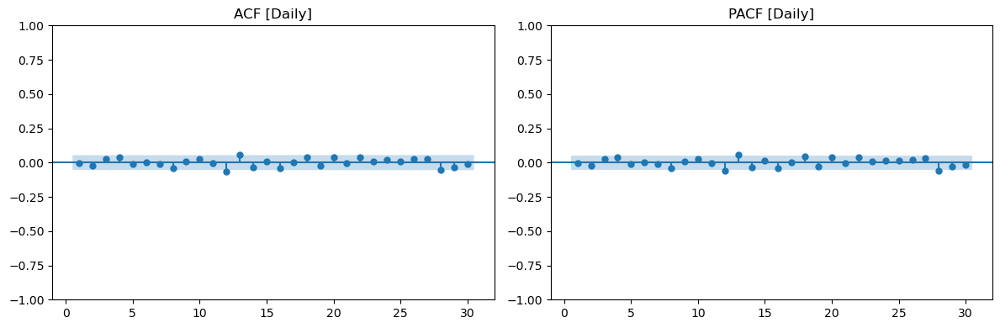

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   6.619888   0.760776
20  24.937635   0.203827
30  35.028803   0.241594



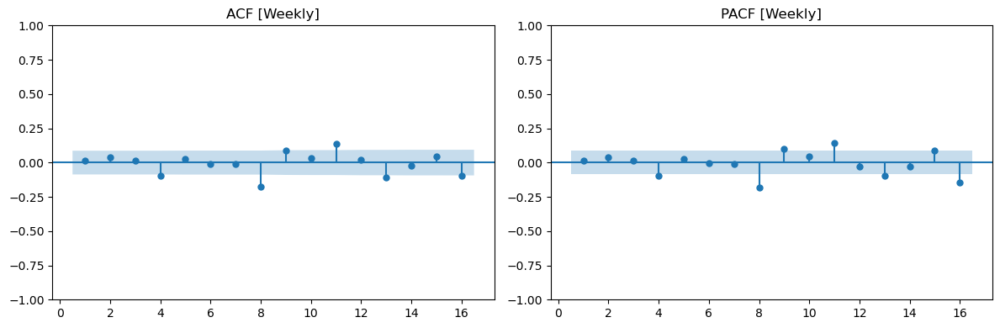

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   21.742092   0.005417
12  36.651485   0.000254
16  48.929127   0.000034



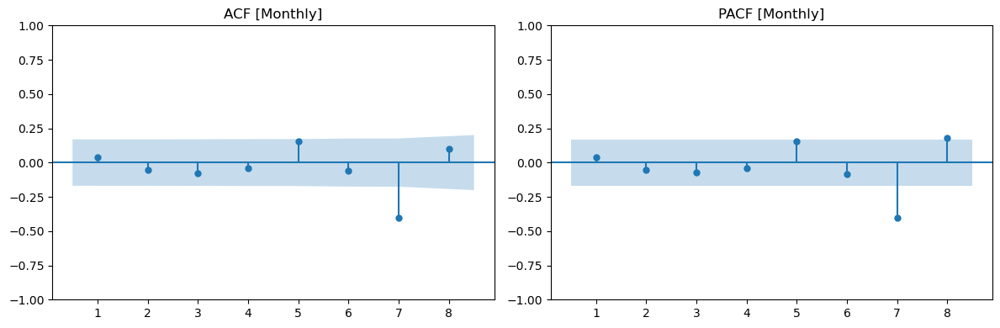

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4   1.700957   0.790544
8  30.719571   0.000158



In [31]:
# Daily residual
residual_diagnostics(df_hin_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_hin_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_hin_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Jinling Plant

In [32]:
df_jlg_NASA = pd.read_csv('Huaneng/Huaneng_jinling.csv')
df_jlg_NASA = cleaning_NASA_data(df_jlg_NASA,'NO2')
df_jlg_NASA

,date,NO2
0,2014-01-01,7.505835e+15
1,2014-01-02,9.106720e+15
2,2014-01-04,9.560866e+15
3,2014-01-08,8.737415e+15
4,2014-01-09,1.286060e+16
...,...,...
2201,2025-06-20,5.383149e+15
2202,2025-06-21,4.010266e+15
2203,2025-06-22,5.073513e+15
2204,2025-06-27,5.051808e+15


02:06:02 - cmdstanpy - INFO - Chain [1] start processing
02:06:02 - cmdstanpy - INFO - Chain [1] done processing
02:06:02 - cmdstanpy - INFO - Chain [1] start processing
02:06:02 - cmdstanpy - INFO - Chain [1] done processing
02:06:02 - cmdstanpy - INFO - Chain [1] start processing
02:06:02 - cmdstanpy - INFO - Chain [1] done processing
02:06:02 - cmdstanpy - INFO - Chain [1] start processing
02:06:02 - cmdstanpy - INFO - Chain [1] done processing
02:06:02 - cmdstanpy - INFO - Chain [1] start processing
02:06:03 - cmdstanpy - INFO - Chain [1] done processing
02:06:03 - cmdstanpy - INFO - Chain [1] start processing
02:06:03 - cmdstanpy - INFO - Chain [1] done processing
02:06:03 - cmdstanpy - INFO - Chain [1] start processing
02:06:03 - cmdstanpy - INFO - Chain [1] done processing
02:06:03 - cmdstanpy - INFO - Chain [1] start processing
02:06:03 - cmdstanpy - INFO - Chain [1] done processing
02:06:03 - cmdstanpy - INFO - Chain [1] start processing
02:06:03 - cmdstanpy - INFO - Chain [1]

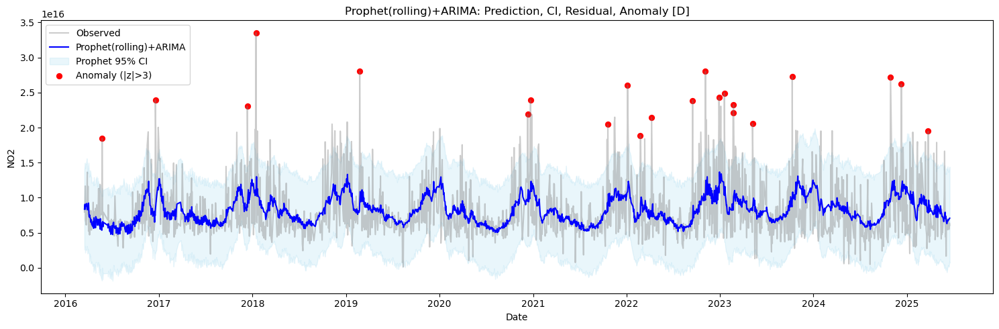

02:06:20 - cmdstanpy - INFO - Chain [1] start processing
02:06:20 - cmdstanpy - INFO - Chain [1] done processing
02:06:20 - cmdstanpy - INFO - Chain [1] start processing
02:06:21 - cmdstanpy - INFO - Chain [1] done processing
02:06:21 - cmdstanpy - INFO - Chain [1] start processing
02:06:21 - cmdstanpy - INFO - Chain [1] done processing
02:06:21 - cmdstanpy - INFO - Chain [1] start processing
02:06:21 - cmdstanpy - INFO - Chain [1] done processing
02:06:21 - cmdstanpy - INFO - Chain [1] start processing
02:06:22 - cmdstanpy - INFO - Chain [1] done processing
02:06:22 - cmdstanpy - INFO - Chain [1] start processing
02:06:22 - cmdstanpy - INFO - Chain [1] done processing
02:06:22 - cmdstanpy - INFO - Chain [1] start processing
02:06:22 - cmdstanpy - INFO - Chain [1] done processing
02:06:22 - cmdstanpy - INFO - Chain [1] start processing
02:06:22 - cmdstanpy - INFO - Chain [1] done processing
02:06:23 - cmdstanpy - INFO - Chain [1] start processing
02:06:23 - cmdstanpy - INFO - Chain [1]

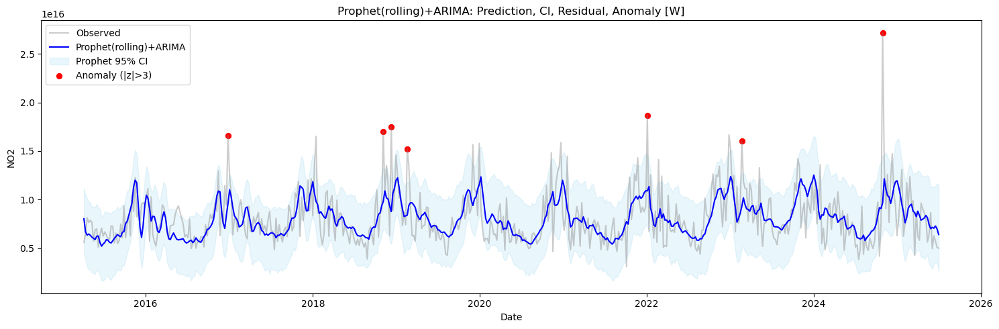

02:06:47 - cmdstanpy - INFO - Chain [1] start processing
02:06:54 - cmdstanpy - INFO - Chain [1] done processing
02:06:54 - cmdstanpy - INFO - Chain [1] start processing
02:06:56 - cmdstanpy - INFO - Chain [1] done processing
02:06:56 - cmdstanpy - INFO - Chain [1] start processing
02:06:58 - cmdstanpy - INFO - Chain [1] done processing
02:06:58 - cmdstanpy - INFO - Chain [1] start processing
02:07:07 - cmdstanpy - INFO - Chain [1] done processing
02:07:07 - cmdstanpy - INFO - Chain [1] start processing
02:07:16 - cmdstanpy - INFO - Chain [1] done processing
02:07:16 - cmdstanpy - INFO - Chain [1] start processing
02:07:25 - cmdstanpy - INFO - Chain [1] done processing
02:07:25 - cmdstanpy - INFO - Chain [1] start processing
02:07:34 - cmdstanpy - INFO - Chain [1] done processing
02:07:34 - cmdstanpy - INFO - Chain [1] start processing
02:07:44 - cmdstanpy - INFO - Chain [1] done processing
02:07:44 - cmdstanpy - INFO - Chain [1] start processing
02:07:56 - cmdstanpy - INFO - Chain [1]

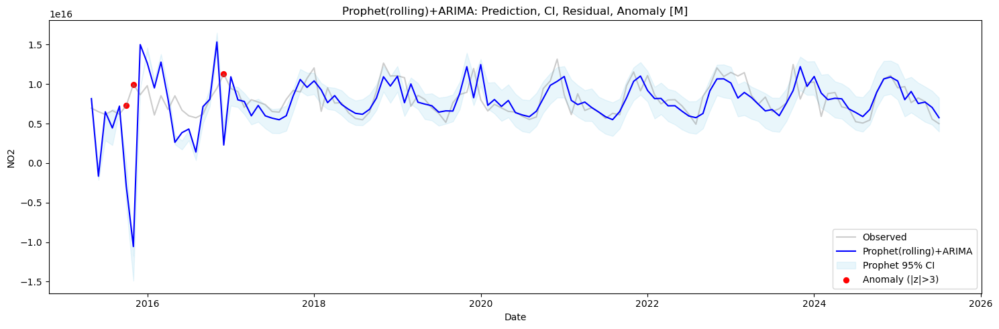

In [33]:
df_jlg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_jlg_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=430, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_jlg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_jlg_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=66, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_jlg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_jlg_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=16, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

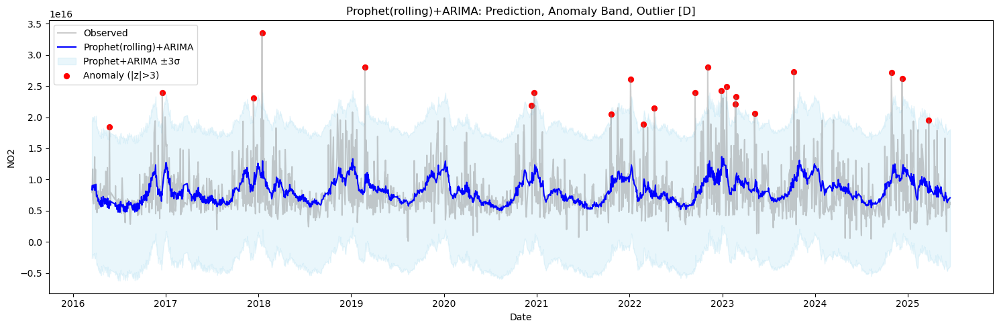

In [34]:
plot_arima_anomaly_band(df_jlg_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


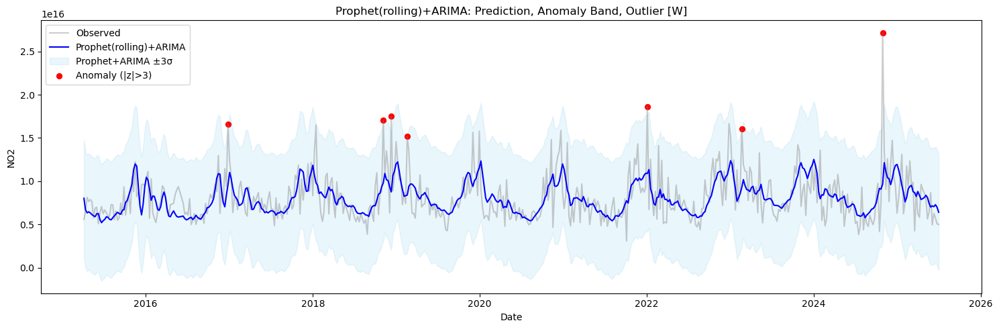

In [35]:
plot_arima_anomaly_band(df_jlg_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


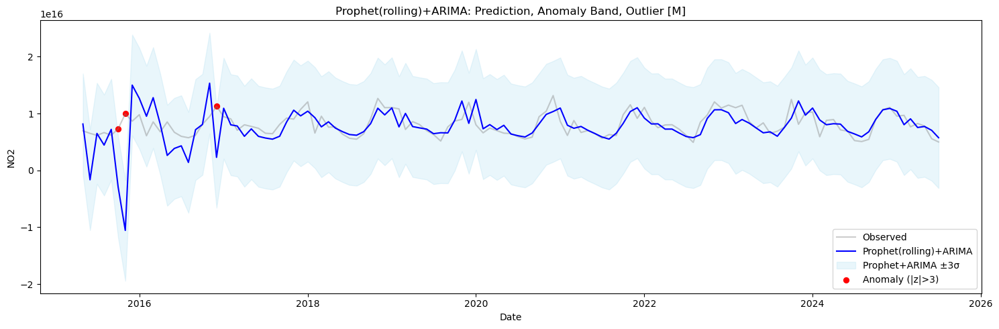

In [36]:
plot_arima_anomaly_band(df_jlg_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


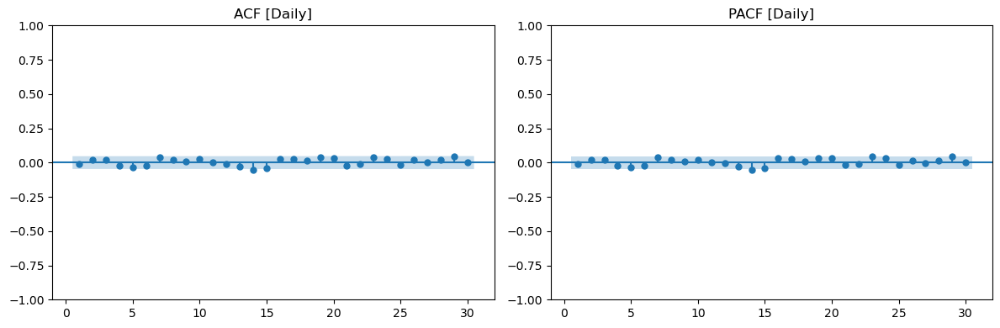

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  10.107769   0.431090
20  27.925388   0.111177
30  39.040612   0.124821



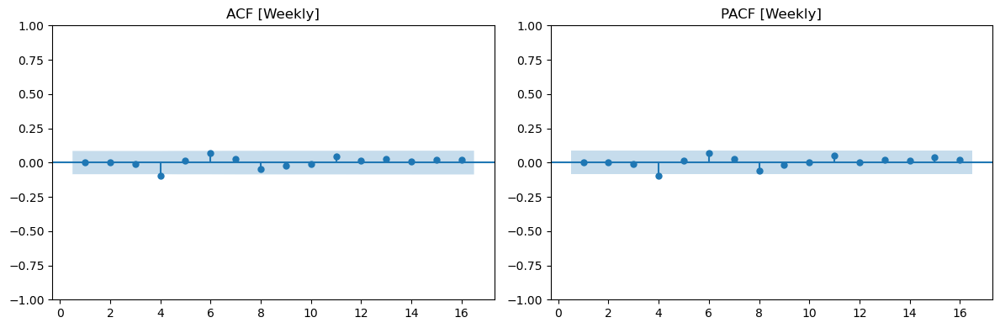

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    9.404626   0.309320
12  11.096322   0.520682
16  12.094627   0.737440



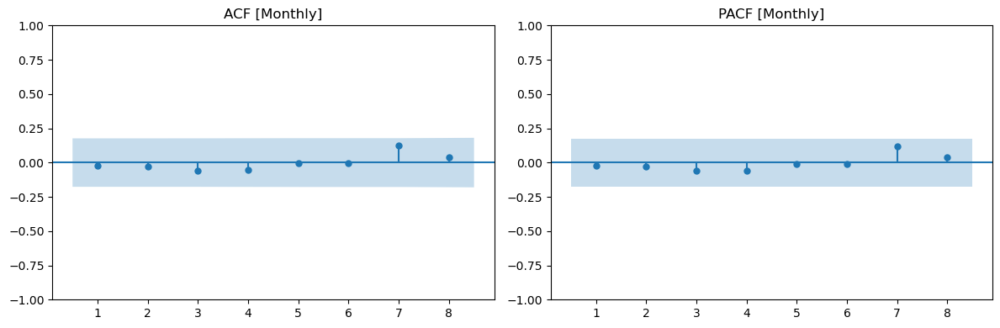

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  0.949655   0.917331
8  3.131308   0.925849



In [37]:
# Daily residual
residual_diagnostics(df_jlg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_jlg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_jlg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Laiwu Plant

In [38]:
df_laiwu_NASA = pd.read_csv('Huaneng/Huaneng_laiwu.csv')
df_laiwu_NASA = cleaning_NASA_data(df_laiwu_NASA,'NO2')
df_laiwu_NASA

,date,NO2
0,2014-01-01,2.008934e+16
1,2014-01-03,3.753957e+16
2,2014-01-05,3.675769e+16
3,2014-01-06,3.163173e+16
4,2014-01-10,2.203278e+16
...,...,...
1642,2025-06-24,4.734989e+15
1643,2025-06-25,6.336967e+15
1644,2025-06-28,6.982725e+15
1645,2025-06-29,7.880809e+15


02:08:29 - cmdstanpy - INFO - Chain [1] start processing
02:08:29 - cmdstanpy - INFO - Chain [1] done processing
02:08:29 - cmdstanpy - INFO - Chain [1] start processing
02:08:30 - cmdstanpy - INFO - Chain [1] done processing
02:08:30 - cmdstanpy - INFO - Chain [1] start processing
02:08:30 - cmdstanpy - INFO - Chain [1] done processing
02:08:30 - cmdstanpy - INFO - Chain [1] start processing
02:08:30 - cmdstanpy - INFO - Chain [1] done processing
02:08:30 - cmdstanpy - INFO - Chain [1] start processing
02:08:30 - cmdstanpy - INFO - Chain [1] done processing
02:08:30 - cmdstanpy - INFO - Chain [1] start processing
02:08:30 - cmdstanpy - INFO - Chain [1] done processing
02:08:30 - cmdstanpy - INFO - Chain [1] start processing
02:08:30 - cmdstanpy - INFO - Chain [1] done processing
02:08:31 - cmdstanpy - INFO - Chain [1] start processing
02:08:31 - cmdstanpy - INFO - Chain [1] done processing
02:08:31 - cmdstanpy - INFO - Chain [1] start processing
02:08:31 - cmdstanpy - INFO - Chain [1]

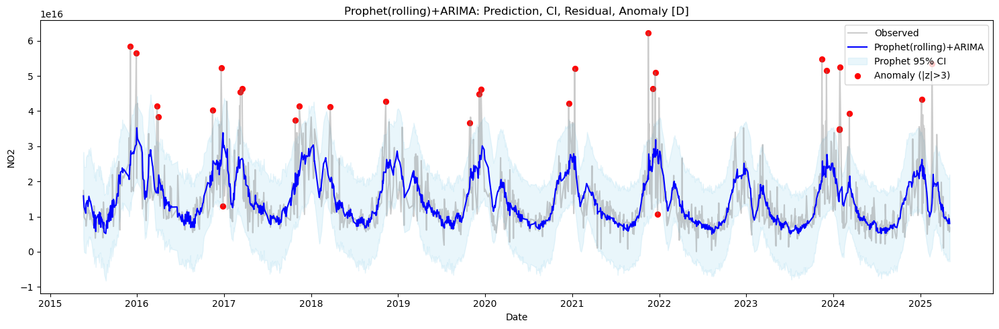

02:08:43 - cmdstanpy - INFO - Chain [1] start processing
02:08:43 - cmdstanpy - INFO - Chain [1] done processing
02:08:43 - cmdstanpy - INFO - Chain [1] start processing
02:08:43 - cmdstanpy - INFO - Chain [1] done processing
02:08:43 - cmdstanpy - INFO - Chain [1] start processing
02:08:43 - cmdstanpy - INFO - Chain [1] done processing
02:08:43 - cmdstanpy - INFO - Chain [1] start processing
02:08:43 - cmdstanpy - INFO - Chain [1] done processing
02:08:43 - cmdstanpy - INFO - Chain [1] start processing
02:08:44 - cmdstanpy - INFO - Chain [1] done processing
02:08:44 - cmdstanpy - INFO - Chain [1] start processing
02:08:44 - cmdstanpy - INFO - Chain [1] done processing
02:08:44 - cmdstanpy - INFO - Chain [1] start processing
02:08:44 - cmdstanpy - INFO - Chain [1] done processing
02:08:44 - cmdstanpy - INFO - Chain [1] start processing
02:08:45 - cmdstanpy - INFO - Chain [1] done processing
02:08:45 - cmdstanpy - INFO - Chain [1] start processing
02:08:45 - cmdstanpy - INFO - Chain [1]

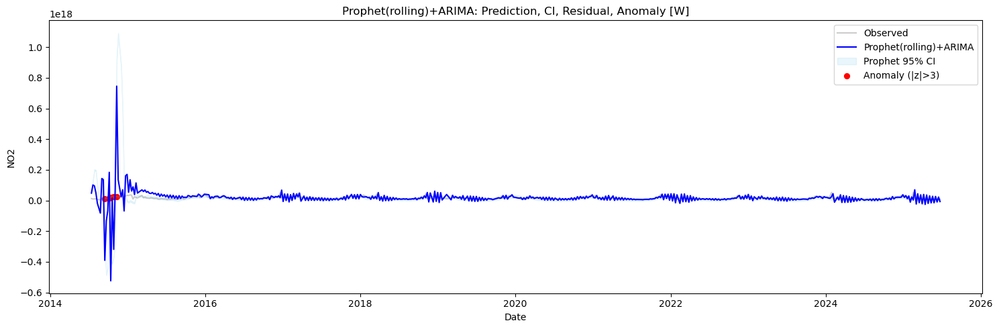

02:09:15 - cmdstanpy - INFO - Chain [1] start processing
02:09:15 - cmdstanpy - INFO - Chain [1] done processing
02:09:15 - cmdstanpy - INFO - Chain [1] start processing
02:09:15 - cmdstanpy - INFO - Chain [1] done processing
02:09:15 - cmdstanpy - INFO - Chain [1] start processing
02:09:16 - cmdstanpy - INFO - Chain [1] done processing
02:09:16 - cmdstanpy - INFO - Chain [1] start processing
02:09:19 - cmdstanpy - INFO - Chain [1] done processing
02:09:19 - cmdstanpy - INFO - Chain [1] start processing
02:09:20 - cmdstanpy - INFO - Chain [1] done processing
02:09:20 - cmdstanpy - INFO - Chain [1] start processing
02:09:24 - cmdstanpy - INFO - Chain [1] done processing
02:09:24 - cmdstanpy - INFO - Chain [1] start processing
02:09:30 - cmdstanpy - INFO - Chain [1] done processing
02:09:31 - cmdstanpy - INFO - Chain [1] start processing
02:09:37 - cmdstanpy - INFO - Chain [1] done processing
02:09:37 - cmdstanpy - INFO - Chain [1] start processing
02:09:43 - cmdstanpy - INFO - Chain [1]

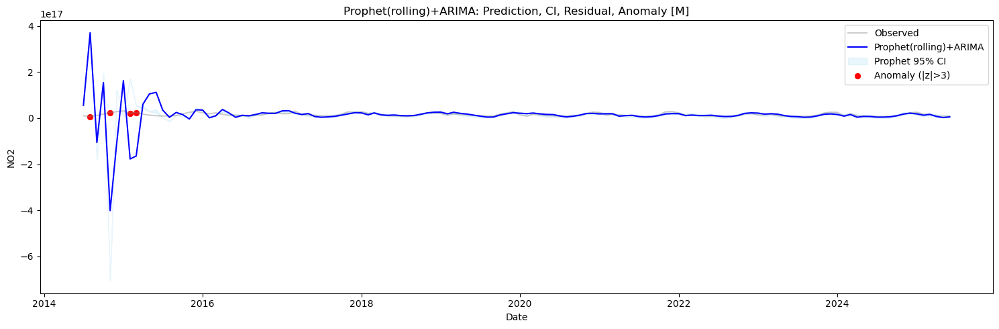

In [39]:
df_laiwu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_laiwu_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=180, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_laiwu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_laiwu_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=27, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_laiwu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_laiwu_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=6, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

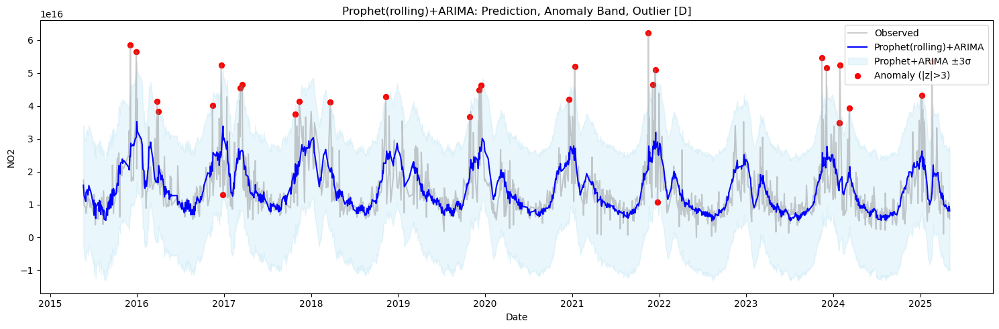

In [40]:
plot_arima_anomaly_band(df_laiwu_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


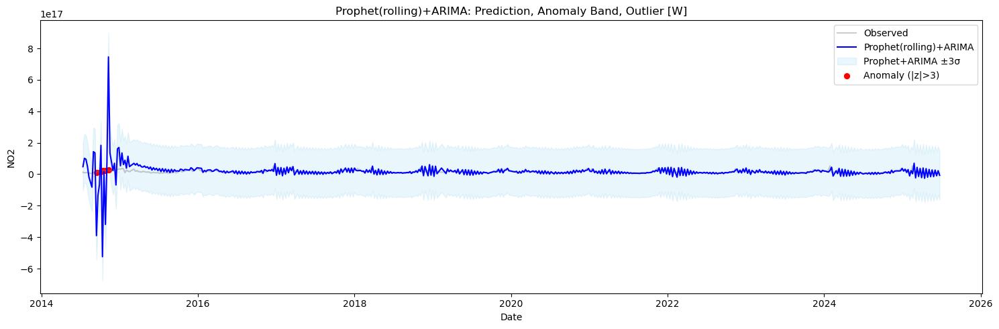

In [41]:
plot_arima_anomaly_band(df_laiwu_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


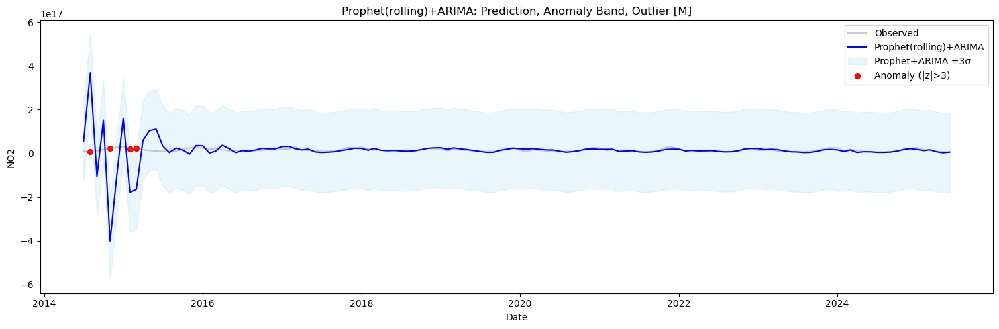

In [42]:
plot_arima_anomaly_band(df_laiwu_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


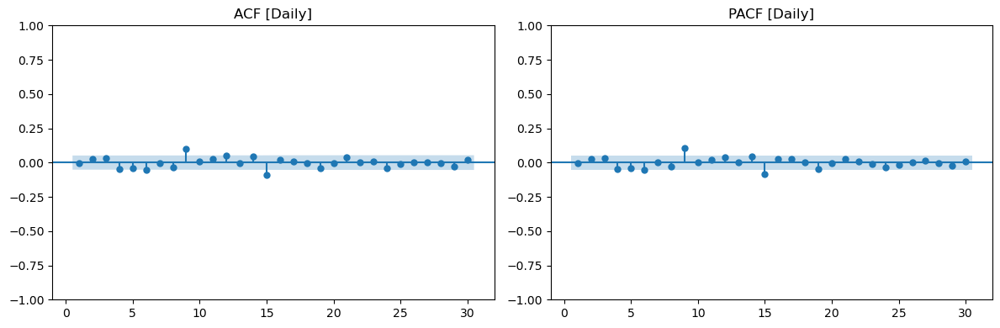

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  29.064396   0.001216
20  51.730666   0.000125
30  58.509444   0.001390



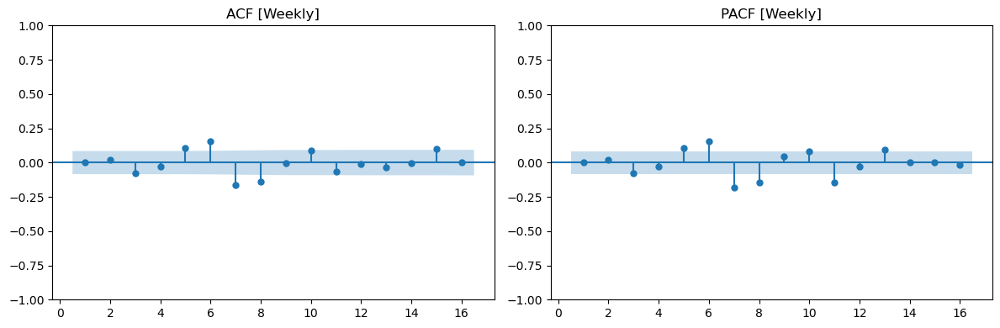

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   49.082425  6.130622e-08
12  55.563503  1.433981e-07
16  61.622985  2.782174e-07



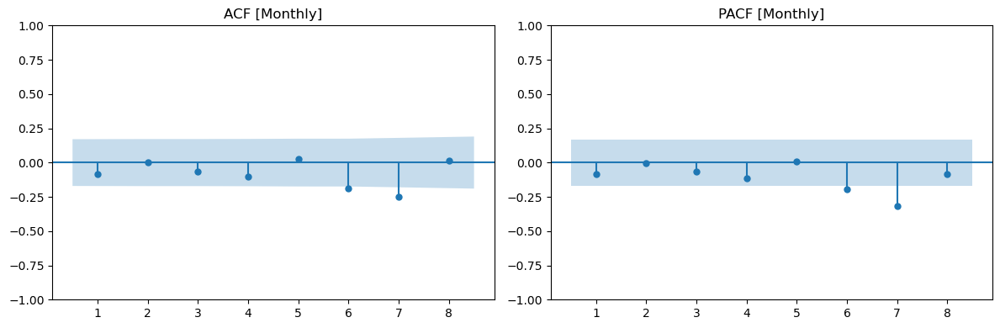

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4   2.985007   0.560338
8  16.806215   0.032191



In [43]:
# Daily residual
residual_diagnostics(df_laiwu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_laiwu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_laiwu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Luohuang

In [44]:
df_lhg_NASA = pd.read_csv('Huaneng/Huaneng_luohuang.csv')
df_lhg_NASA = cleaning_NASA_data(df_lhg_NASA,'NO2')
df_lhg_NASA

,date,NO2
0,2014-01-01,2.693991e+16
1,2014-01-03,5.646979e+16
2,2014-01-04,5.714476e+16
3,2014-01-05,3.574635e+16
4,2014-01-11,4.608430e+16
...,...,...
1947,2025-06-22,1.008103e+16
1948,2025-06-23,1.262074e+16
1949,2025-06-24,1.053510e+16
1950,2025-06-25,4.063849e+15


02:11:29 - cmdstanpy - INFO - Chain [1] start processing
02:11:29 - cmdstanpy - INFO - Chain [1] done processing
02:11:29 - cmdstanpy - INFO - Chain [1] start processing
02:11:29 - cmdstanpy - INFO - Chain [1] done processing
02:11:29 - cmdstanpy - INFO - Chain [1] start processing
02:11:29 - cmdstanpy - INFO - Chain [1] done processing
02:11:29 - cmdstanpy - INFO - Chain [1] start processing
02:11:29 - cmdstanpy - INFO - Chain [1] done processing
02:11:29 - cmdstanpy - INFO - Chain [1] start processing
02:11:29 - cmdstanpy - INFO - Chain [1] done processing
02:11:30 - cmdstanpy - INFO - Chain [1] start processing
02:11:30 - cmdstanpy - INFO - Chain [1] done processing
02:11:30 - cmdstanpy - INFO - Chain [1] start processing
02:11:30 - cmdstanpy - INFO - Chain [1] done processing
02:11:30 - cmdstanpy - INFO - Chain [1] start processing
02:11:30 - cmdstanpy - INFO - Chain [1] done processing
02:11:30 - cmdstanpy - INFO - Chain [1] start processing
02:11:30 - cmdstanpy - INFO - Chain [1]

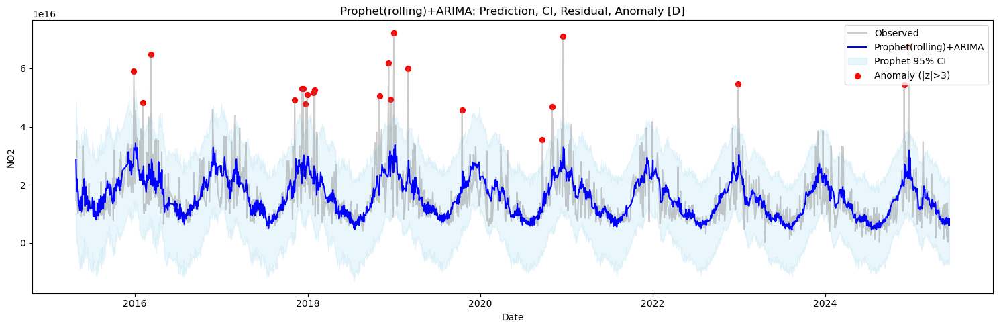

02:11:45 - cmdstanpy - INFO - Chain [1] start processing
02:11:45 - cmdstanpy - INFO - Chain [1] done processing
02:11:45 - cmdstanpy - INFO - Chain [1] start processing
02:11:45 - cmdstanpy - INFO - Chain [1] done processing
02:11:45 - cmdstanpy - INFO - Chain [1] start processing
02:11:45 - cmdstanpy - INFO - Chain [1] done processing
02:11:45 - cmdstanpy - INFO - Chain [1] start processing
02:11:46 - cmdstanpy - INFO - Chain [1] done processing
02:11:46 - cmdstanpy - INFO - Chain [1] start processing
02:11:46 - cmdstanpy - INFO - Chain [1] done processing
02:11:46 - cmdstanpy - INFO - Chain [1] start processing
02:11:46 - cmdstanpy - INFO - Chain [1] done processing
02:11:46 - cmdstanpy - INFO - Chain [1] start processing
02:11:46 - cmdstanpy - INFO - Chain [1] done processing
02:11:46 - cmdstanpy - INFO - Chain [1] start processing
02:11:47 - cmdstanpy - INFO - Chain [1] done processing
02:11:47 - cmdstanpy - INFO - Chain [1] start processing
02:11:47 - cmdstanpy - INFO - Chain [1]

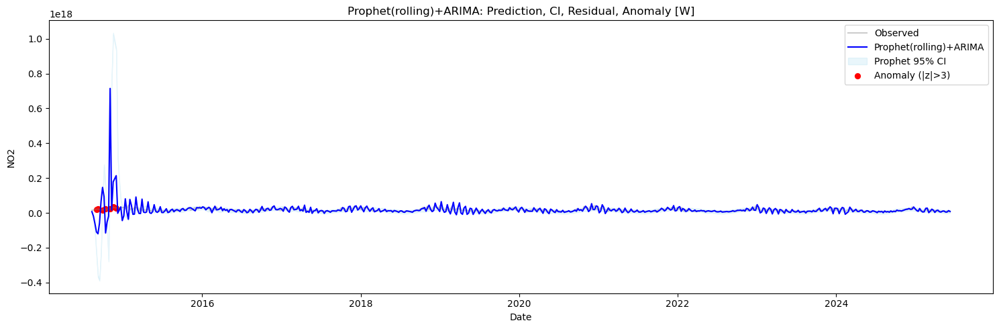

02:12:18 - cmdstanpy - INFO - Chain [1] start processing
02:12:18 - cmdstanpy - INFO - Chain [1] done processing
02:12:18 - cmdstanpy - INFO - Chain [1] start processing
02:12:23 - cmdstanpy - INFO - Chain [1] done processing
02:12:23 - cmdstanpy - INFO - Chain [1] start processing
02:12:27 - cmdstanpy - INFO - Chain [1] done processing
02:12:27 - cmdstanpy - INFO - Chain [1] start processing
02:12:27 - cmdstanpy - INFO - Chain [1] done processing
02:12:27 - cmdstanpy - INFO - Chain [1] start processing
02:12:33 - cmdstanpy - INFO - Chain [1] done processing
02:12:33 - cmdstanpy - INFO - Chain [1] start processing
02:12:34 - cmdstanpy - INFO - Chain [1] done processing
02:12:34 - cmdstanpy - INFO - Chain [1] start processing
02:12:39 - cmdstanpy - INFO - Chain [1] done processing
02:12:39 - cmdstanpy - INFO - Chain [1] start processing
02:12:39 - cmdstanpy - INFO - Chain [1] done processing
02:12:40 - cmdstanpy - INFO - Chain [1] start processing
02:12:47 - cmdstanpy - INFO - Chain [1]

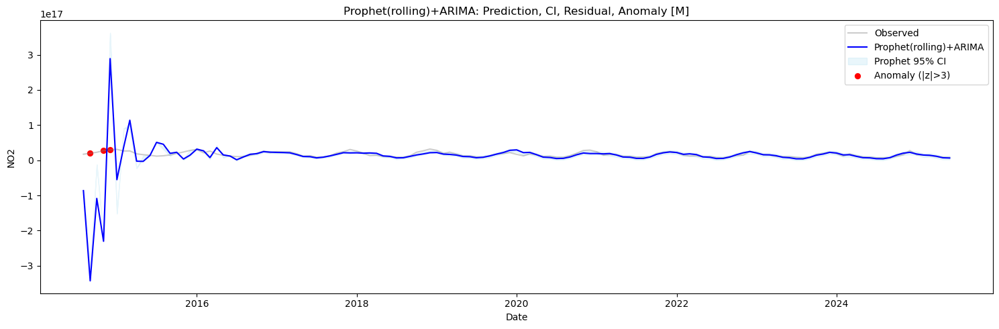

In [45]:
df_lhg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_lhg_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=230, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_lhg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_lhg_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=32, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_lhg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_lhg_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=7, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

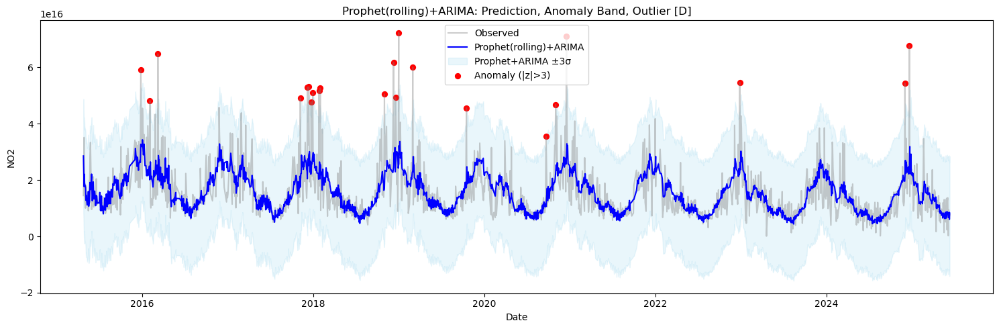

In [46]:
plot_arima_anomaly_band(df_lhg_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


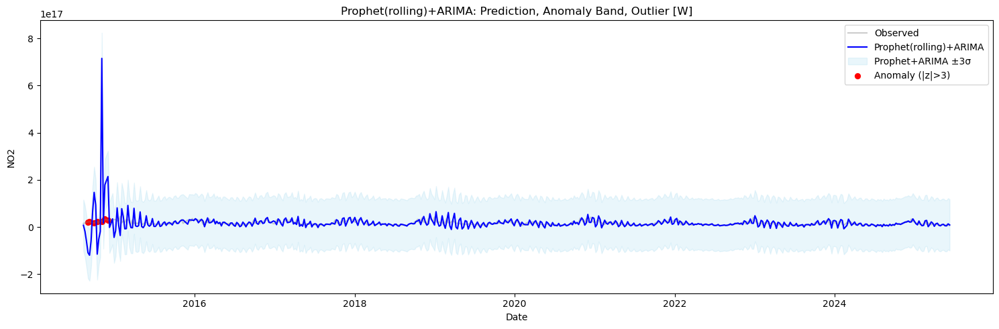

In [47]:
plot_arima_anomaly_band(df_lhg_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


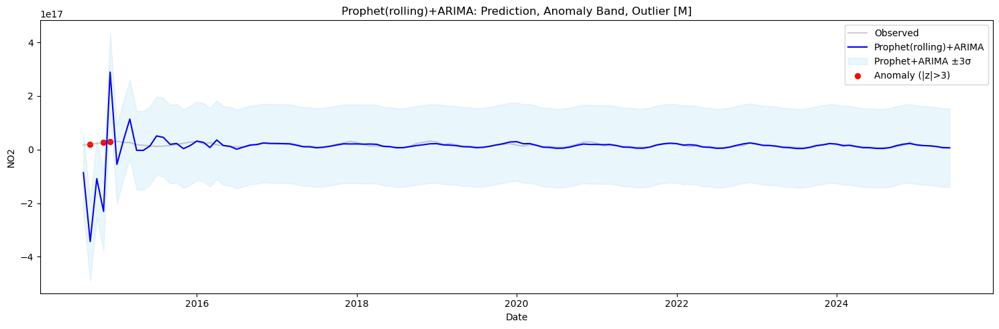

In [48]:
plot_arima_anomaly_band(df_lhg_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


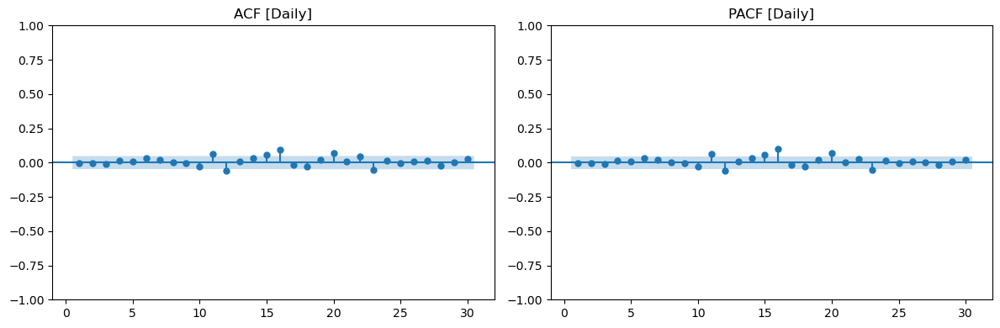

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   4.833370   0.902027
20  53.483082   0.000069
30  65.917207   0.000167



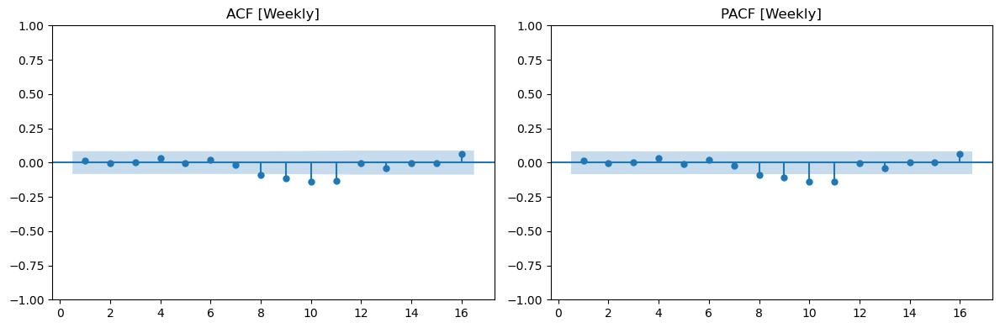

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    5.605613   0.691313
12  33.356560   0.000851
16  36.846688   0.002204



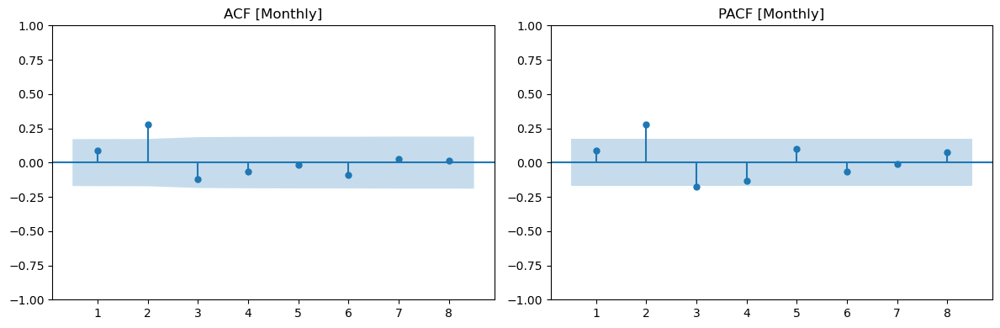

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  14.269475   0.006483
8  15.556535   0.049186



In [49]:
# Daily residual
residual_diagnostics(df_lhg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_lhg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_lhg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Pingliang Plant

In [50]:
df_pgg_NASA = pd.read_csv('Huaneng/Huaneng_pingliang.csv')
df_pgg_NASA = cleaning_NASA_data(df_pgg_NASA,'NO2')
df_pgg_NASA

,date,NO2
0,2014-01-03,3.562620e+16
1,2014-01-04,2.138940e+16
2,2014-01-14,2.988617e+16
3,2014-01-18,9.397449e+15
4,2014-01-20,1.837130e+16
...,...,...
981,2025-06-25,6.713996e+14
982,2025-06-26,7.700858e+15
983,2025-06-28,1.213449e+16
984,2025-06-30,1.003475e+15


02:14:29 - cmdstanpy - INFO - Chain [1] start processing
02:14:29 - cmdstanpy - INFO - Chain [1] done processing
02:14:29 - cmdstanpy - INFO - Chain [1] start processing
02:14:29 - cmdstanpy - INFO - Chain [1] done processing
02:14:29 - cmdstanpy - INFO - Chain [1] start processing
02:14:29 - cmdstanpy - INFO - Chain [1] done processing
02:14:30 - cmdstanpy - INFO - Chain [1] start processing
02:14:30 - cmdstanpy - INFO - Chain [1] done processing
02:14:30 - cmdstanpy - INFO - Chain [1] start processing
02:14:30 - cmdstanpy - INFO - Chain [1] done processing
02:14:30 - cmdstanpy - INFO - Chain [1] start processing
02:14:30 - cmdstanpy - INFO - Chain [1] done processing
02:14:30 - cmdstanpy - INFO - Chain [1] start processing
02:14:30 - cmdstanpy - INFO - Chain [1] done processing
02:14:30 - cmdstanpy - INFO - Chain [1] start processing
02:14:30 - cmdstanpy - INFO - Chain [1] done processing
02:14:30 - cmdstanpy - INFO - Chain [1] start processing
02:14:31 - cmdstanpy - INFO - Chain [1]

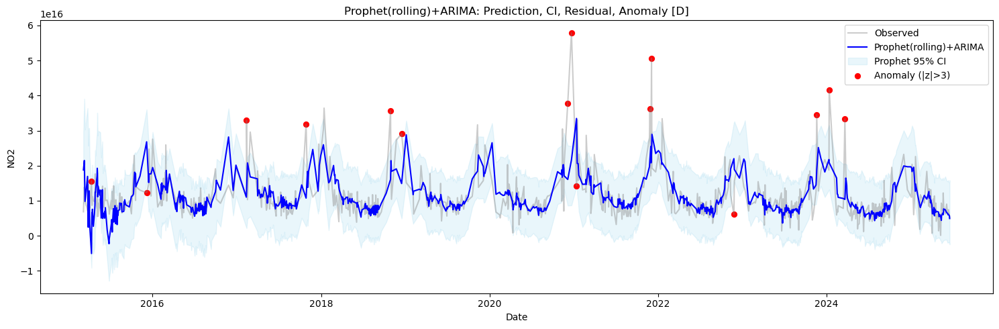

02:14:42 - cmdstanpy - INFO - Chain [1] start processing
02:14:42 - cmdstanpy - INFO - Chain [1] done processing
02:14:42 - cmdstanpy - INFO - Chain [1] start processing
02:14:42 - cmdstanpy - INFO - Chain [1] done processing
02:14:42 - cmdstanpy - INFO - Chain [1] start processing
02:14:42 - cmdstanpy - INFO - Chain [1] done processing
02:14:43 - cmdstanpy - INFO - Chain [1] start processing
02:14:43 - cmdstanpy - INFO - Chain [1] done processing
02:14:43 - cmdstanpy - INFO - Chain [1] start processing
02:14:43 - cmdstanpy - INFO - Chain [1] done processing
02:14:43 - cmdstanpy - INFO - Chain [1] start processing
02:14:43 - cmdstanpy - INFO - Chain [1] done processing
02:14:43 - cmdstanpy - INFO - Chain [1] start processing
02:14:43 - cmdstanpy - INFO - Chain [1] done processing
02:14:43 - cmdstanpy - INFO - Chain [1] start processing
02:14:44 - cmdstanpy - INFO - Chain [1] done processing
02:14:44 - cmdstanpy - INFO - Chain [1] start processing
02:14:44 - cmdstanpy - INFO - Chain [1]

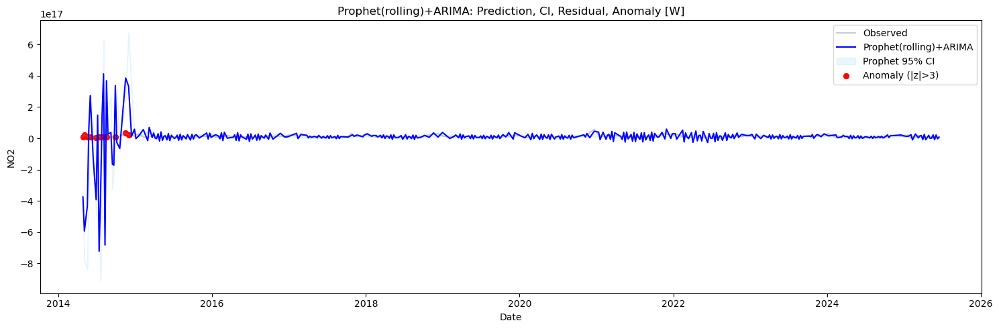

02:15:06 - cmdstanpy - INFO - Chain [1] start processing
02:15:06 - cmdstanpy - INFO - Chain [1] done processing
02:15:06 - cmdstanpy - INFO - Chain [1] start processing
02:15:06 - cmdstanpy - INFO - Chain [1] done processing
02:15:06 - cmdstanpy - INFO - Chain [1] start processing
02:15:06 - cmdstanpy - INFO - Chain [1] done processing
02:15:06 - cmdstanpy - INFO - Chain [1] start processing
02:15:07 - cmdstanpy - INFO - Chain [1] done processing
02:15:07 - cmdstanpy - INFO - Chain [1] start processing
02:15:07 - cmdstanpy - INFO - Chain [1] done processing
02:15:07 - cmdstanpy - INFO - Chain [1] start processing
02:15:08 - cmdstanpy - INFO - Chain [1] done processing
02:15:08 - cmdstanpy - INFO - Chain [1] start processing
02:15:08 - cmdstanpy - INFO - Chain [1] done processing
02:15:08 - cmdstanpy - INFO - Chain [1] start processing
02:15:08 - cmdstanpy - INFO - Chain [1] done processing
02:15:08 - cmdstanpy - INFO - Chain [1] start processing
02:15:09 - cmdstanpy - INFO - Chain [1]

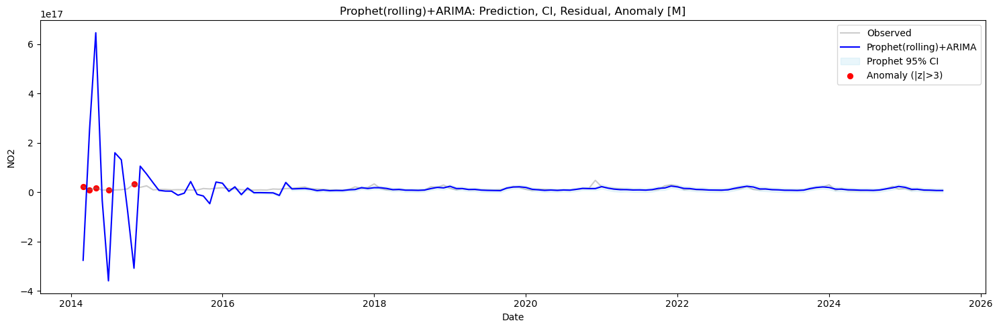

In [51]:
df_pgg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_pgg_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=80, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_pgg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_pgg_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=12, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_pgg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_pgg_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=2, test_steps=1, step=1, z_thresh=3, freq='M', plot=True
)

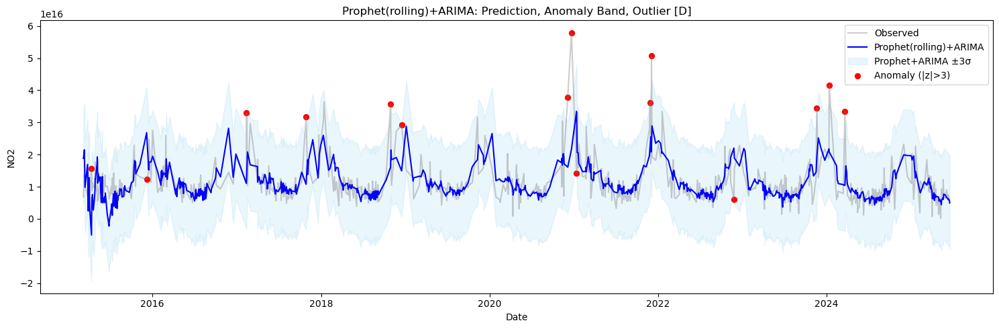

In [52]:
plot_arima_anomaly_band(df_pgg_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


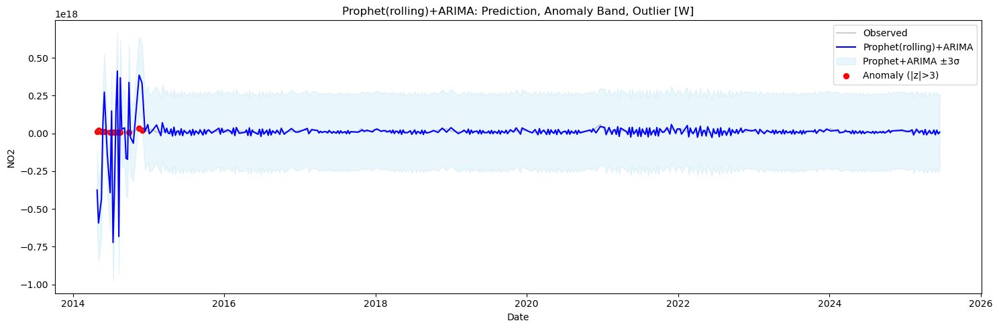

In [53]:
plot_arima_anomaly_band(df_pgg_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


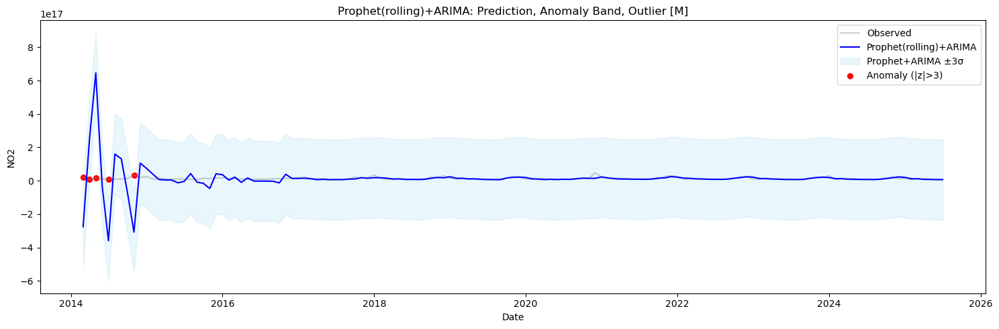

In [54]:
plot_arima_anomaly_band(df_pgg_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


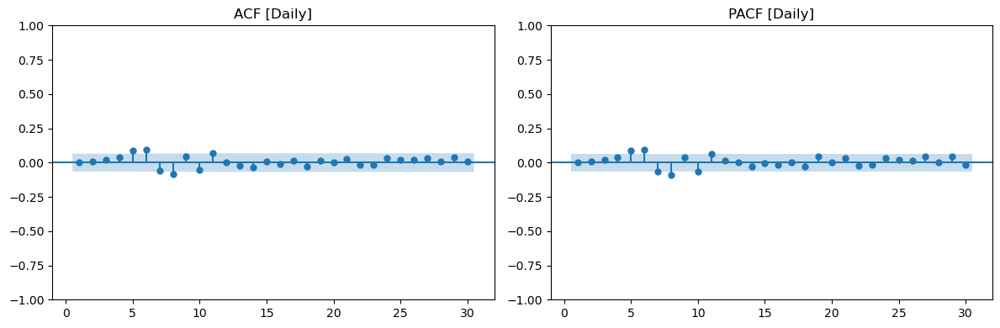

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  30.970613   0.000593
20  38.587475   0.007500
30  44.072933   0.046972



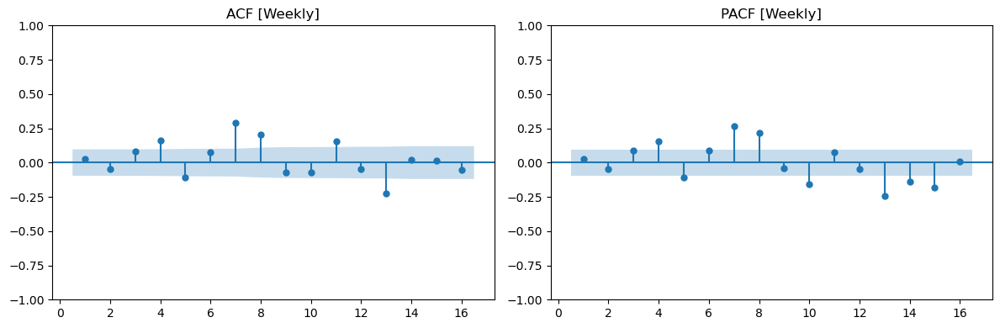

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
       lb_stat     lb_pvalue
8    76.053127  3.034396e-13
12   91.942951  2.074355e-14
16  115.034038  4.920839e-17



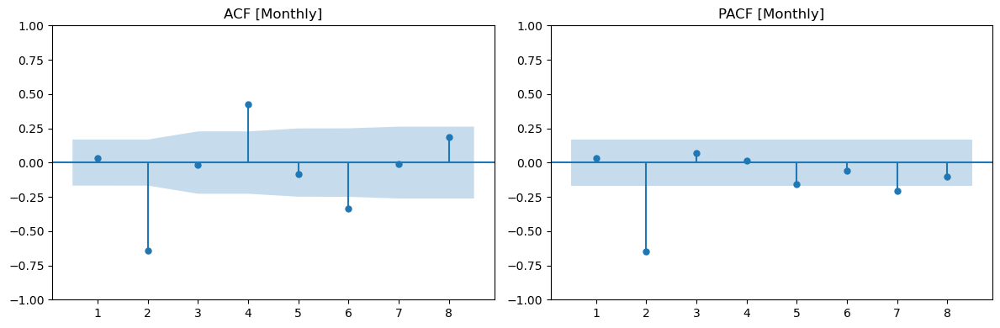

Ljung-Box Test [Monthly] (using lags [4, 8]):
      lb_stat     lb_pvalue
4   84.196760  2.245778e-17
8  106.262321  2.228798e-19



In [55]:
# Daily residual
residual_diagnostics(df_pgg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_pgg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_pgg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Qinbei plant

In [56]:
df_qbi_NASA = pd.read_csv('Huaneng/Huaneng_qinbei.csv')
df_qbi_NASA = cleaning_NASA_data(df_qbi_NASA,'NO2')
df_qbi_NASA

,date,NO2
0,2014-01-01,1.824238e+16
1,2014-01-03,3.697866e+16
2,2014-01-05,3.507930e+16
3,2014-01-06,4.187277e+16
4,2014-01-10,2.193271e+16
...,...,...
1616,2025-06-24,5.497729e+15
1617,2025-06-25,6.335614e+15
1618,2025-06-28,6.153384e+15
1619,2025-06-29,3.978815e+15


02:16:52 - cmdstanpy - INFO - Chain [1] start processing
02:16:52 - cmdstanpy - INFO - Chain [1] done processing
02:16:52 - cmdstanpy - INFO - Chain [1] start processing
02:16:52 - cmdstanpy - INFO - Chain [1] done processing
02:16:52 - cmdstanpy - INFO - Chain [1] start processing
02:16:52 - cmdstanpy - INFO - Chain [1] done processing
02:16:52 - cmdstanpy - INFO - Chain [1] start processing
02:16:52 - cmdstanpy - INFO - Chain [1] done processing
02:16:52 - cmdstanpy - INFO - Chain [1] start processing
02:16:52 - cmdstanpy - INFO - Chain [1] done processing
02:16:53 - cmdstanpy - INFO - Chain [1] start processing
02:16:53 - cmdstanpy - INFO - Chain [1] done processing
02:16:53 - cmdstanpy - INFO - Chain [1] start processing
02:16:53 - cmdstanpy - INFO - Chain [1] done processing
02:16:53 - cmdstanpy - INFO - Chain [1] start processing
02:16:53 - cmdstanpy - INFO - Chain [1] done processing
02:16:53 - cmdstanpy - INFO - Chain [1] start processing
02:16:53 - cmdstanpy - INFO - Chain [1]

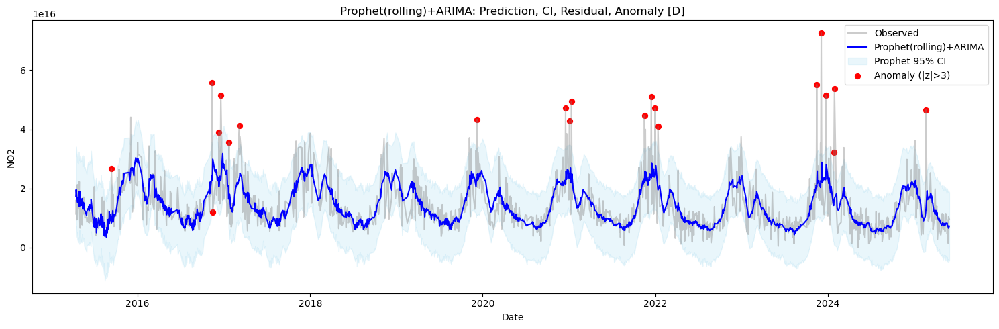

02:17:05 - cmdstanpy - INFO - Chain [1] start processing
02:17:05 - cmdstanpy - INFO - Chain [1] done processing
02:17:05 - cmdstanpy - INFO - Chain [1] start processing
02:17:05 - cmdstanpy - INFO - Chain [1] done processing
02:17:06 - cmdstanpy - INFO - Chain [1] start processing
02:17:06 - cmdstanpy - INFO - Chain [1] done processing
02:17:06 - cmdstanpy - INFO - Chain [1] start processing
02:17:06 - cmdstanpy - INFO - Chain [1] done processing
02:17:06 - cmdstanpy - INFO - Chain [1] start processing
02:17:06 - cmdstanpy - INFO - Chain [1] done processing
02:17:06 - cmdstanpy - INFO - Chain [1] start processing
02:17:06 - cmdstanpy - INFO - Chain [1] done processing
02:17:06 - cmdstanpy - INFO - Chain [1] start processing
02:17:07 - cmdstanpy - INFO - Chain [1] done processing
02:17:07 - cmdstanpy - INFO - Chain [1] start processing
02:17:07 - cmdstanpy - INFO - Chain [1] done processing
02:17:07 - cmdstanpy - INFO - Chain [1] start processing
02:17:07 - cmdstanpy - INFO - Chain [1]

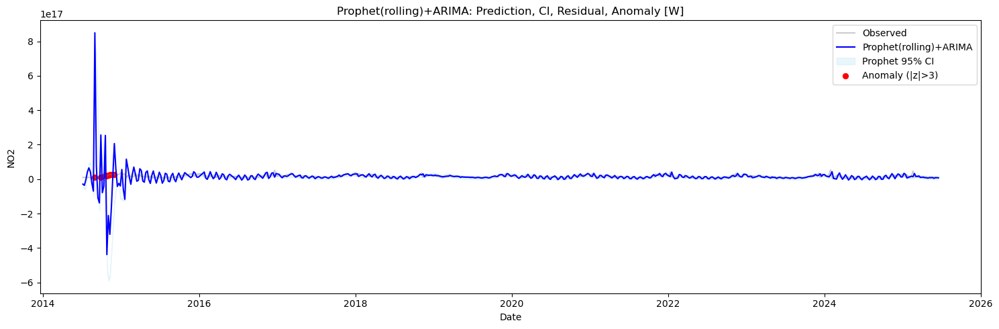

02:17:35 - cmdstanpy - INFO - Chain [1] start processing
02:17:36 - cmdstanpy - INFO - Chain [1] done processing
02:17:36 - cmdstanpy - INFO - Chain [1] start processing
02:17:36 - cmdstanpy - INFO - Chain [1] done processing
02:17:36 - cmdstanpy - INFO - Chain [1] start processing
02:17:37 - cmdstanpy - INFO - Chain [1] done processing
02:17:37 - cmdstanpy - INFO - Chain [1] start processing
02:17:39 - cmdstanpy - INFO - Chain [1] done processing
02:17:39 - cmdstanpy - INFO - Chain [1] start processing
02:17:39 - cmdstanpy - INFO - Chain [1] done processing
02:17:39 - cmdstanpy - INFO - Chain [1] start processing
02:17:44 - cmdstanpy - INFO - Chain [1] done processing
02:17:44 - cmdstanpy - INFO - Chain [1] start processing
02:17:51 - cmdstanpy - INFO - Chain [1] done processing
02:17:51 - cmdstanpy - INFO - Chain [1] start processing
02:17:51 - cmdstanpy - INFO - Chain [1] done processing
02:17:52 - cmdstanpy - INFO - Chain [1] start processing
02:17:52 - cmdstanpy - INFO - Chain [1]

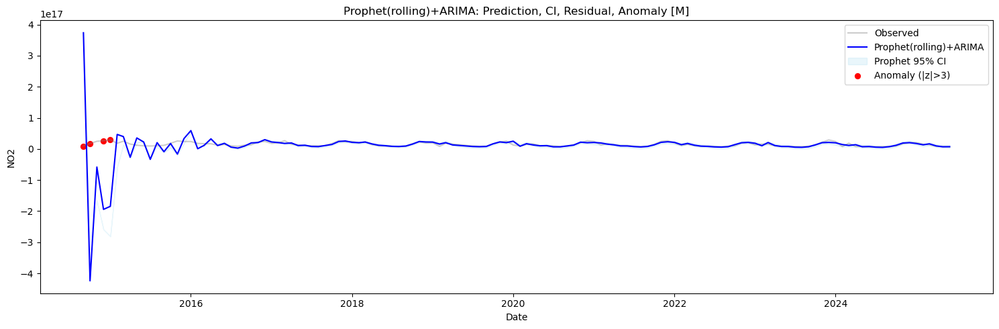

In [57]:
df_qbi_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qbi_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=170, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_qbi_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qbi_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps= 25, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_qbi_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qbi_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=8, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

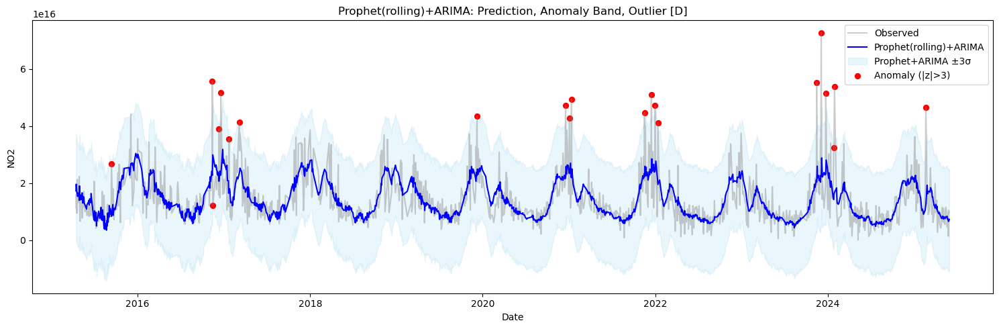

In [58]:
plot_arima_anomaly_band(df_qbi_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


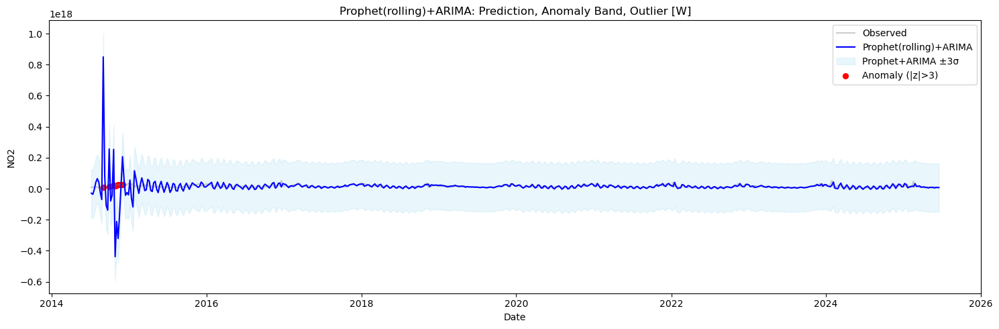

In [59]:
plot_arima_anomaly_band(df_qbi_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


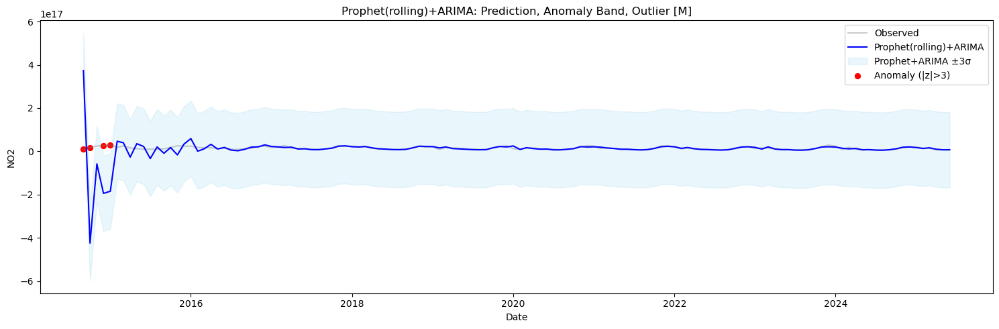

In [60]:
plot_arima_anomaly_band(df_qbi_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


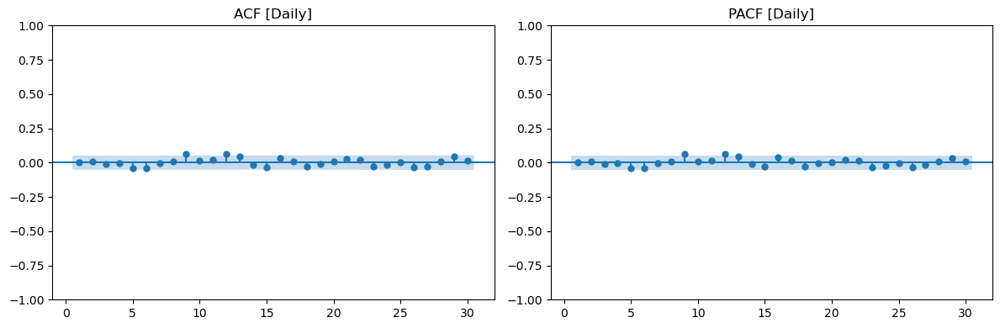

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  11.916177   0.290706
20  26.872144   0.138900
30  36.416308   0.194762



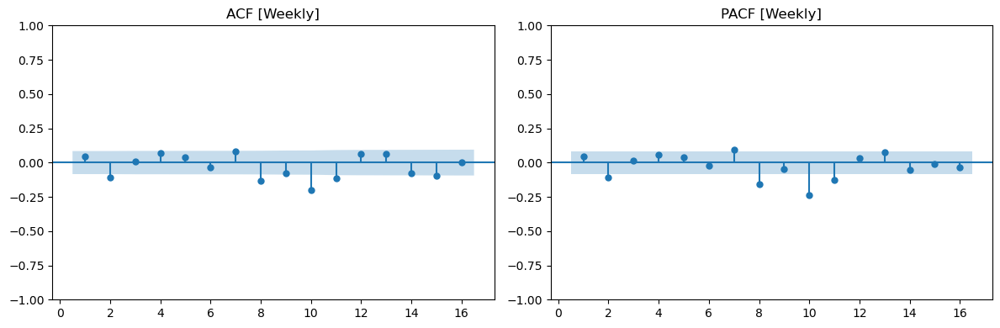

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   25.910960  1.087785e-03
12  61.283771  1.315637e-08
16  72.021022  4.405085e-09



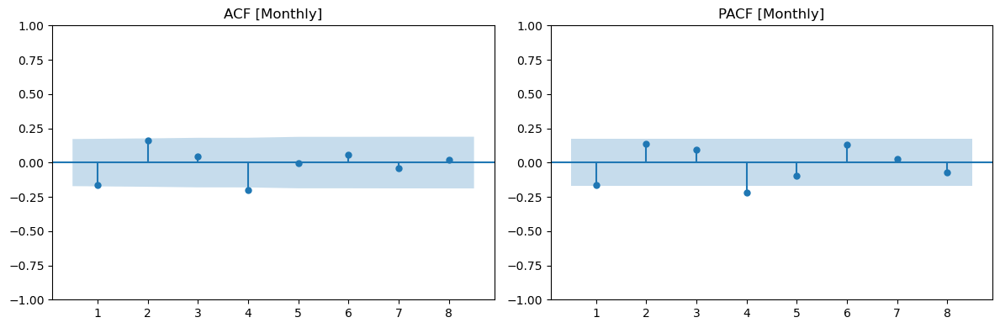

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  12.995665   0.011297
8  13.782922   0.087602



In [61]:
# Daily residual
residual_diagnostics(df_qbi_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_qbi_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_qbi_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Shangan Plant

In [62]:
df_san_NASA = pd.read_csv('Huaneng/Huaneng_shangan.csv')
df_san_NASA = cleaning_NASA_data(df_san_NASA,'NO2')
df_san_NASA

,date,NO2
0,2014-01-01,1.340639e+16
1,2014-01-02,7.170830e+16
2,2014-01-04,3.256192e+16
3,2014-01-08,2.570552e+16
4,2014-01-09,5.147261e+16
...,...,...
1653,2025-06-23,8.145927e+15
1654,2025-06-26,5.844085e+15
1655,2025-06-28,6.899407e+15
1656,2025-06-30,8.200890e+15


02:19:24 - cmdstanpy - INFO - Chain [1] start processing
02:19:24 - cmdstanpy - INFO - Chain [1] done processing
02:19:24 - cmdstanpy - INFO - Chain [1] start processing
02:19:24 - cmdstanpy - INFO - Chain [1] done processing
02:19:24 - cmdstanpy - INFO - Chain [1] start processing
02:19:24 - cmdstanpy - INFO - Chain [1] done processing
02:19:24 - cmdstanpy - INFO - Chain [1] start processing
02:19:24 - cmdstanpy - INFO - Chain [1] done processing
02:19:24 - cmdstanpy - INFO - Chain [1] start processing
02:19:24 - cmdstanpy - INFO - Chain [1] done processing
02:19:25 - cmdstanpy - INFO - Chain [1] start processing
02:19:25 - cmdstanpy - INFO - Chain [1] done processing
02:19:25 - cmdstanpy - INFO - Chain [1] start processing
02:19:25 - cmdstanpy - INFO - Chain [1] done processing
02:19:25 - cmdstanpy - INFO - Chain [1] start processing
02:19:25 - cmdstanpy - INFO - Chain [1] done processing
02:19:25 - cmdstanpy - INFO - Chain [1] start processing
02:19:25 - cmdstanpy - INFO - Chain [1]

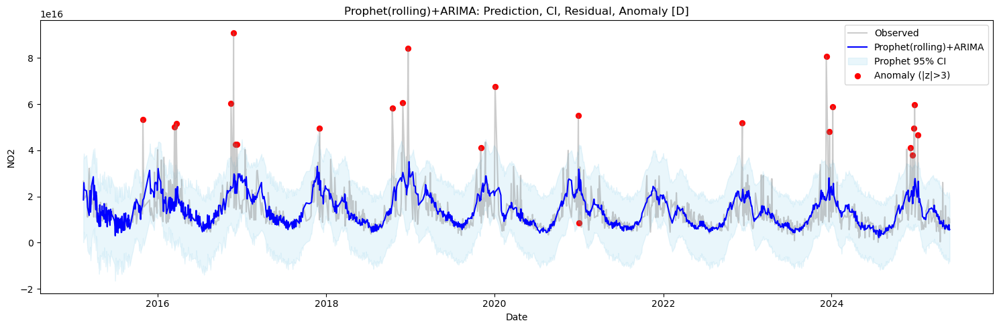

02:19:45 - cmdstanpy - INFO - Chain [1] start processing
02:19:45 - cmdstanpy - INFO - Chain [1] done processing
02:19:45 - cmdstanpy - INFO - Chain [1] start processing
02:19:45 - cmdstanpy - INFO - Chain [1] done processing
02:19:45 - cmdstanpy - INFO - Chain [1] start processing
02:19:45 - cmdstanpy - INFO - Chain [1] done processing
02:19:46 - cmdstanpy - INFO - Chain [1] start processing
02:19:46 - cmdstanpy - INFO - Chain [1] done processing
02:19:46 - cmdstanpy - INFO - Chain [1] start processing
02:19:46 - cmdstanpy - INFO - Chain [1] done processing
02:19:46 - cmdstanpy - INFO - Chain [1] start processing
02:19:46 - cmdstanpy - INFO - Chain [1] done processing
02:19:46 - cmdstanpy - INFO - Chain [1] start processing
02:19:47 - cmdstanpy - INFO - Chain [1] done processing
02:19:47 - cmdstanpy - INFO - Chain [1] start processing
02:19:47 - cmdstanpy - INFO - Chain [1] done processing
02:19:47 - cmdstanpy - INFO - Chain [1] start processing
02:19:47 - cmdstanpy - INFO - Chain [1]

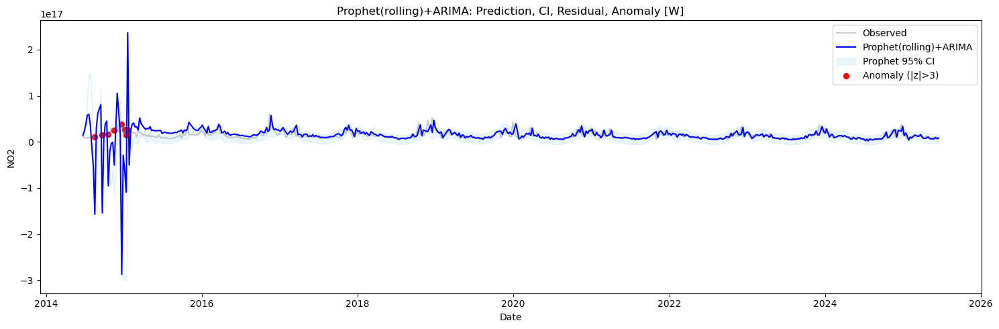

02:20:19 - cmdstanpy - INFO - Chain [1] start processing
02:20:19 - cmdstanpy - INFO - Chain [1] done processing
02:20:20 - cmdstanpy - INFO - Chain [1] start processing
02:20:20 - cmdstanpy - INFO - Chain [1] done processing
02:20:20 - cmdstanpy - INFO - Chain [1] start processing
02:20:20 - cmdstanpy - INFO - Chain [1] done processing
02:20:20 - cmdstanpy - INFO - Chain [1] start processing
02:20:20 - cmdstanpy - INFO - Chain [1] done processing
02:20:20 - cmdstanpy - INFO - Chain [1] start processing
02:20:22 - cmdstanpy - INFO - Chain [1] done processing
02:20:22 - cmdstanpy - INFO - Chain [1] start processing
02:20:22 - cmdstanpy - INFO - Chain [1] done processing
02:20:22 - cmdstanpy - INFO - Chain [1] start processing
02:20:22 - cmdstanpy - INFO - Chain [1] done processing
02:20:22 - cmdstanpy - INFO - Chain [1] start processing
02:20:30 - cmdstanpy - INFO - Chain [1] done processing
02:20:30 - cmdstanpy - INFO - Chain [1] start processing
02:20:32 - cmdstanpy - INFO - Chain [1]

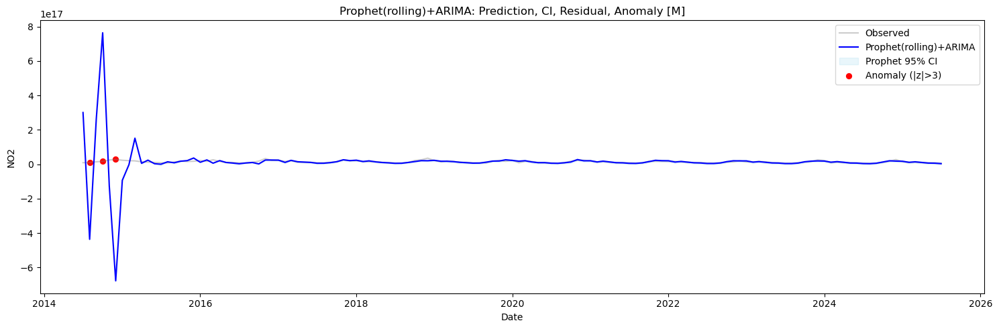

In [63]:
df_san_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_san_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=170, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_san_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_san_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=25, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_san_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_san_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=6, test_steps=3, step=1, z_thresh=3, freq='M', plot=True
)

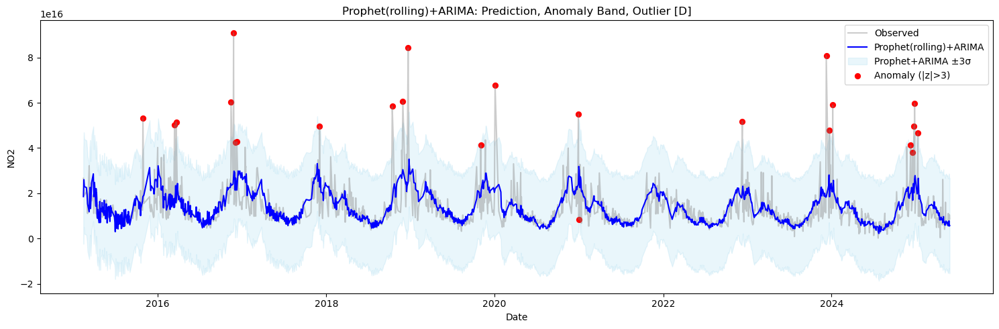

In [64]:
plot_arima_anomaly_band(df_san_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


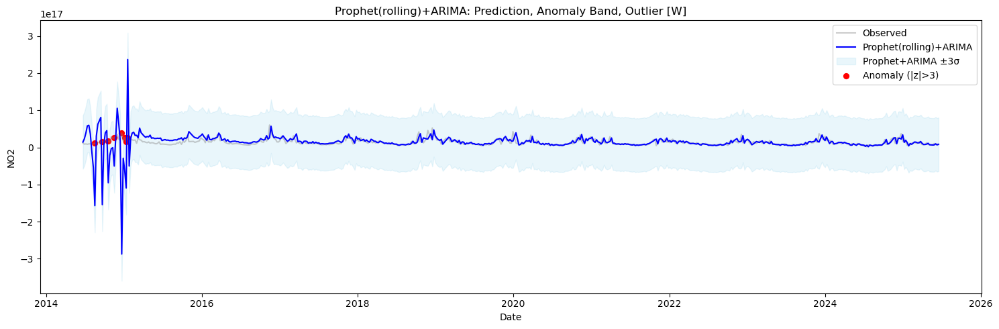

In [65]:
plot_arima_anomaly_band(df_san_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


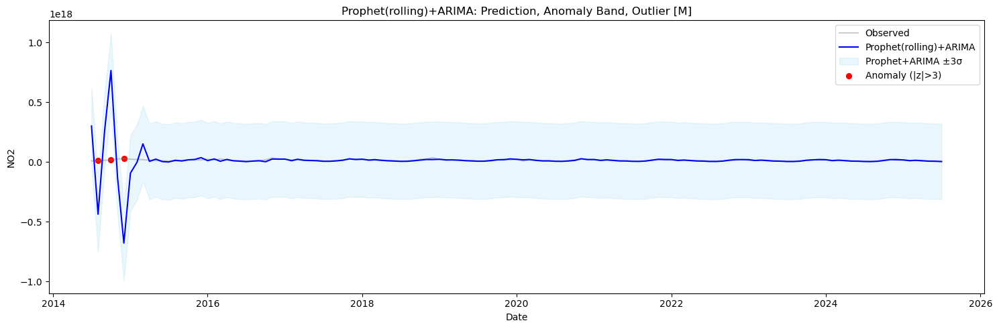

In [66]:
plot_arima_anomaly_band(df_san_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


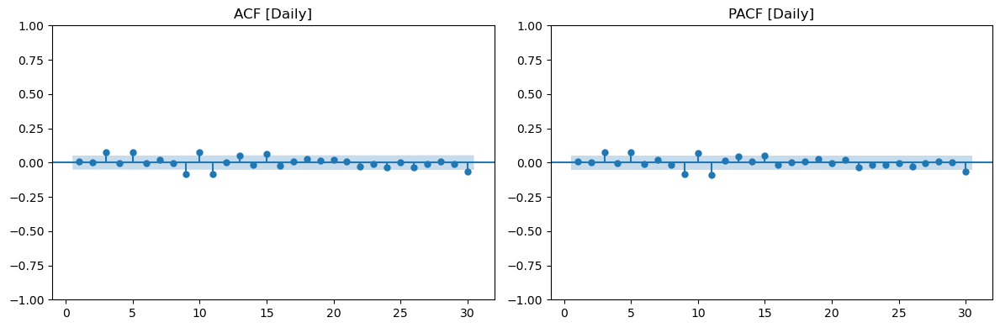

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  36.766201   0.000062
20  60.940437   0.000005
30  72.665786   0.000021



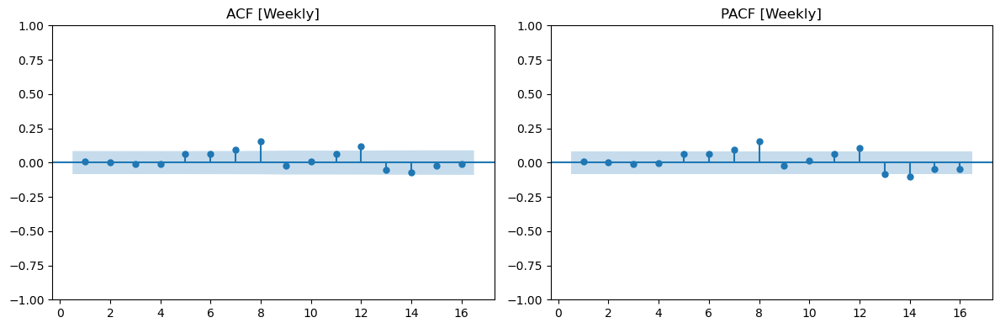

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   22.459984   0.004131
12  32.599018   0.001118
16  37.441510   0.001817



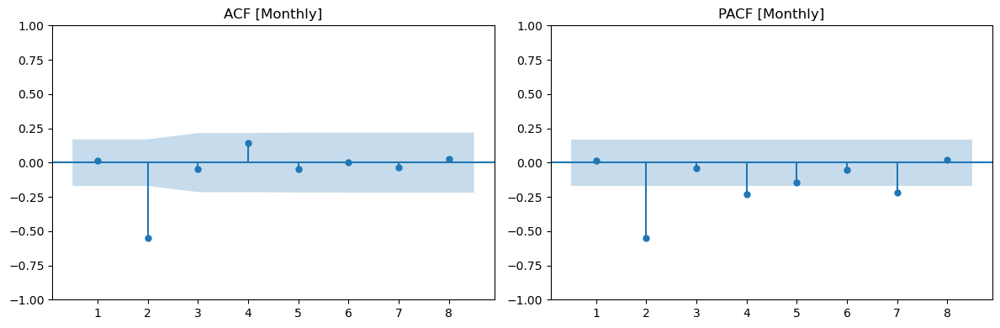

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat     lb_pvalue
4  44.846530  4.279048e-09
8  45.426025  3.055263e-07



In [67]:
# Daily residual
residual_diagnostics(df_san_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_san_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_san_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Shangdu Plant

In [68]:
df_sau_NASA = pd.read_csv('Huaneng/Huaneng_shangdu.csv')
df_sau_NASA = cleaning_NASA_data(df_sau_NASA,'NO2')
df_sau_NASA

,date,NO2
0,2014-01-01,1.533138e+16
1,2014-01-02,5.634214e+16
2,2014-01-03,3.311498e+16
3,2014-01-04,4.246500e+16
4,2014-01-08,2.623453e+16
...,...,...
1903,2025-06-20,1.098561e+16
1904,2025-06-22,9.761379e+15
1905,2025-06-24,5.216835e+15
1906,2025-06-27,8.455685e+15


02:22:17 - cmdstanpy - INFO - Chain [1] start processing
02:22:17 - cmdstanpy - INFO - Chain [1] done processing
02:22:17 - cmdstanpy - INFO - Chain [1] start processing
02:22:17 - cmdstanpy - INFO - Chain [1] done processing
02:22:18 - cmdstanpy - INFO - Chain [1] start processing
02:22:18 - cmdstanpy - INFO - Chain [1] done processing
02:22:18 - cmdstanpy - INFO - Chain [1] start processing
02:22:18 - cmdstanpy - INFO - Chain [1] done processing
02:22:18 - cmdstanpy - INFO - Chain [1] start processing
02:22:18 - cmdstanpy - INFO - Chain [1] done processing
02:22:18 - cmdstanpy - INFO - Chain [1] start processing
02:22:18 - cmdstanpy - INFO - Chain [1] done processing
02:22:18 - cmdstanpy - INFO - Chain [1] start processing
02:22:18 - cmdstanpy - INFO - Chain [1] done processing
02:22:19 - cmdstanpy - INFO - Chain [1] start processing
02:22:19 - cmdstanpy - INFO - Chain [1] done processing
02:22:19 - cmdstanpy - INFO - Chain [1] start processing
02:22:19 - cmdstanpy - INFO - Chain [1]

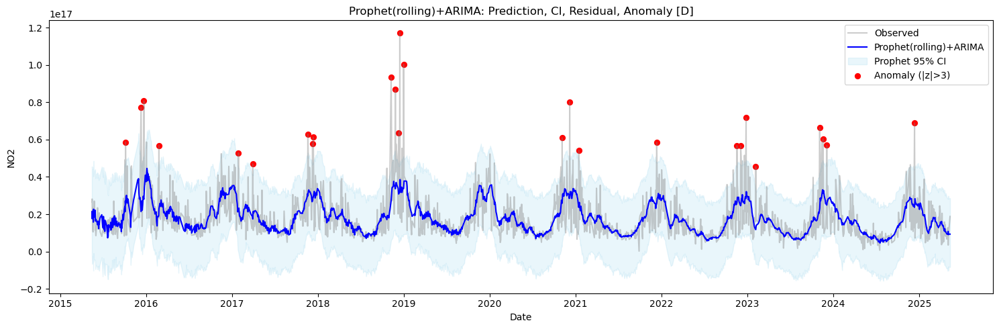

02:22:32 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] done processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] done processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] done processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:34 - cmdstanpy - INFO - Chain [1] done processing
02:22:34 - cmdstanpy - INFO - Chain [1] start processing
02:22:34 - cmdstanpy - INFO - Chain [1] done processing
02:22:34 - cmdstanpy - INFO - Chain [1] start processing
02:22:34 - cmdstanpy - INFO - Chain [1] done processing
02:22:34 - cmdstanpy - INFO - Chain [1] start processing
02:22:34 - cmdstanpy - INFO - Chain [1] done processing
02:22:34 - cmdstanpy - INFO - Chain [1] start processing
02:22:35 - cmdstanpy - INFO - Chain [1] done processing
02:22:35 - cmdstanpy - INFO - Chain [1] start processing
02:22:35 - cmdstanpy - INFO - Chain [1]

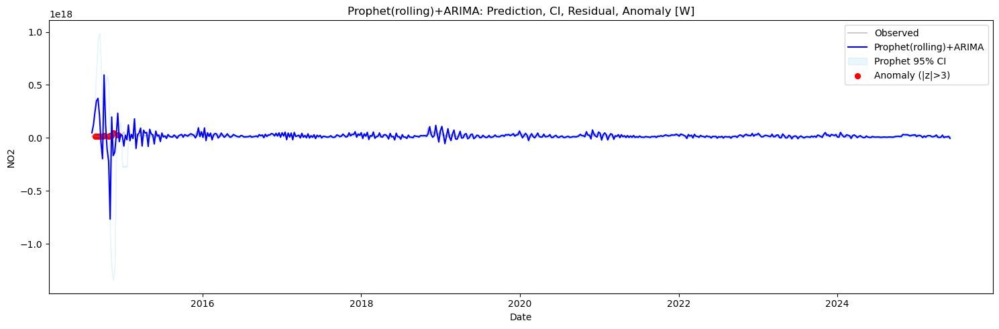

02:23:04 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] done processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:25 - cmdstanpy - INFO - Chain [1] done processing
02:23:25 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1]

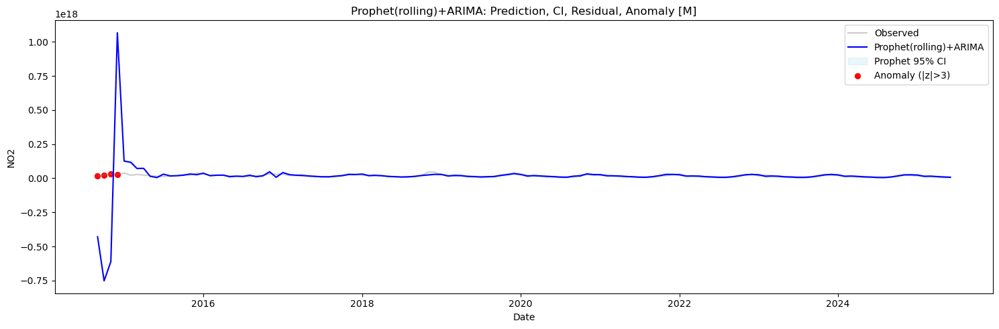

In [69]:
df_sau_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sau_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=230, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_sau_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sau_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=32, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_sau_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sau_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=8, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

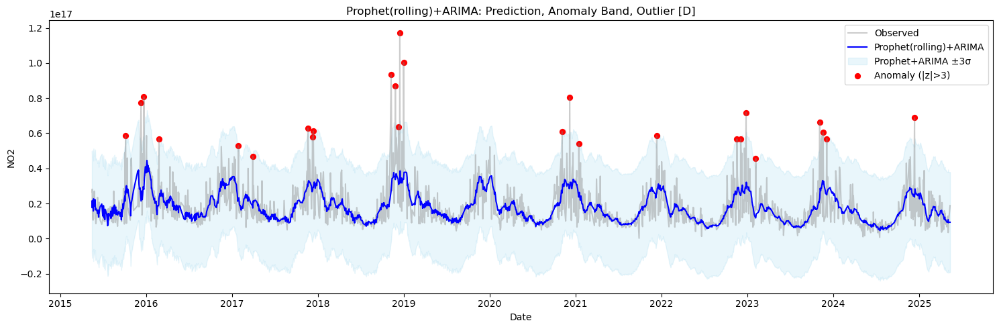

In [70]:
plot_arima_anomaly_band(df_sau_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


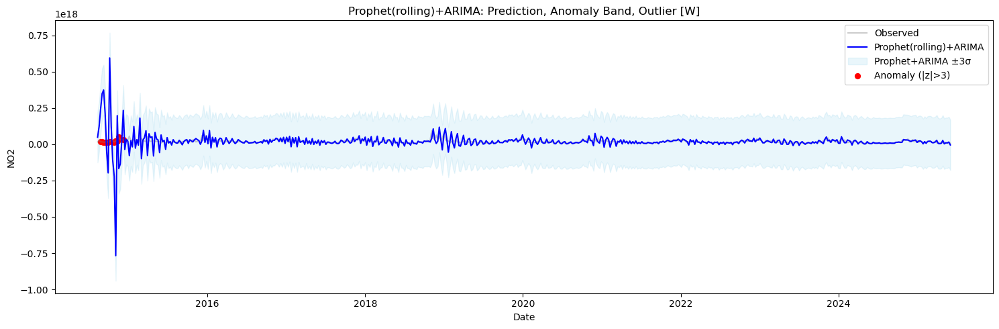

In [71]:
plot_arima_anomaly_band(df_sau_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


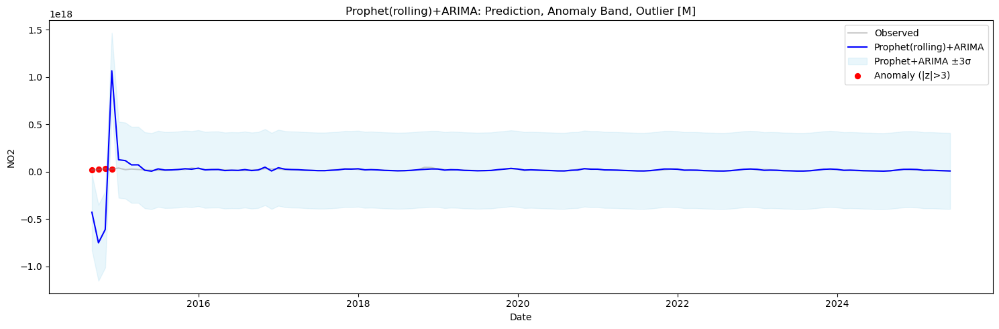

In [72]:
plot_arima_anomaly_band(df_sau_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


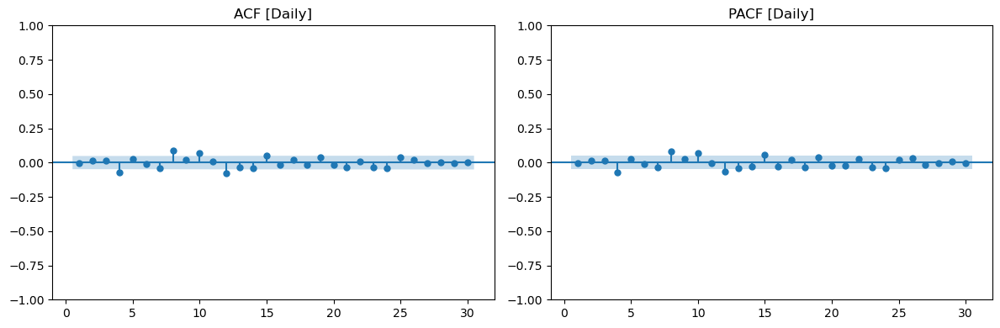

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  34.313341   0.000163
20  57.510755   0.000017
30  67.762740   0.000096



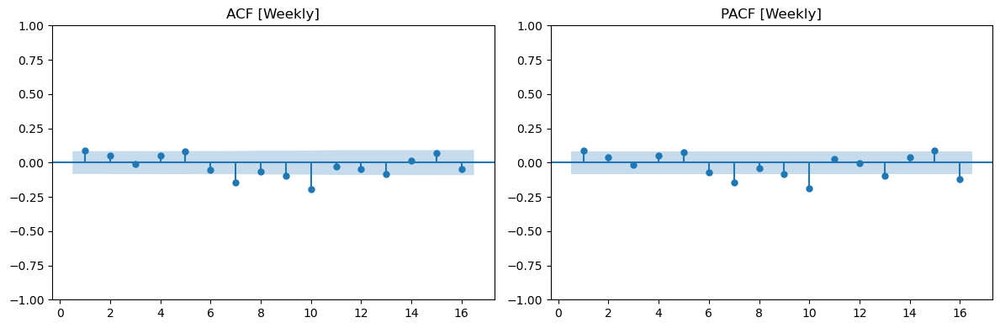

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   27.388816  6.055660e-04
12  55.426224  1.517736e-07
16  63.149346  1.529419e-07



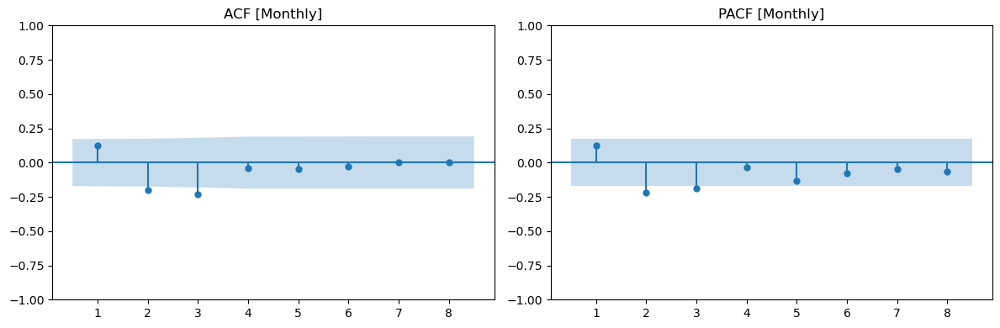

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  14.885614   0.004944
8  15.304725   0.053484



In [73]:
# Daily residual
residual_diagnostics(df_sau_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_sau_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_sau_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Yangluo Plant

In [74]:
df_ygo_NASA = pd.read_csv('Huaneng/Huaneng_yangluo.csv')
df_ygo_NASA = cleaning_NASA_data(df_ygo_NASA,'NO2')
df_ygo_NASA

,date,NO2
0,2014-01-01,3.192032e+15
1,2014-01-03,3.485216e+15
2,2014-01-05,6.015807e+15
3,2014-01-06,1.171956e+16
4,2014-01-08,3.624220e+15
...,...,...
2046,2025-06-23,4.995525e+15
2047,2025-06-24,5.619449e+15
2048,2025-06-25,6.167316e+15
2049,2025-06-28,6.320609e+15


02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1]

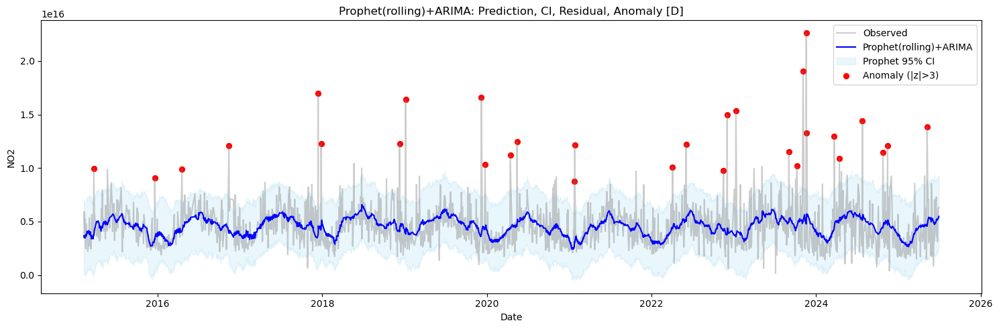

02:25:31 - cmdstanpy - INFO - Chain [1] start processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing
02:25:31 - cmdstanpy - INFO - Chain [1] start processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing
02:25:31 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] done processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] done processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] done processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] done processing
02:25:33 - cmdstanpy - INFO - Chain [1] start processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing
02:25:33 - cmdstanpy - INFO - Chain [1] start processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing
02:25:33 - cmdstanpy - INFO - Chain [1] start processing
02:25:33 - cmdstanpy - INFO - Chain [1]

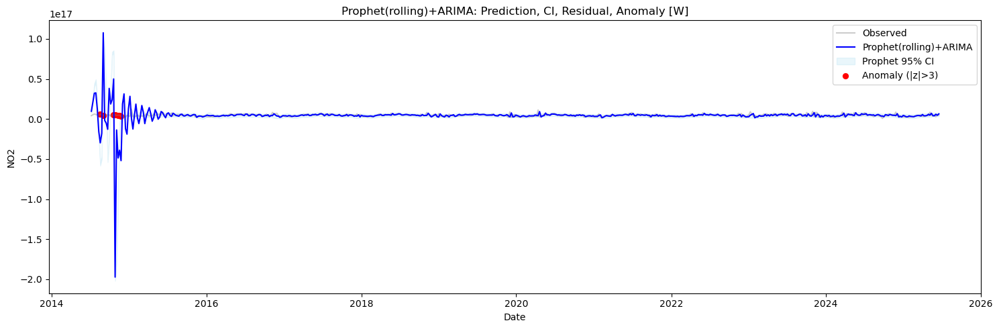

02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] done processing
02:26:02 - cmdstanpy - INFO - Chain [1] start processing
02:26:02 - cmdstanpy - INFO - Chain [1] done processing
02:26:02 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:20 - cmdstanpy - INFO - Chain [1]

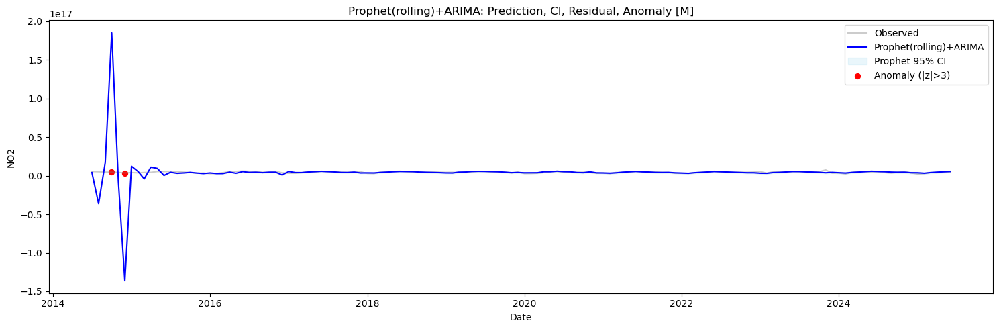

In [75]:
df_ygo_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ygo_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=190, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_ygo_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ygo_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=27, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_ygo_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ygo_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=6, test_steps=2, step=1, z_thresh=3, freq='M', plot=True
)

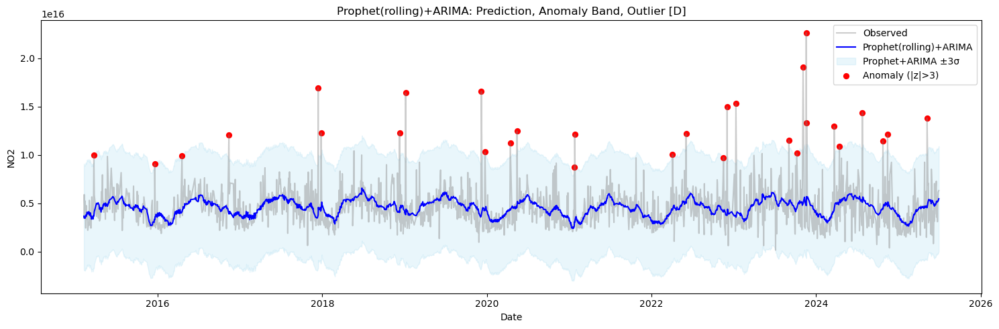

In [76]:
plot_arima_anomaly_band(df_ygo_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


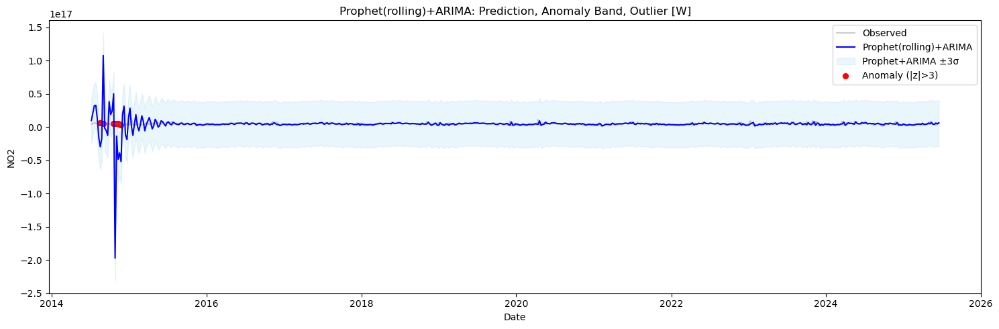

In [77]:
plot_arima_anomaly_band(df_ygo_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


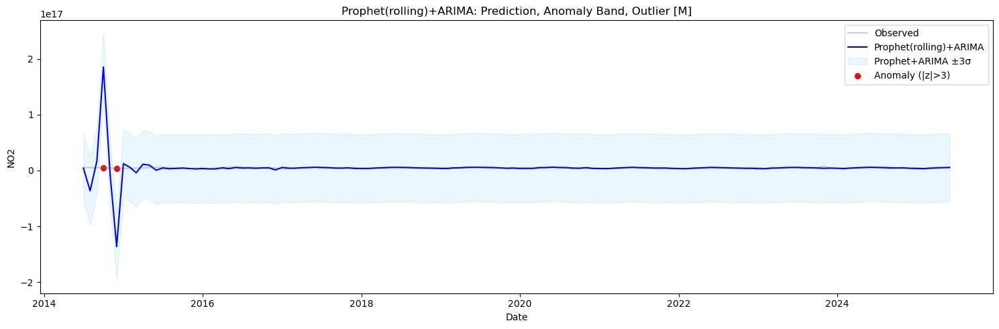

In [78]:
plot_arima_anomaly_band(df_ygo_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


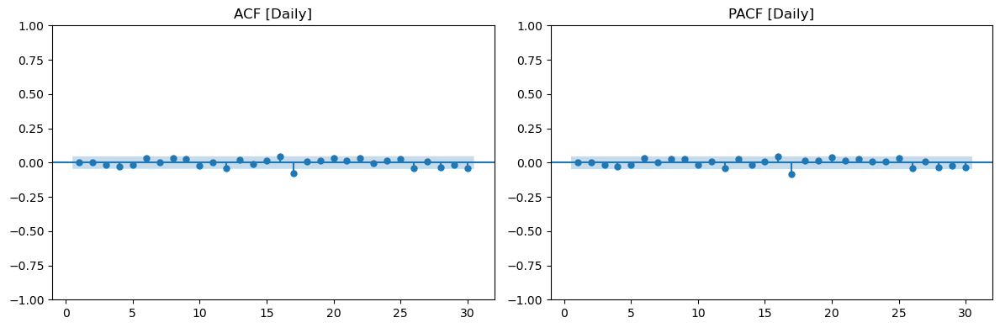

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   8.317877   0.597818
20  30.896369   0.056573
30  43.783762   0.049888



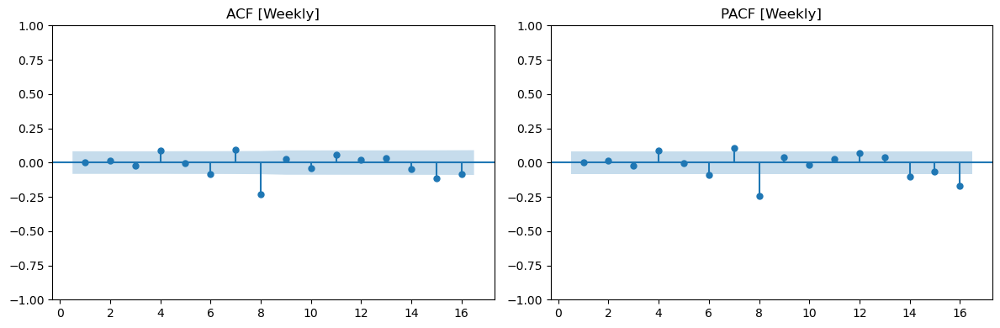

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   44.737392  4.126652e-07
12  48.320334  2.748858e-06
16  61.714728  2.684187e-07



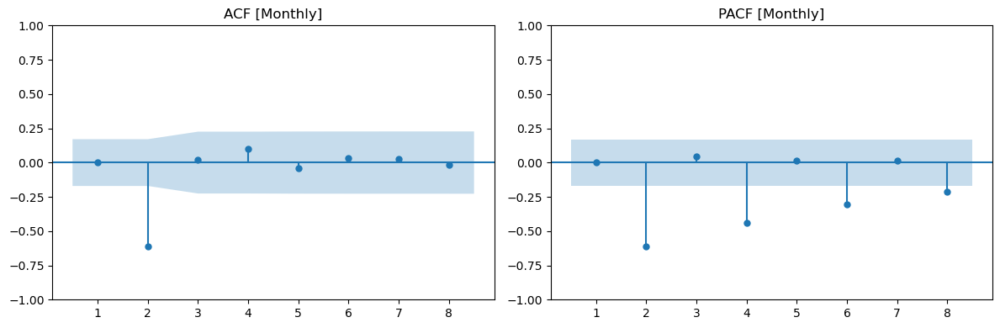

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat     lb_pvalue
4  52.346384  1.167530e-10
8  52.855463  1.150194e-08



In [79]:
# Daily residual
residual_diagnostics(df_ygo_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_ygo_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_ygo_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Yimin Plant

In [80]:
df_ymn_NASA = pd.read_csv('Huaneng/Huaneng_yimin.csv')
df_ymn_NASA = cleaning_NASA_data(df_ymn_NASA,'NO2')
df_ymn_NASA

,date,NO2
0,2014-01-01,1.173742e+16
1,2014-01-04,3.045914e+16
2,2014-01-09,1.923219e+16
3,2014-01-15,1.224713e+16
4,2014-01-16,2.498373e+16
...,...,...
1438,2025-06-16,3.817269e+15
1439,2025-06-17,5.006586e+15
1440,2025-06-28,6.492253e+15
1441,2025-06-30,4.451651e+15


02:28:22 - cmdstanpy - INFO - Chain [1] start processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] start processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] start processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1]

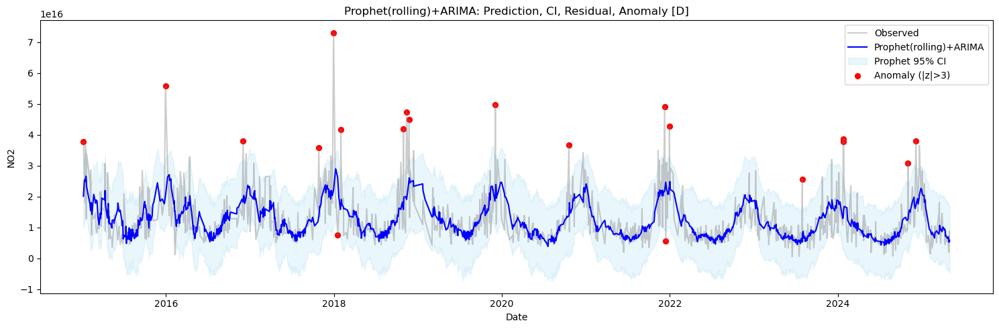

02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1]

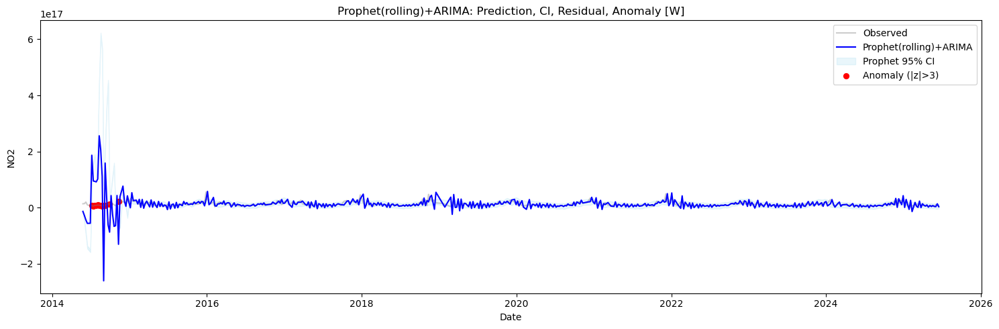

02:29:01 - cmdstanpy - INFO - Chain [1] start processing
02:29:01 - cmdstanpy - INFO - Chain [1] done processing
02:29:01 - cmdstanpy - INFO - Chain [1] start processing
02:29:01 - cmdstanpy - INFO - Chain [1] done processing
02:29:02 - cmdstanpy - INFO - Chain [1] start processing
02:29:02 - cmdstanpy - INFO - Chain [1] done processing
02:29:02 - cmdstanpy - INFO - Chain [1] start processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing
02:29:04 - cmdstanpy - INFO - Chain [1] start processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing
02:29:04 - cmdstanpy - INFO - Chain [1] start processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing
02:29:04 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] done processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] done processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:13 - cmdstanpy - INFO - Chain [1]

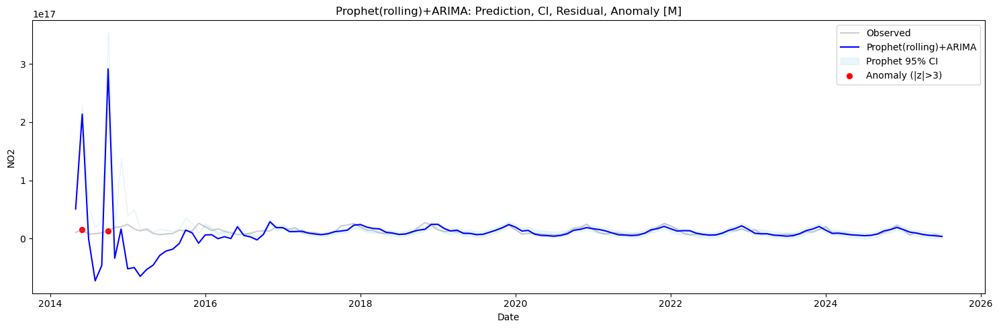

In [81]:
df_ymn_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ymn_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=130, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_ymn_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ymn_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=18, test_steps=5, step=4, z_thresh=3, freq='W', plot=True
)
df_ymn_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ymn_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=4, test_steps=1, step=1, z_thresh=3, freq='M', plot=True
)

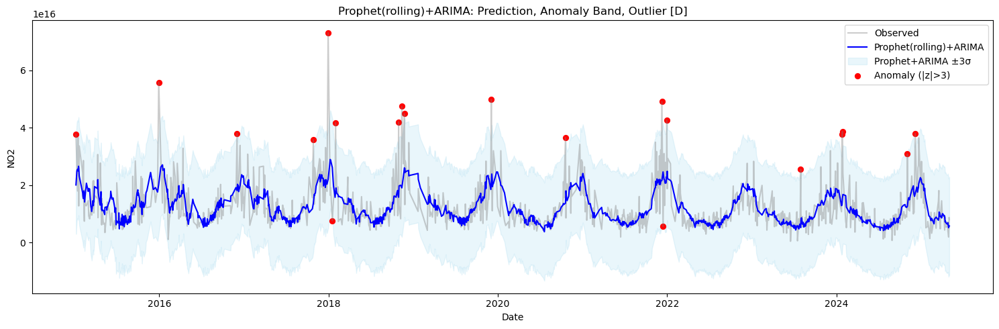

In [82]:
plot_arima_anomaly_band(df_ymn_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


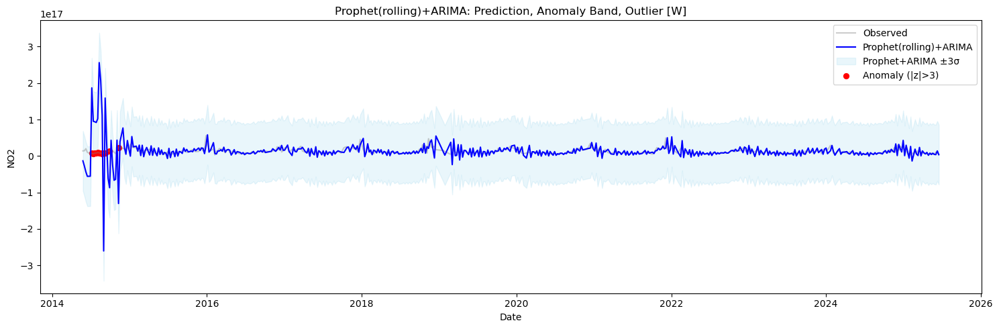

In [83]:
plot_arima_anomaly_band(df_ymn_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


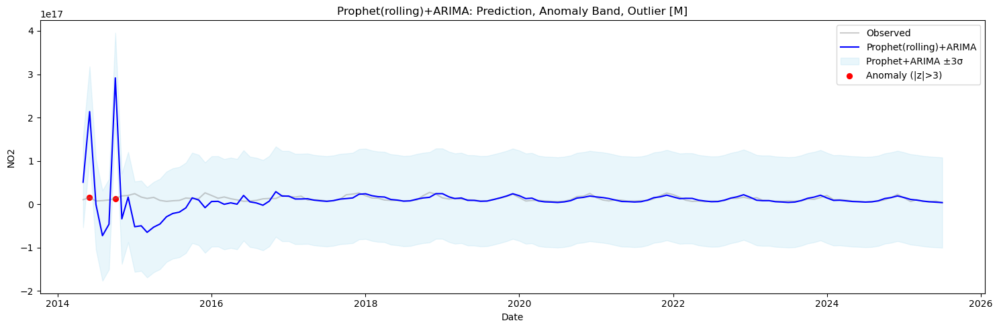

In [84]:
plot_arima_anomaly_band(df_ymn_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


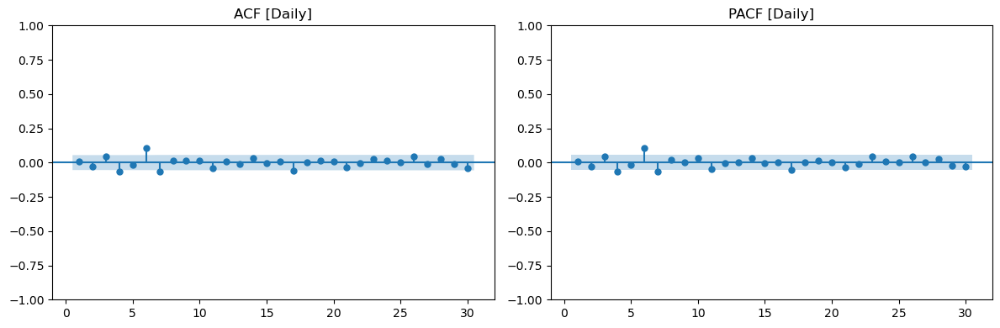

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  31.772374   0.000437
20  40.521859   0.004289
30  49.556301   0.013785



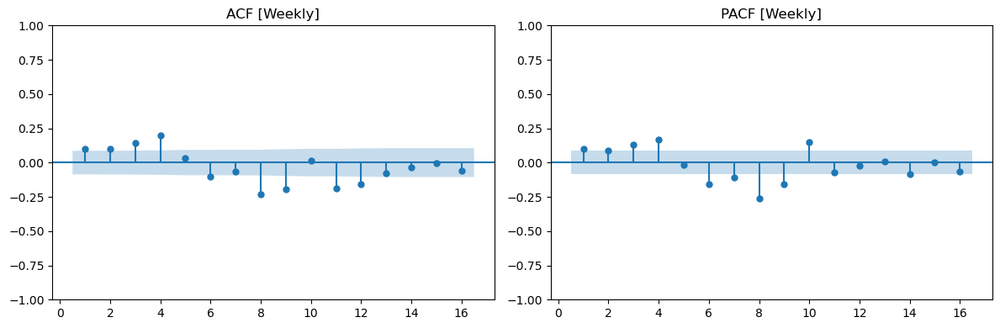

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
       lb_stat     lb_pvalue
8    77.818299  1.342357e-13
12  130.561451  4.761177e-22
16  136.211315  3.965125e-21



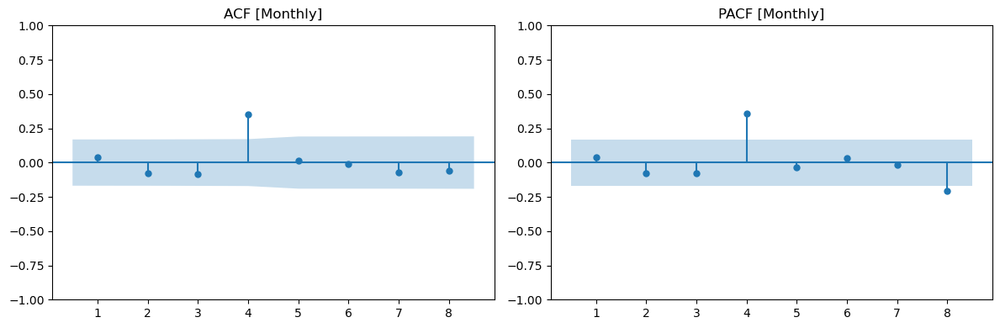

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  19.269788   0.000696
8  20.630158   0.008198



In [85]:
# Daily residual
residual_diagnostics(df_ymn_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_ymn_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_ymn_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Yueyang Plant

In [86]:
df_yyg_NASA = pd.read_csv('Huaneng/Huaneng_yueyang.csv')
df_yyg_NASA = cleaning_NASA_data(df_yyg_NASA,'NO2')
df_yyg_NASA

,date,NO2
0,2014-01-01,2.603020e+15
1,2014-01-03,2.735127e+15
2,2014-01-05,2.636033e+15
3,2014-01-07,2.184451e+15
4,2014-01-08,2.278346e+15
...,...,...
2339,2025-06-22,3.833733e+15
2340,2025-06-24,5.312435e+15
2341,2025-06-26,3.765264e+15
2342,2025-06-27,3.180358e+15


02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:59 - cmdstanpy - INFO - Chain [1] start processing
02:30:59 - cmdstanpy - INFO - Chain [1] done processing
02:30:59 - cmdstanpy - INFO - Chain [1] start processing
02:30:59 - cmdstanpy - INFO - Chain [1]

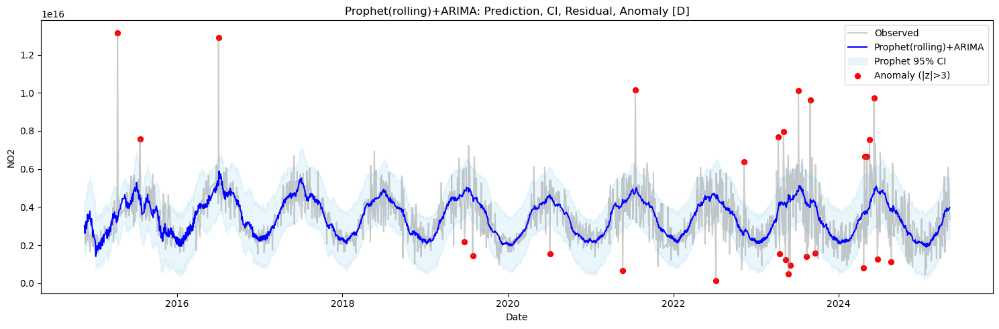

02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] done processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] done processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] start processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] start processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] start processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] start processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:20 - cmdstanpy - INFO - Chain [1] start processing
02:31:20 - cmdstanpy - INFO - Chain [1] done processing
02:31:20 - cmdstanpy - INFO - Chain [1] start processing
02:31:20 - cmdstanpy - INFO - Chain [1]

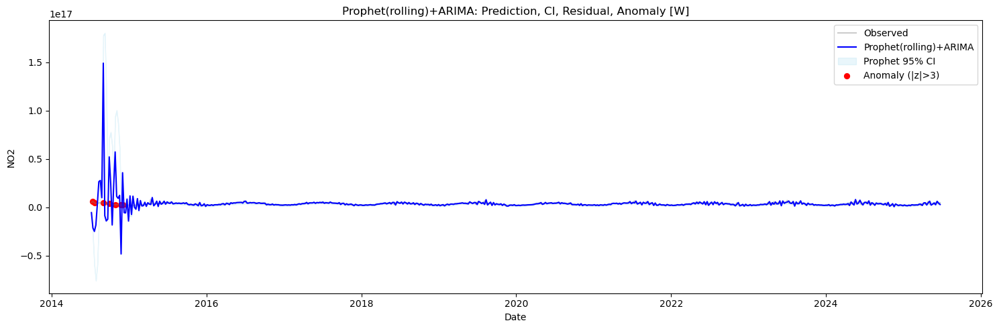

02:31:48 - cmdstanpy - INFO - Chain [1] start processing
02:31:48 - cmdstanpy - INFO - Chain [1] done processing
02:31:48 - cmdstanpy - INFO - Chain [1] start processing
02:31:48 - cmdstanpy - INFO - Chain [1] done processing
02:31:48 - cmdstanpy - INFO - Chain [1] start processing
02:31:48 - cmdstanpy - INFO - Chain [1] done processing
02:31:48 - cmdstanpy - INFO - Chain [1] start processing
02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:49 - cmdstanpy - INFO - Chain [1] start processing
02:31:54 - cmdstanpy - INFO - Chain [1] done processing
02:31:55 - cmdstanpy - INFO - Chain [1] start processing
02:32:00 - cmdstanpy - INFO - Chain [1] done processing
02:32:00 - cmdstanpy - INFO - Chain [1] start processing
02:32:05 - cmdstanpy - INFO - Chain [1] done processing
02:32:05 - cmdstanpy - INFO - Chain [1] start processing
02:32:12 - cmdstanpy - INFO - Chain [1] done processing
02:32:12 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1]

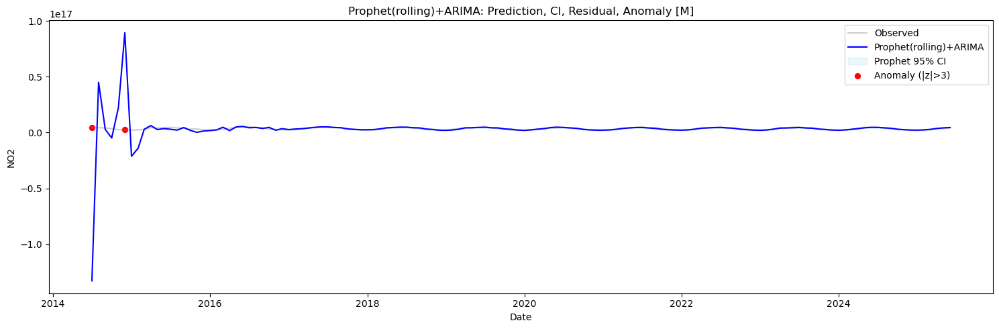

In [87]:
df_yyg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yyg_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=190, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_yyg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yyg_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=27, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_yyg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yyg_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=6, test_steps=3, step=1, z_thresh=3, freq='M', plot=True
)

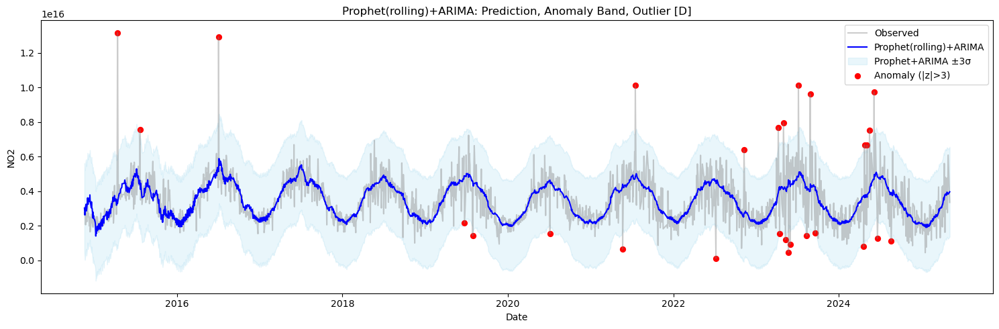

In [88]:
plot_arima_anomaly_band(df_yyg_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


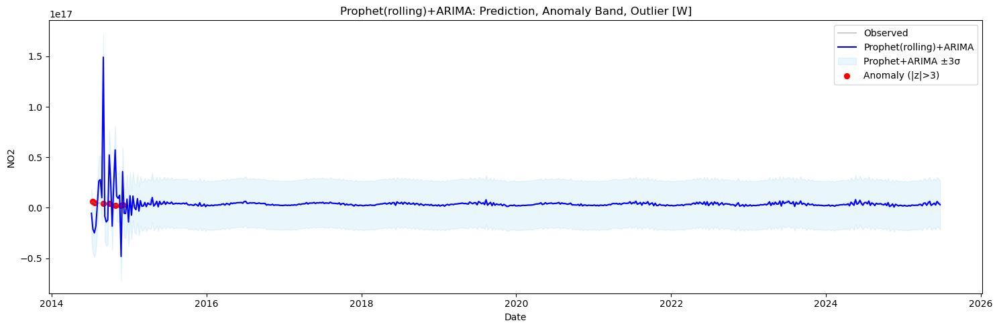

In [89]:
plot_arima_anomaly_band(df_yyg_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


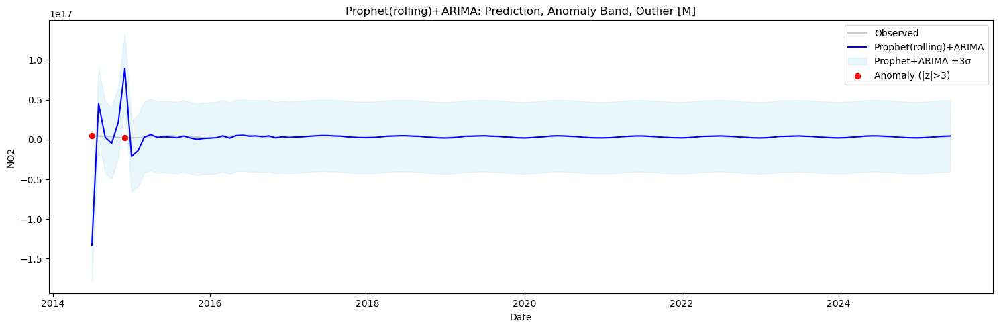

In [90]:
plot_arima_anomaly_band(df_yyg_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


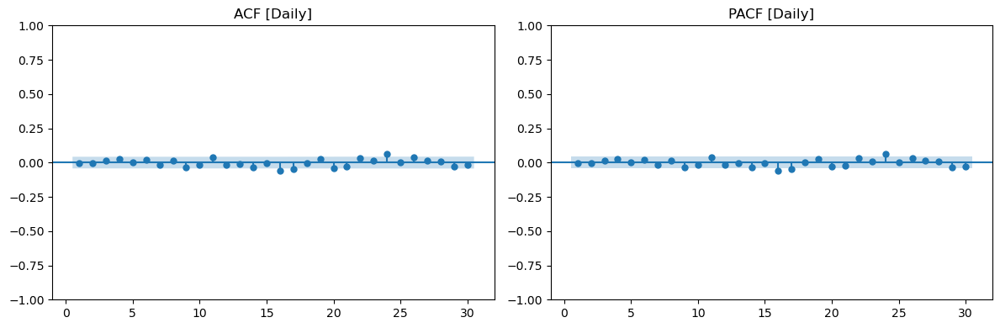

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   7.536499   0.674009
20  31.660738   0.047050
30  49.237094   0.014865



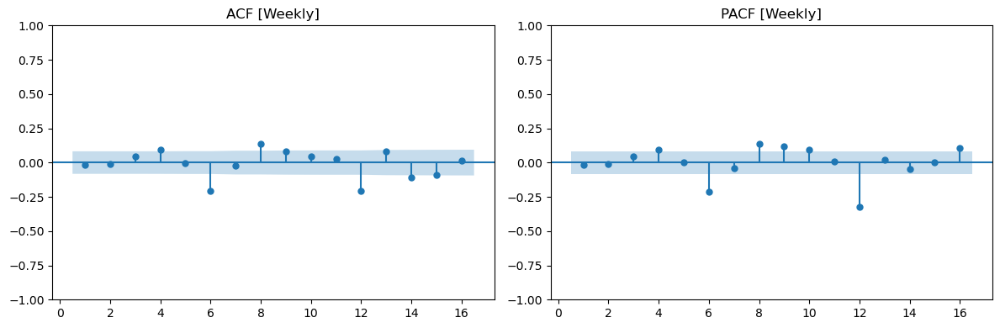

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   42.918055  9.101980e-07
12  72.369864  1.150920e-10
16  88.411733  4.901957e-12



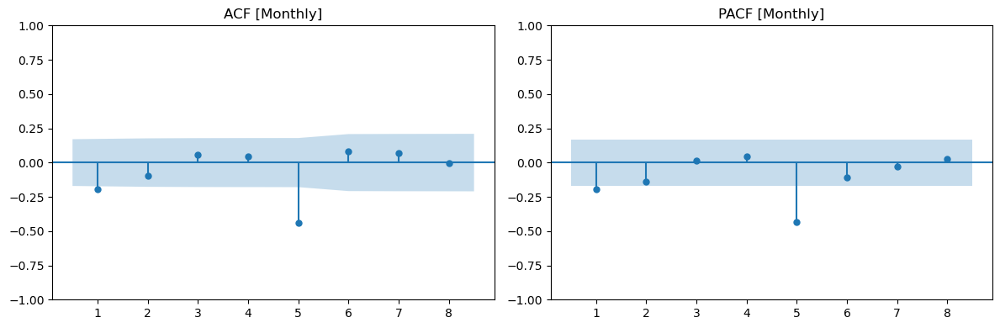

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4   6.999198   0.135931
8  35.460875   0.000022



In [91]:
# Daily residual
residual_diagnostics(df_yyg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_yyg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_yyg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Yuhuan Plant

In [92]:
df_yhn_NASA = pd.read_csv('Huaneng/Huaneng_yuhuan.csv')
df_yhn_NASA = cleaning_NASA_data(df_yhn_NASA,'NO2')
df_yhn_NASA

,date,NO2
0,2014-01-01,1.517633e+16
1,2014-01-04,2.627453e+16
2,2014-01-13,1.274195e+16
3,2014-01-15,7.350281e+15
4,2014-01-16,1.180629e+16
...,...,...
1452,2025-06-26,5.087045e+15
1453,2025-06-27,4.870814e+15
1454,2025-06-28,1.038138e+16
1455,2025-06-30,5.282191e+15


02:34:22 - cmdstanpy - INFO - Chain [1] start processing
02:34:22 - cmdstanpy - INFO - Chain [1] done processing
02:34:22 - cmdstanpy - INFO - Chain [1] start processing
02:34:22 - cmdstanpy - INFO - Chain [1] done processing
02:34:22 - cmdstanpy - INFO - Chain [1] start processing
02:34:22 - cmdstanpy - INFO - Chain [1] done processing
02:34:22 - cmdstanpy - INFO - Chain [1] start processing
02:34:22 - cmdstanpy - INFO - Chain [1] done processing
02:34:23 - cmdstanpy - INFO - Chain [1] start processing
02:34:23 - cmdstanpy - INFO - Chain [1] done processing
02:34:23 - cmdstanpy - INFO - Chain [1] start processing
02:34:23 - cmdstanpy - INFO - Chain [1] done processing
02:34:23 - cmdstanpy - INFO - Chain [1] start processing
02:34:23 - cmdstanpy - INFO - Chain [1] done processing
02:34:23 - cmdstanpy - INFO - Chain [1] start processing
02:34:23 - cmdstanpy - INFO - Chain [1] done processing
02:34:23 - cmdstanpy - INFO - Chain [1] start processing
02:34:23 - cmdstanpy - INFO - Chain [1]

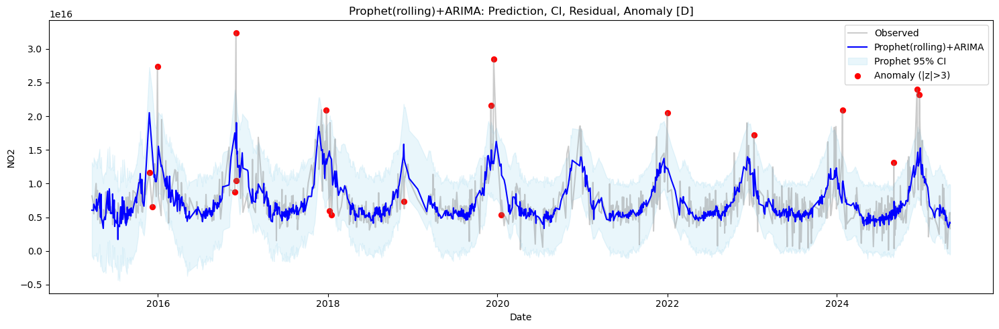

02:34:44 - cmdstanpy - INFO - Chain [1] start processing
02:34:44 - cmdstanpy - INFO - Chain [1] done processing
02:34:44 - cmdstanpy - INFO - Chain [1] start processing
02:34:44 - cmdstanpy - INFO - Chain [1] done processing
02:34:44 - cmdstanpy - INFO - Chain [1] start processing
02:34:44 - cmdstanpy - INFO - Chain [1] done processing
02:34:44 - cmdstanpy - INFO - Chain [1] start processing
02:34:45 - cmdstanpy - INFO - Chain [1] done processing
02:34:45 - cmdstanpy - INFO - Chain [1] start processing
02:34:45 - cmdstanpy - INFO - Chain [1] done processing
02:34:45 - cmdstanpy - INFO - Chain [1] start processing
02:34:45 - cmdstanpy - INFO - Chain [1] done processing
02:34:45 - cmdstanpy - INFO - Chain [1] start processing
02:34:45 - cmdstanpy - INFO - Chain [1] done processing
02:34:45 - cmdstanpy - INFO - Chain [1] start processing
02:34:46 - cmdstanpy - INFO - Chain [1] done processing
02:34:46 - cmdstanpy - INFO - Chain [1] start processing
02:34:46 - cmdstanpy - INFO - Chain [1]

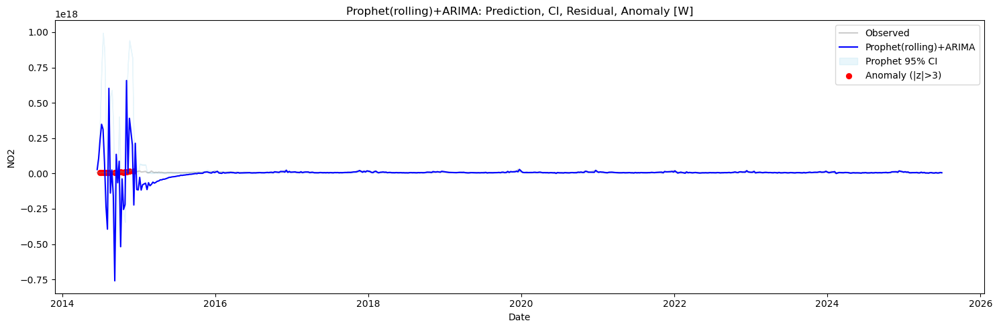

02:35:12 - cmdstanpy - INFO - Chain [1] start processing
02:35:12 - cmdstanpy - INFO - Chain [1] done processing
02:35:13 - cmdstanpy - INFO - Chain [1] start processing
02:35:17 - cmdstanpy - INFO - Chain [1] done processing
02:35:17 - cmdstanpy - INFO - Chain [1] start processing
02:35:17 - cmdstanpy - INFO - Chain [1] done processing
02:35:17 - cmdstanpy - INFO - Chain [1] start processing
02:35:17 - cmdstanpy - INFO - Chain [1] done processing
02:35:18 - cmdstanpy - INFO - Chain [1] start processing
02:35:18 - cmdstanpy - INFO - Chain [1] done processing
02:35:18 - cmdstanpy - INFO - Chain [1] start processing
02:35:19 - cmdstanpy - INFO - Chain [1] done processing
02:35:19 - cmdstanpy - INFO - Chain [1] start processing
02:35:19 - cmdstanpy - INFO - Chain [1] done processing
02:35:19 - cmdstanpy - INFO - Chain [1] start processing
02:35:19 - cmdstanpy - INFO - Chain [1] done processing
02:35:19 - cmdstanpy - INFO - Chain [1] start processing
02:35:20 - cmdstanpy - INFO - Chain [1]

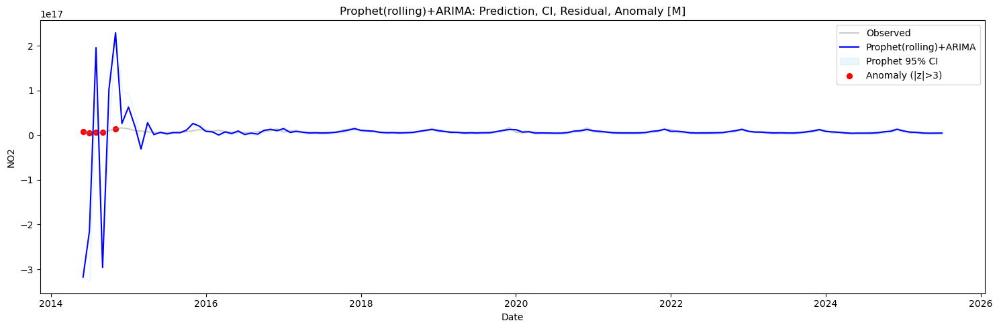

In [93]:
df_yhn_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yhn_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=140, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_yhn_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yhn_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=20, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_yhn_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yhn_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=5, test_steps=2, step=1, z_thresh=3, freq='M', plot=True
)

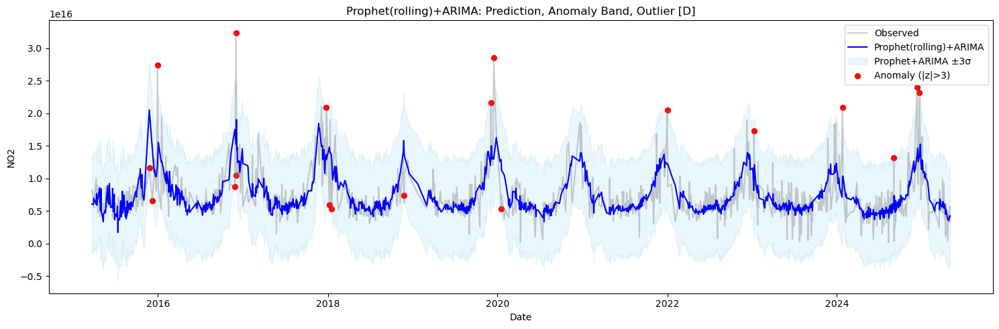

In [94]:
plot_arima_anomaly_band(df_yhn_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


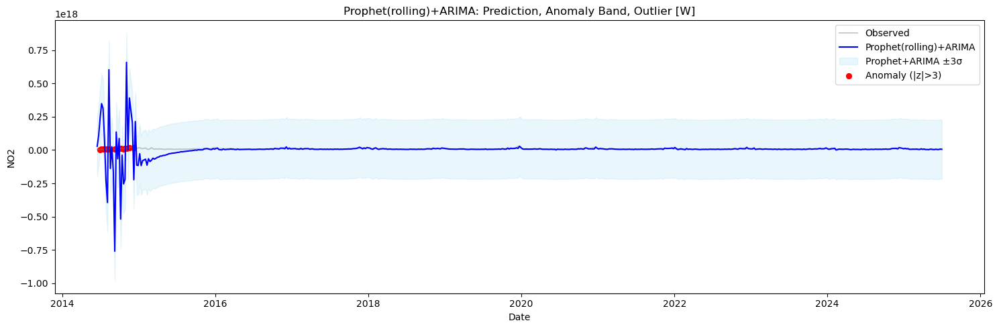

In [95]:
plot_arima_anomaly_band(df_yhn_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


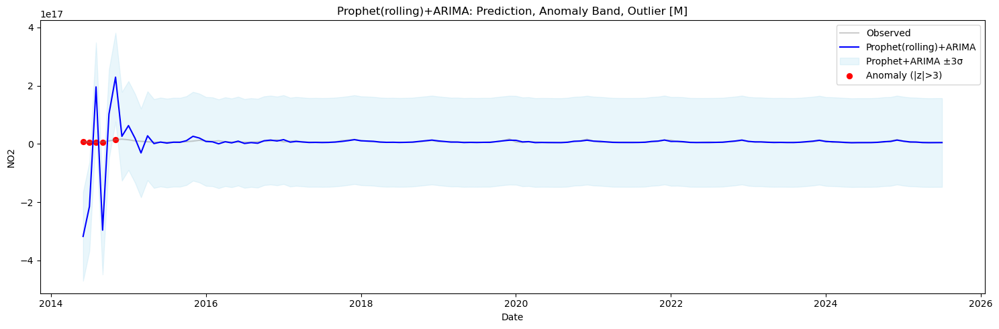

In [96]:
plot_arima_anomaly_band(df_yhn_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


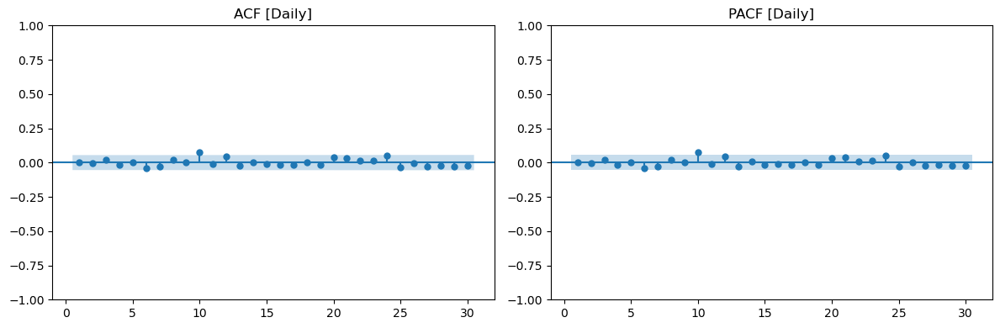

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  12.588002   0.247628
20  19.625267   0.481579
30  29.779003   0.477013



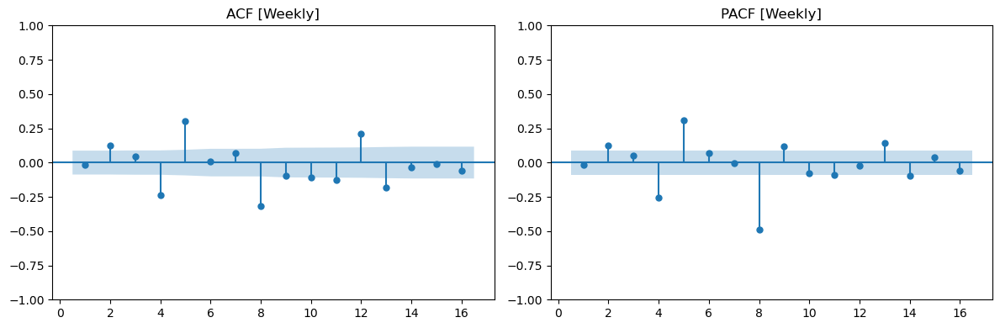

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
       lb_stat     lb_pvalue
8   138.046474  6.045505e-26
12  179.499648  5.404223e-32
16  199.291691  1.102631e-33



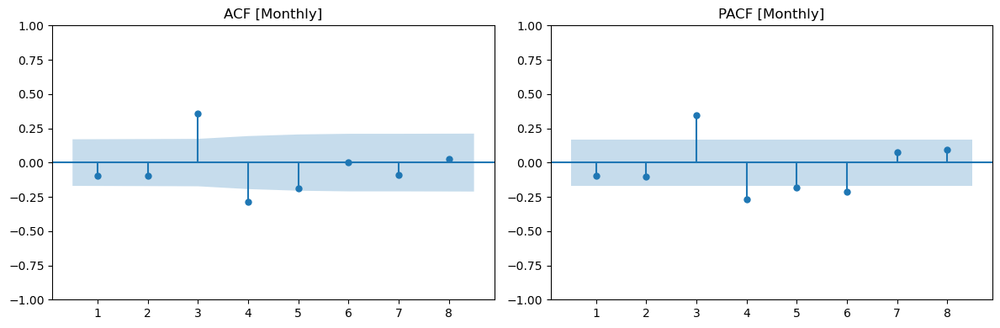

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  31.702979   0.000002
8  38.017979   0.000007



In [97]:
# Daily residual
residual_diagnostics(df_yhn_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_yhn_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_yhn_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Shidongkou plant

In [98]:
df_sdk_NASA = pd.read_csv('Huaneng/Shidongkou.csv')
df_sdk_NASA = cleaning_NASA_data(df_sdk_NASA,'NO2')
df_sdk_NASA

,date,NO2
0,2014-01-02,4.845388e+15
1,2014-01-04,5.062466e+15
2,2014-01-05,1.550404e+16
3,2014-01-07,9.727311e+15
4,2014-01-09,7.155701e+15
...,...,...
1629,2025-06-20,1.422261e+14
1630,2025-06-21,7.869330e+15
1631,2025-06-23,5.293108e+15
1632,2025-06-26,7.106226e+15


02:37:10 - cmdstanpy - INFO - Chain [1] start processing
02:37:10 - cmdstanpy - INFO - Chain [1] done processing
02:37:10 - cmdstanpy - INFO - Chain [1] start processing
02:37:10 - cmdstanpy - INFO - Chain [1] done processing
02:37:11 - cmdstanpy - INFO - Chain [1] start processing
02:37:11 - cmdstanpy - INFO - Chain [1] done processing
02:37:11 - cmdstanpy - INFO - Chain [1] start processing
02:37:11 - cmdstanpy - INFO - Chain [1] done processing
02:37:11 - cmdstanpy - INFO - Chain [1] start processing
02:37:11 - cmdstanpy - INFO - Chain [1] done processing
02:37:11 - cmdstanpy - INFO - Chain [1] start processing
02:37:11 - cmdstanpy - INFO - Chain [1] done processing
02:37:11 - cmdstanpy - INFO - Chain [1] start processing
02:37:11 - cmdstanpy - INFO - Chain [1] done processing
02:37:11 - cmdstanpy - INFO - Chain [1] start processing
02:37:11 - cmdstanpy - INFO - Chain [1] done processing
02:37:12 - cmdstanpy - INFO - Chain [1] start processing
02:37:12 - cmdstanpy - INFO - Chain [1]

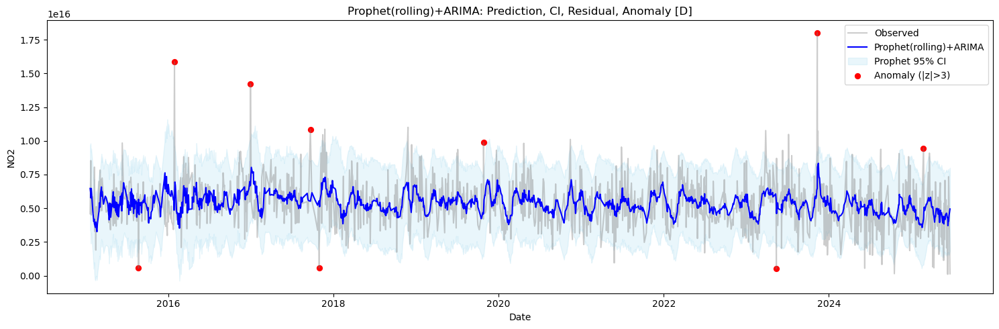

02:37:22 - cmdstanpy - INFO - Chain [1] start processing
02:37:22 - cmdstanpy - INFO - Chain [1] done processing
02:37:23 - cmdstanpy - INFO - Chain [1] start processing
02:37:23 - cmdstanpy - INFO - Chain [1] done processing
02:37:23 - cmdstanpy - INFO - Chain [1] start processing
02:37:23 - cmdstanpy - INFO - Chain [1] done processing
02:37:23 - cmdstanpy - INFO - Chain [1] start processing
02:37:23 - cmdstanpy - INFO - Chain [1] done processing
02:37:23 - cmdstanpy - INFO - Chain [1] start processing
02:37:23 - cmdstanpy - INFO - Chain [1] done processing
02:37:24 - cmdstanpy - INFO - Chain [1] start processing
02:37:24 - cmdstanpy - INFO - Chain [1] done processing
02:37:24 - cmdstanpy - INFO - Chain [1] start processing
02:37:24 - cmdstanpy - INFO - Chain [1] done processing
02:37:24 - cmdstanpy - INFO - Chain [1] start processing
02:37:24 - cmdstanpy - INFO - Chain [1] done processing
02:37:24 - cmdstanpy - INFO - Chain [1] start processing
02:37:24 - cmdstanpy - INFO - Chain [1]

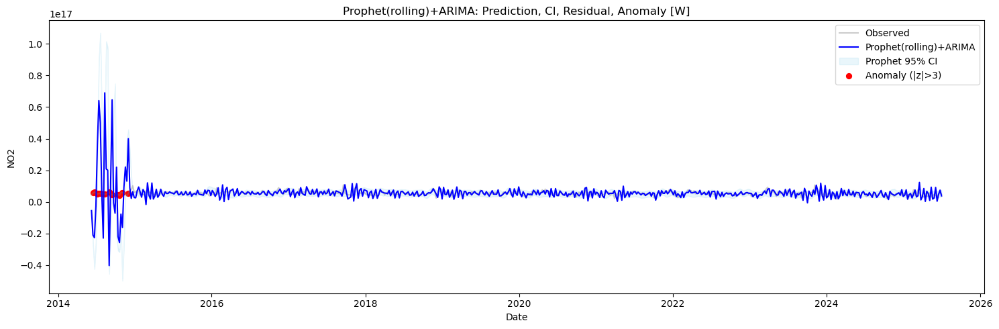

02:37:52 - cmdstanpy - INFO - Chain [1] start processing
02:37:53 - cmdstanpy - INFO - Chain [1] done processing
02:37:53 - cmdstanpy - INFO - Chain [1] start processing
02:37:54 - cmdstanpy - INFO - Chain [1] done processing
02:37:54 - cmdstanpy - INFO - Chain [1] start processing
02:37:54 - cmdstanpy - INFO - Chain [1] done processing
02:37:54 - cmdstanpy - INFO - Chain [1] start processing
02:37:54 - cmdstanpy - INFO - Chain [1] done processing
02:37:54 - cmdstanpy - INFO - Chain [1] start processing
02:37:54 - cmdstanpy - INFO - Chain [1] done processing
02:37:55 - cmdstanpy - INFO - Chain [1] start processing
02:37:55 - cmdstanpy - INFO - Chain [1] done processing
02:37:55 - cmdstanpy - INFO - Chain [1] start processing
02:37:55 - cmdstanpy - INFO - Chain [1] done processing
02:37:55 - cmdstanpy - INFO - Chain [1] start processing
02:38:01 - cmdstanpy - INFO - Chain [1] done processing
02:38:02 - cmdstanpy - INFO - Chain [1] start processing
02:38:02 - cmdstanpy - INFO - Chain [1]

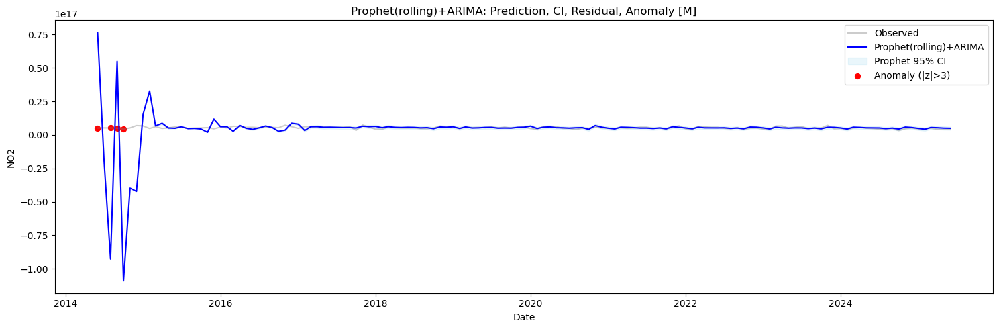

In [99]:
df_sdk_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sdk_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=160, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_sdk_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sdk_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=22, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_sdk_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sdk_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=5, test_steps=2, step=1, z_thresh=3, freq='M', plot=True
)

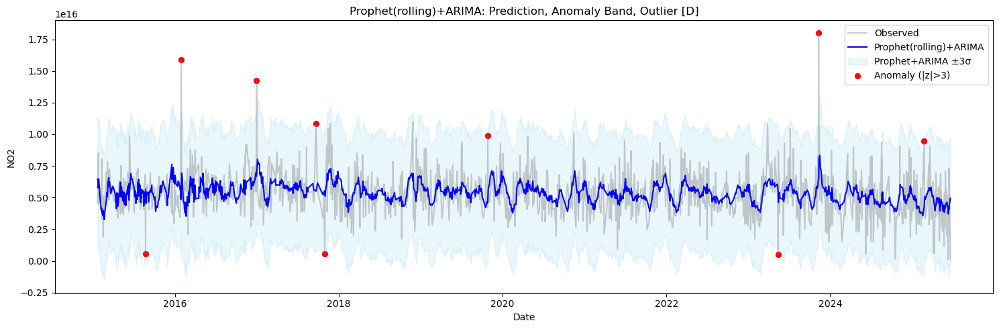

In [100]:
plot_arima_anomaly_band(df_sdk_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


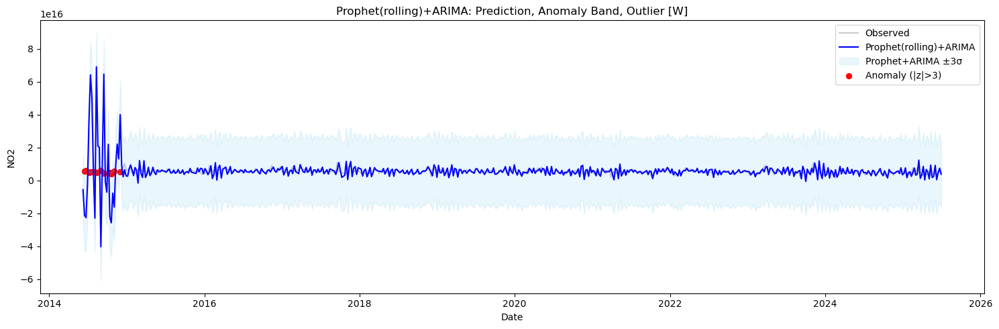

In [101]:
plot_arima_anomaly_band(df_sdk_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


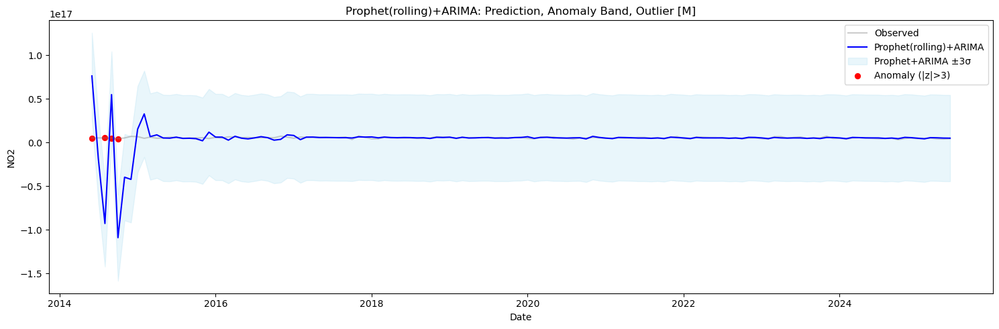

In [102]:
plot_arima_anomaly_band(df_sdk_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


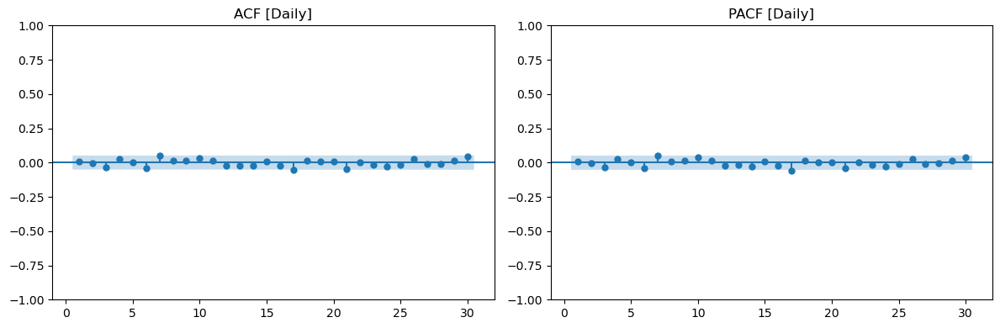

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  11.950989   0.288350
20  20.072991   0.453372
30  30.901063   0.420283



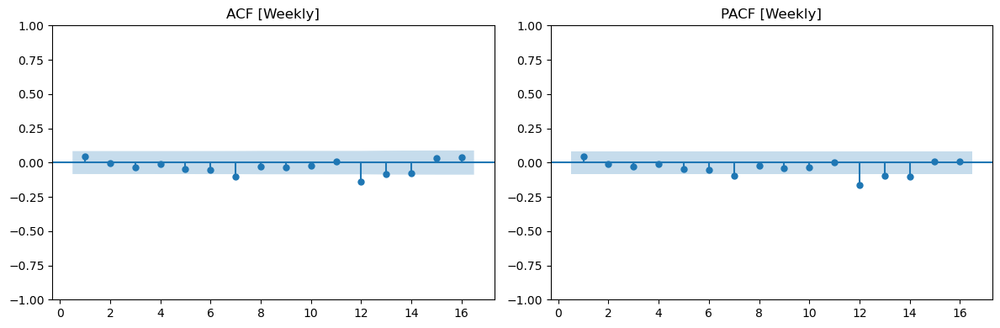

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   11.168200   0.192350
12  23.539186   0.023482
16  32.476891   0.008663



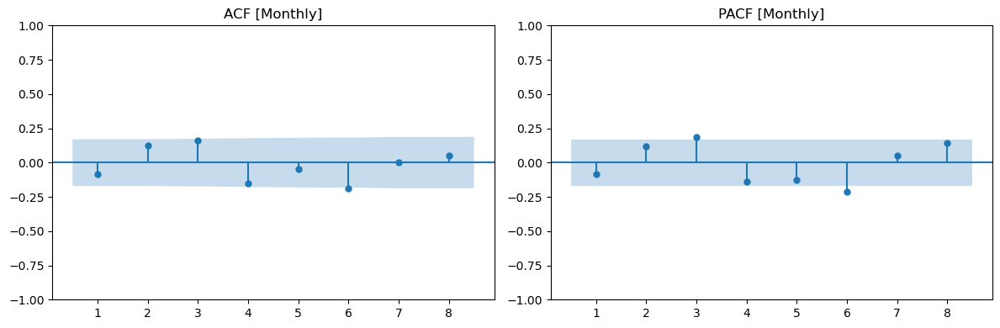

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4   9.705190   0.045698
8  15.519874   0.049791



In [103]:
# Daily residual
residual_diagnostics(df_sdk_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_sdk_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_sdk_monthly_result_nasa, lags=[4,8], title='[Monthly]')